In [2]:
import os
import glob

basedir = 'vehicles/'

img_types = os.listdir(basedir)
cars = []
for img_type in img_types:
    cars.extend(glob.glob(basedir+img_type+'/*'))
    
print('Number of Vehicle Images Found:', len(cars))

with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'/n')
        
basedir = 'non-vehicles/'

img_types = os.listdir(basedir)
notcars = []
for img_type in img_types:
    notcars.extend(glob.glob(basedir+img_type+'/*'))

print('Number if Non-Vehicle Images Found:', len(notcars))

with open('notcars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'/n')

Number of Vehicle Images Found: 8792
Number if Non-Vehicle Images Found: 8968


In [3]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip

In [4]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features
    
def bin_spatial(img, color_space='RGB', size=(64, 64)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins)
    ghist = np.histogram(img[:,:,1], bins=nbins)
    bhist = np.histogram(img[:,:,2], bins=nbins)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, 
                        viz=False, viz_only=False, hog_viz_name="", viz_title="HOG Viz"):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if viz == True:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature, hog_image = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=True, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
                # Plot HOG visualisation
                
                if viz_only == True:
                    fig = plt.figure()
                    plt.imshow(hog_image)
                    plt.title(viz_title)
                    plt.savefig(hog_viz_name, bbox_inches='tight')
                    
                else:
                    fig = plt.figure()
                    plt.subplot(121)
                    plt.imshow(image)
                    plt.title('Example Image')
                    plt.subplot(122)
                    plt.imshow(hog_image)
                    plt.title('Example HOG viz')
                    plt.savefig(hog_viz_name + "_double", bbox_inches='tight')
                
            else:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=False, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient,
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)
    if vis == True:
        return np.concatenate(img_features), hog_image 
    else:
        return np.concatenate(img_features)

def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
        

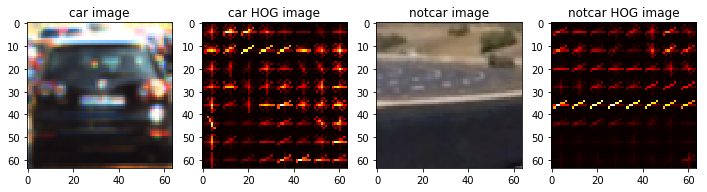

In [5]:
%matplotlib inline

car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

color_space = 'RGB'
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 
spatial_size = (16,16)
hist_bins = 16
spatial_feat = True
hist_feat = True 
hog_feat = True

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

In [7]:
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (64, 64)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars #np.array(cars)[random_idxs]
test_notcars = notcars #np.array(notcars)[random_idxs]

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using:',orient,'orientations,',pix_per_cell,
     'pixels per cell, ', cell_per_block, 'cells per block, ',
     hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')
print('Feature vector length:', len(X_train[0]))

svc = LinearSVC()

t=time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))


111.48700618743896 Seconds to compute features...
Using: 9 orientations, 8 pixels per cell,  2 cells per block,  32 histogram bins, and (64, 64) spatial sampling
Feature vector length: 17676
42.06 Seconds to train SVC...
Test Accuracy of SVC =  0.9865


0.0 1.0
0.6674718856811523 seconds to process one image searching 100 windows
0.0 1.0
0.4903090000152588 seconds to process one image searching 100 windows
0.0 1.0
0.4949679374694824 seconds to process one image searching 100 windows
0.0 1.0
0.47189903259277344 seconds to process one image searching 100 windows
0.0 1.0
0.4845869541168213 seconds to process one image searching 100 windows
0.0 1.0
0.48375487327575684 seconds to process one image searching 100 windows


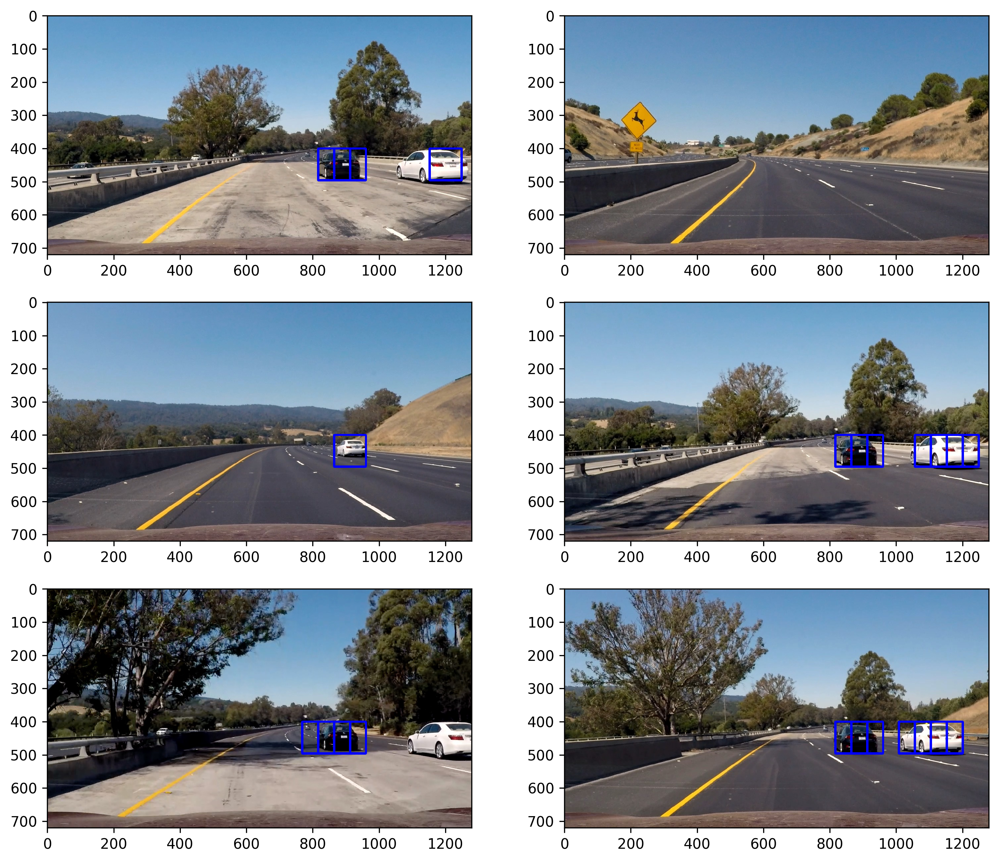

In [8]:
searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
y_start_stop = [400, 656]
overlap = 0.5
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))

    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
                        xy_window=(96, 96), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                            spatial_size=spatial_size, hist_bins=hist_bins,
                            orient=orient, pix_per_cell=pix_per_cell,
                            cell_per_block=cell_per_block,
                            hog_channel=hog_channel, spatial_feat=spatial_feat,
                            hist_feat=hist_feat, hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)

In [9]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

0.46238279342651367 seconds to run, total windows =  294
0.48752379417419434 seconds to run, total windows =  294
0.4209480285644531 seconds to run, total windows =  294
0.40230512619018555 seconds to run, total windows =  294
0.3985249996185303 seconds to run, total windows =  294
0.4777350425720215 seconds to run, total windows =  294


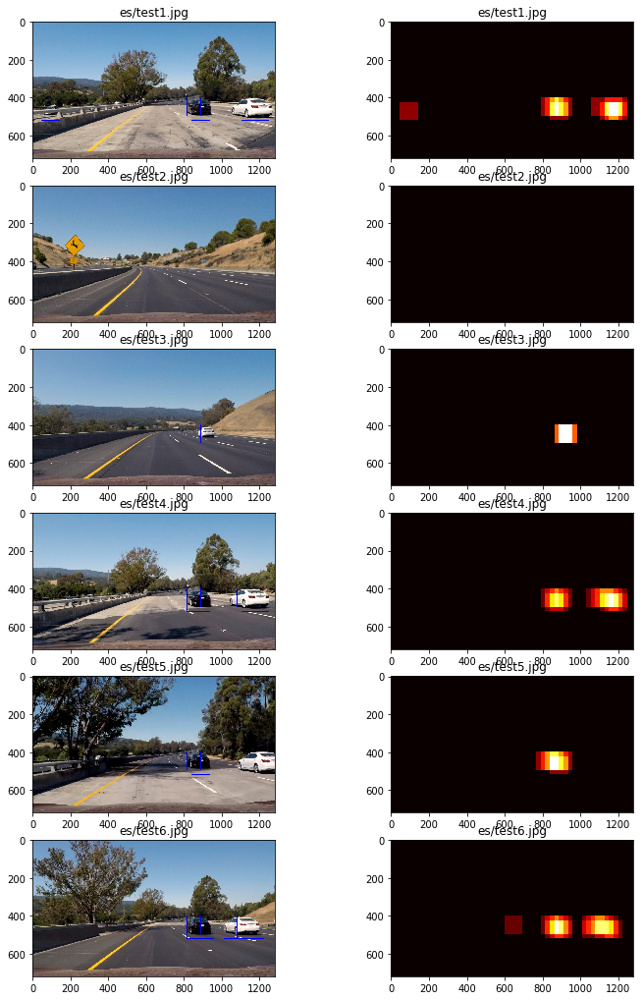

In [10]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []

ystart = 400
ystop = 656
scale = 1.5
    
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

0.4038269519805908 seconds to run, total windows =  304
0.24609708786010742 seconds to run, total windows =  196
0.21310901641845703 seconds to run, total windows =  144


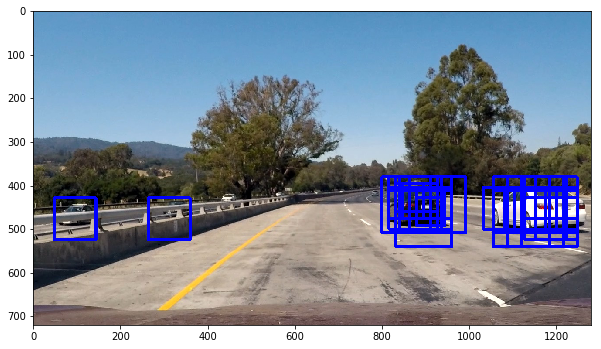

In [22]:
def find_cars (img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale):
    img_boxes = []
    t = time.time()
    count = 0
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv=conv)
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    return(img_boxes)

car_rectangles = None
out_images = []
out_titles = []
all_rectangles = []
window = 64
orient = 9
pix_per_cell = 8
cell_per_block = 2
conv = 'RGB2YCrCb'
test_img = mpimg.imread('./test_images/test1.jpg')

ystart = 380
ystop = 508
scale = 1.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

ystart = 380
ystop = 572
scale = 1.5
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

scale = 2.0
ystart = 380
ystop = 636
scale = 2.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

rectangles = [item for sublist in all_rectangles for item in sublist]

img_final = draw_boxes(test_img, rectangles, color=(0,0,255), thick=6)
plt.figure(figsize=(10,10))
plt.imshow(img_final)


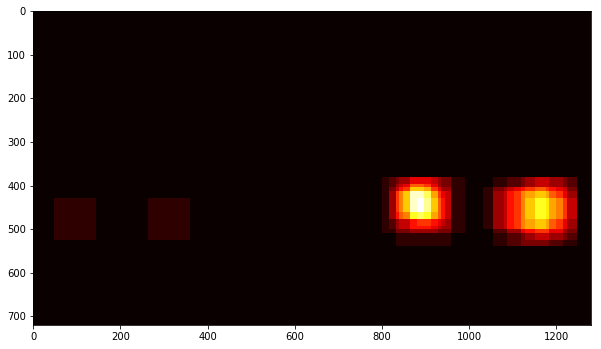

In [23]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

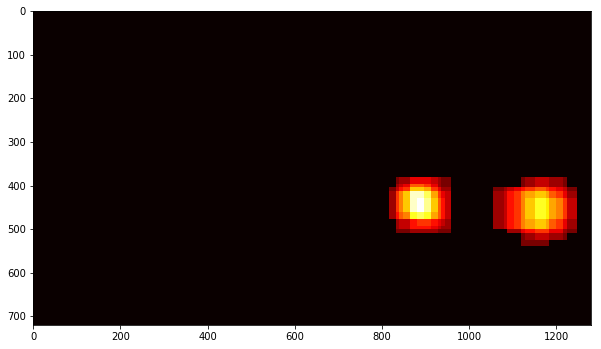

In [24]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

heatmap_img = apply_threshold(heatmap_img, 2)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

2 cars found


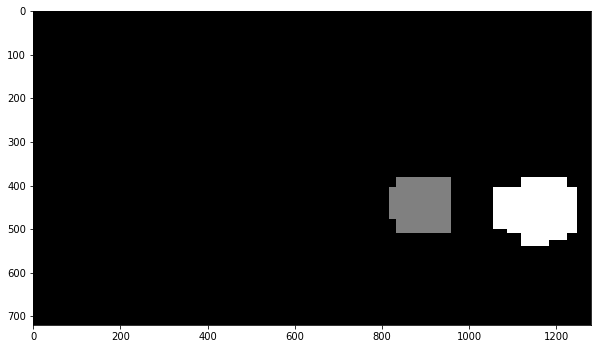

In [25]:
labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

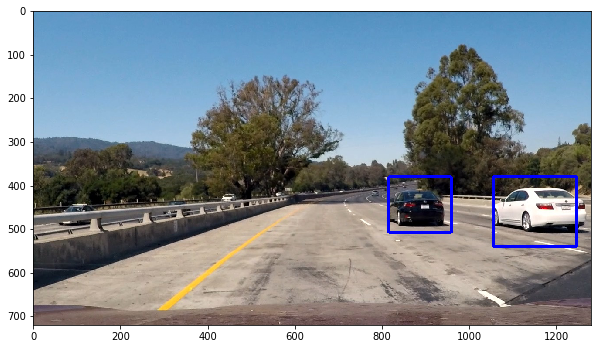

In [26]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

In [27]:
def process_img_pipeline(img): 
    car_rectangles = None
    out_images = []
    out_titles = []
    all_rectangles = []
    window = 64
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    conv = 'RGB2YCrCb'
    test_img = img

    ystart = 400
    ystop = 528
    scale = 1.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    ystart = 400
    ystop = 592
    scale = 1.5
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    scale = 2.0
    ystart = 400
    ystop = 656
    scale = 2.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    rectangles = [item for sublist in all_rectangles for item in sublist]
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    
    heatmap_img = apply_threshold(heatmap_img, 1)
    
    labels = label(heatmap_img)
    
    draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    return draw_img

In [28]:
clip_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.364987850189209 seconds to run, total windows =  304
0.22859597206115723 seconds to run, total windows =  196
0.1989459991455078 seconds to run, total windows =  144
[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4


  0%|          | 0/39 [00:00<?, ?it/s]

0.47357821464538574 seconds to run, total windows =  304
0.22104096412658691 seconds to run, total windows =  196
0.1959068775177002 seconds to run, total windows =  144


  3%|▎         | 1/39 [00:00<00:34,  1.09it/s]

0.39174604415893555 seconds to run, total windows =  304
0.24447298049926758 seconds to run, total windows =  196
0.18815994262695312 seconds to run, total windows =  144


  5%|▌         | 2/39 [00:01<00:33,  1.11it/s]

0.4718630313873291 seconds to run, total windows =  304


  8%|▊         | 3/39 [00:02<00:34,  1.06it/s]

0.38051605224609375 seconds to run, total windows =  196
0.1638028621673584 seconds to run, total windows =  144
0.5105969905853271 seconds to run, total windows =  304


 10%|█         | 4/39 [00:03<00:33,  1.04it/s]

0.28270602226257324 seconds to run, total windows =  196
0.17226696014404297 seconds to run, total windows =  144
0.4309258460998535 seconds to run, total windows =  304
0.26136016845703125 seconds to run, total windows =  196
0.19506406784057617 seconds to run, total windows =  144


 13%|█▎        | 5/39 [00:04<00:32,  1.05it/s]

0.39115095138549805 seconds to run, total windows =  304


 15%|█▌        | 6/39 [00:05<00:30,  1.08it/s]

0.2622520923614502 seconds to run, total windows =  196
0.1773061752319336 seconds to run, total windows =  144
0.4001450538635254 seconds to run, total windows =  304
0.22251486778259277 seconds to run, total windows =  196
0.19412803649902344 seconds to run, total windows =  144


 18%|█▊        | 7/39 [00:06<00:28,  1.11it/s]

0.43117594718933105 seconds to run, total windows =  304


 21%|██        | 8/39 [00:07<00:28,  1.09it/s]

0.3319859504699707 seconds to run, total windows =  196
0.1683659553527832 seconds to run, total windows =  144
0.379105806350708 seconds to run, total windows =  304
0.22324895858764648 seconds to run, total windows =  196
0.1909940242767334 seconds to run, total windows =  144


 23%|██▎       | 9/39 [00:08<00:26,  1.12it/s]

0.3964529037475586 seconds to run, total windows =  304
0.2314589023590088 seconds to run, total windows =  196


 26%|██▌       | 10/39 [00:09<00:26,  1.09it/s]

0.3077549934387207 seconds to run, total windows =  144
0.39647698402404785 seconds to run, total windows =  304
0.22256803512573242 seconds to run, total windows =  196
0.1993851661682129 seconds to run, total windows =  144


 28%|██▊       | 11/39 [00:10<00:25,  1.12it/s]

0.3867509365081787 seconds to run, total windows =  304
0.22743797302246094 seconds to run, total windows =  196
0.19631409645080566 seconds to run, total windows =  144


 31%|███       | 12/39 [00:10<00:23,  1.14it/s]

0.3706939220428467 seconds to run, total windows =  304
0.22267985343933105 seconds to run, total windows =  196
0.1873769760131836 seconds to run, total windows =  144


 33%|███▎      | 13/39 [00:11<00:22,  1.16it/s]

0.3787670135498047 seconds to run, total windows =  304
0.23688983917236328 seconds to run, total windows =  196
0.1939840316772461 seconds to run, total windows =  144


 36%|███▌      | 14/39 [00:12<00:21,  1.17it/s]

0.3787119388580322 seconds to run, total windows =  304
0.21220803260803223 seconds to run, total windows =  196
0.19279789924621582 seconds to run, total windows =  144


 38%|███▊      | 15/39 [00:13<00:20,  1.19it/s]

0.3773000240325928 seconds to run, total windows =  304


 41%|████      | 16/39 [00:14<00:19,  1.20it/s]

0.21914386749267578 seconds to run, total windows =  196
0.1814868450164795 seconds to run, total windows =  144
0.48085594177246094 seconds to run, total windows =  304
0.2414720058441162 seconds to run, total windows =  196
0.18988800048828125 seconds to run, total windows =  144


 44%|████▎     | 17/39 [00:15<00:19,  1.16it/s]

0.4195079803466797 seconds to run, total windows =  304
0.3564720153808594 seconds to run, total windows =  196
0.18909907341003418 seconds to run, total windows =  144


 46%|████▌     | 18/39 [00:16<00:19,  1.10it/s]

0.43802905082702637 seconds to run, total windows =  304
0.40621089935302734 seconds to run, total windows =  196


 49%|████▊     | 19/39 [00:17<00:19,  1.01it/s]

0.3178420066833496 seconds to run, total windows =  144
0.8319499492645264 seconds to run, total windows =  304
0.24219393730163574 seconds to run, total windows =  196


 51%|█████▏    | 20/39 [00:18<00:21,  1.14s/it]

0.34047889709472656 seconds to run, total windows =  144
0.761437177658081 seconds to run, total windows =  304
0.46520400047302246 seconds to run, total windows =  196


 54%|█████▍    | 21/39 [00:20<00:23,  1.29s/it]

0.3466320037841797 seconds to run, total windows =  144
0.6685788631439209 seconds to run, total windows =  304
0.40119504928588867 seconds to run, total windows =  196


 56%|█████▋    | 22/39 [00:21<00:22,  1.32s/it]

0.3076601028442383 seconds to run, total windows =  144
0.5192818641662598 seconds to run, total windows =  304
0.3217909336090088 seconds to run, total windows =  196
0.1976311206817627

 59%|█████▉    | 23/39 [00:22<00:20,  1.25s/it]

 seconds to run, total windows =  144
0.5808279514312744 seconds to run, total windows =  304
0.4921538829803467 seconds to run, total windows =  196


 62%|██████▏   | 24/39 [00:24<00:19,  1.29s/it]

0.22146296501159668 seconds to run, total windows =  144
0.7126889228820801 seconds to run, total windows =  304
0.2629721164703369 seconds to run, total windows =  196


 64%|██████▍   | 25/39 [00:25<00:18,  1.30s/it]

0.27426719665527344 seconds to run, total windows =  144
0.7215678691864014 seconds to run, total windows =  304
0.371628999710083 seconds to run, total windows =  196


 67%|██████▋   | 26/39 [00:27<00:17,  1.36s/it]

0.35884904861450195 seconds to run, total windows =  144
0.7421469688415527 seconds to run, total windows =  304
0.5240731239318848 seconds to run, total windows =  196


 69%|██████▉   | 27/39 [00:28<00:17,  1.44s/it]

0.32390904426574707 seconds to run, total windows =  144
0.5925800800323486 seconds to run, total windows =  304
0.2503829002380371 seconds to run, total windows =  196


 72%|███████▏  | 28/39 [00:29<00:14,  1.34s/it]

0.21370291709899902 seconds to run, total windows =  144
0.5892729759216309 seconds to run, total windows =  304
0.3656461238861084 seconds to run, total windows =  196


 74%|███████▍  | 29/39 [00:31<00:13,  1.32s/it]

0.2740950584411621 seconds to run, total windows =  144
0.6985058784484863 seconds to run, total windows =  304
0.38874316215515137 seconds to run, total windows =  196


 77%|███████▋  | 30/39 [00:32<00:12,  1.35s/it]

0.28558897972106934 seconds to run, total windows =  144
0.43924403190612793 seconds to run, total windows =  304
0.22642207145690918 seconds to run, total windows =  196
0.18292498588562012 seconds to run, total windows =  144


 79%|███████▉  | 31/39 [00:33<00:09,  1.21s/it]

0.42195820808410645 seconds to run, total windows =  304
0.2862670421600342 seconds to run, total windows =  196


 82%|████████▏ | 32/39 [00:34<00:07,  1.14s/it]

0.21989893913269043 seconds to run, total windows =  144
0.3654961585998535 seconds to run, total windows =  304


 85%|████████▍ | 33/39 [00:35<00:06,  1.03s/it]

0.22423791885375977 seconds to run, total windows =  196
0.17203283309936523 seconds to run, total windows =  144
0.3612971305847168 seconds to run, total windows =  304


 87%|████████▋ | 34/39 [00:35<00:04,  1.04it/s]

0.22075581550598145 seconds to run, total windows =  196
0.17075085639953613 seconds to run, total windows =  144
0.36317896842956543 seconds to run, total windows =  304


 90%|████████▉ | 35/39 [00:36<00:03,  1.09it/s]

0.2715609073638916 seconds to run, total windows =  196
0.17096495628356934 seconds to run, total windows =  144
0.419903039932251 seconds to run, total windows =  304


 92%|█████████▏| 36/39 [00:37<00:02,  1.11it/s]

0.2296760082244873 seconds to run, total windows =  196
0.17536211013793945 seconds to run, total windows =  144
0.37036919593811035 seconds to run, total windows =  304


 95%|█████████▍| 37/39 [00:38<00:01,  1.14it/s]

0.24220013618469238 seconds to run, total windows =  196
0.1773698329925537 seconds to run, total windows =  144
0.4651188850402832 seconds to run, total windows =  304


 97%|█████████▋| 38/39 [00:39<00:00,  1.11it/s]

0.28616905212402344 seconds to run, total windows =  196
0.17310619354248047 seconds to run, total windows =  144


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 35.2 s, sys: 2.89 s, total: 38.1 s
Wall time: 41.1 s


In [29]:
clip_out_file = 'project_video_out.mp4'
clip_test = VideoFileClip('project_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.396716833114624 seconds to run, total windows =  304
0.2500648498535156 seconds to run, total windows =  196
0.20032191276550293 seconds to run, total windows =  144
[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

0.5233039855957031 seconds to run, total windows =  304


  0%|          | 1/1261 [00:00<20:47,  1.01it/s]

0.2595789432525635 seconds to run, total windows =  196
0.18709802627563477 seconds to run, total windows =  144
0.40296292304992676 seconds to run, total windows =  304
0.3441479206085205 seconds to run, total windows =  196
0.18914103507995605 seconds to run, total windows =  144


  0%|          | 2/1261 [00:01<20:35,  1.02it/s]

0.5545179843902588 seconds to run, total windows =  304
0.5288760662078857 seconds to run, total windows =  196


  0%|          | 3/1261 [00:03<24:07,  1.15s/it]

0.417680025100708 seconds to run, total windows =  144
0.5164389610290527 seconds to run, total windows =  304
0.2794010639190674 seconds to run, total windows =  196


  0%|          | 4/1261 [00:04<23:23,  1.12s/it]

0.21222209930419922 seconds to run, total windows =  144
0.5272929668426514 seconds to run, total windows =  304
0.252194881439209 seconds to run, total windows =  196


  0%|          | 5/1261 [00:05<23:00,  1.10s/it]

0.2488110065460205 seconds to run, total windows =  144
0.40245509147644043 seconds to run, total windows =  304


  0%|          | 6/1261 [00:06<21:31,  1.03s/it]

0.24982714653015137 seconds to run, total windows =  196
0.1830751895904541 seconds to run, total windows =  144
0.40990686416625977 seconds to run, total windows =  304
0.23357105255126953 seconds to run, total windows =  196


  1%|          | 7/1261 [00:07<20:34,  1.02it/s]

0.21453404426574707 seconds to run, total windows =  144
0.40729618072509766 seconds to run, total windows =  304
0.2844579219818115 seconds to run, total windows =  196
0.19271206855773926 seconds to run, total windows =  144


  1%|          | 8/1261 [00:08<20:10,  1.04it/s]

0.38287806510925293 seconds to run, total windows =  304
0.22873497009277344 seconds to run, total windows =  196
0.19179296493530273 seconds to run, total windows =  144


  1%|          | 9/1261 [00:09<19:16,  1.08it/s]

0.388110876083374 seconds to run, total windows =  304
0.25057196617126465 seconds to run, total windows =  196
0.2082209587097168

  1%|          | 10/1261 [00:09<18:56,  1.10it/s]

 seconds to run, total windows =  144
0.3911159038543701 seconds to run, total windows =  304
0.22022199630737305 seconds to run, total windows =  196
0.20249390602111816

  1%|          | 11/1261 [00:10<18:30,  1.13it/s]

 seconds to run, total windows =  144
0.4060029983520508 seconds to run, total windows =  304
0.2988760471343994 seconds to run, total windows =  196
0.2026050090789795

  1%|          | 12/1261 [00:11<18:47,  1.11it/s]

 seconds to run, total windows =  144
0.6754190921783447 seconds to run, total windows =  304
0.37914490699768066 seconds to run, total windows =  196


  1%|          | 13/1261 [00:13<21:35,  1.04s/it]

0.2618989944458008 seconds to run, total windows =  144
0.5829529762268066 seconds to run, total windows =  304
0.37625694274902344 seconds to run, total windows =  196


  1%|          | 14/1261 [00:14<23:12,  1.12s/it]

0.29092907905578613 seconds to run, total windows =  144
0.4865450859069824 seconds to run, total windows =  304


  1%|          | 15/1261 [00:15<22:05,  1.06s/it]

0.2415919303894043 seconds to run, total windows =  196
0.1843400001525879 seconds to run, total windows =  144
0.41704511642456055 seconds to run, total windows =  304


  1%|▏         | 16/1261 [00:16<20:42,  1.00it/s]

0.22298622131347656 seconds to run, total windows =  196
0.18398404121398926 seconds to run, total windows =  144
0.3832581043243408 seconds to run, total windows =  304


  1%|▏         | 17/1261 [00:17<19:38,  1.06it/s]

0.2365281581878662 seconds to run, total windows =  196
0.18464398384094238 seconds to run, total windows =  144
0.38706207275390625 seconds to run, total windows =  304


  1%|▏         | 18/1261 [00:17<19:00,  1.09it/s]

0.2703080177307129 seconds to run, total windows =  196
0.1697549819946289 seconds to run, total windows =  144
0.3917961120605469 seconds to run, total windows =  304


  2%|▏         | 19/1261 [00:18<18:18,  1.13it/s]

0.22361516952514648 seconds to run, total windows =  196
0.17127585411071777 seconds to run, total windows =  144
0.34807300567626953 seconds to run, total windows =  304


  2%|▏         | 20/1261 [00:19<17:34,  1.18it/s]

0.23329997062683105 seconds to run, total windows =  196
0.16970014572143555 seconds to run, total windows =  144
0.37460803985595703 seconds to run, total windows =  304


  2%|▏         | 21/1261 [00:20<17:31,  1.18it/s]

0.27086305618286133 seconds to run, total windows =  196
0.17735004425048828 seconds to run, total windows =  144
0.3479139804840088 seconds to run, total windows =  304
0.35634899139404297 seconds to run, total windows =  196


  2%|▏         | 22/1261 [00:21<18:26,  1.12it/s]

0.256641149520874 seconds to run, total windows =  144
0.501964807510376 seconds to run, total windows =  304
0.3167390823364258 seconds to run, total windows =  196


  2%|▏         | 23/1261 [00:22<19:52,  1.04it/s]

0.2730379104614258 seconds to run, total windows =  144
0.5318191051483154 seconds to run, total windows =  304
0.35022401809692383 seconds to run, total windows =  196


  2%|▏         | 24/1261 [00:23<21:03,  1.02s/it]

0.24409699440002441 seconds to run, total windows =  144
0.5149271488189697 seconds to run, total windows =  304


  2%|▏         | 25/1261 [00:24<20:54,  1.02s/it]

0.283876895904541 seconds to run, total windows =  196
0.17769193649291992 seconds to run, total windows =  144
0.4695141315460205 seconds to run, total windows =  304


  2%|▏         | 26/1261 [00:25<20:25,  1.01it/s]

0.2739129066467285 seconds to run, total windows =  196
0.17053914070129395 seconds to run, total windows =  144
0.3486979007720947 seconds to run, total windows =  304


  2%|▏         | 27/1261 [00:26<19:03,  1.08it/s]

0.2280261516571045 seconds to run, total windows =  196
0.17904996871948242 seconds to run, total windows =  144
0.3985099792480469 seconds to run, total windows =  304
0.2633500099182129 seconds to run, total windows =  196
0.20071005821228027

  2%|▏         | 28/1261 [00:27<18:46,  1.09it/s]

 seconds to run, total windows =  144
0.4643080234527588 seconds to run, total windows =  304
0.34827089309692383 seconds to run, total windows =  196


  2%|▏         | 29/1261 [00:28<20:33,  1.00s/it]

0.36815309524536133 seconds to run, total windows =  144
0.43431806564331055 seconds to run, total windows =  304


  2%|▏         | 30/1261 [00:29<19:58,  1.03it/s]

0.2684659957885742 seconds to run, total windows =  196
0.18627715110778809 seconds to run, total windows =  144
0.5680999755859375 seconds to run, total windows =  304
0.3655869960784912 seconds to run, total windows =  196


  2%|▏         | 31/1261 [00:30<21:29,  1.05s/it]

0.2628779411315918 seconds to run, total windows =  144
0.5302488803863525 seconds to run, total windows =  304


  3%|▎         | 32/1261 [00:31<21:01,  1.03s/it]

0.2408750057220459 seconds to run, total windows =  196
0.1740741729736328 seconds to run, total windows =  144
0.4114649295806885 seconds to run, total windows =  304


  3%|▎         | 33/1261 [00:32<19:55,  1.03it/s]

0.24684906005859375 seconds to run, total windows =  196
0.17319178581237793 seconds to run, total windows =  144
0.3476090431213379 seconds to run, total windows =  304
0.23657703399658203 seconds to run, total windows =  196


  3%|▎         | 34/1261 [00:33<18:59,  1.08it/s]

0.21252894401550293 seconds to run, total windows =  144
0.37569093704223633 seconds to run, total windows =  304


  3%|▎         | 35/1261 [00:33<18:12,  1.12it/s]

0.22383499145507812 seconds to run, total windows =  196
0.173828125 seconds to run, total windows =  144
0.36519408226013184 seconds to run, total windows =  304
0.22038817405700684 seconds to run, total windows =  196


  3%|▎         | 36/1261 [00:34<17:49,  1.15it/s]

0.21989917755126953 seconds to run, total windows =  144
0.35161709785461426 seconds to run, total windows =  304


  3%|▎         | 37/1261 [00:35<17:09,  1.19it/s]

0.22421908378601074 seconds to run, total windows =  196
0.1699068546295166 seconds to run, total windows =  144
0.3494429588317871 seconds to run, total windows =  304


  3%|▎         | 38/1261 [00:36<16:38,  1.22it/s]

0.21769189834594727 seconds to run, total windows =  196
0.1726369857788086 seconds to run, total windows =  144
0.3565070629119873 seconds to run, total windows =  304


  3%|▎         | 39/1261 [00:37<16:19,  1.25it/s]

0.2176201343536377 seconds to run, total windows =  196
0.17325305938720703 seconds to run, total windows =  144
0.34604597091674805 seconds to run, total windows =  304


  3%|▎         | 40/1261 [00:37<16:04,  1.27it/s]

0.2260589599609375 seconds to run, total windows =  196
0.17043209075927734 seconds to run, total windows =  144
0.3590729236602783 seconds to run, total windows =  304


  3%|▎         | 41/1261 [00:38<16:15,  1.25it/s]

0.26007819175720215 seconds to run, total windows =  196
0.18171095848083496 seconds to run, total windows =  144
0.3497757911682129 seconds to run, total windows =  304
0.2611680030822754 seconds to run, total windows =  196
0.20039010047912598

  3%|▎         | 42/1261 [00:39<16:27,  1.23it/s]

 seconds to run, total windows =  144
0.7415580749511719 seconds to run, total windows =  304
0.3407731056213379 seconds to run, total windows =  196


  3%|▎         | 43/1261 [00:40<19:56,  1.02it/s]

0.27564406394958496 seconds to run, total windows =  144
0.4309821128845215 seconds to run, total windows =  304
0.2528340816497803 seconds to run, total windows =  196


  3%|▎         | 44/1261 [00:41<19:47,  1.03it/s]

0.24524688720703125 seconds to run, total windows =  144
0.4406449794769287 seconds to run, total windows =  304


  4%|▎         | 45/1261 [00:42<19:16,  1.05it/s]

0.24776506423950195 seconds to run, total windows =  196
0.18056511878967285 seconds to run, total windows =  144
0.5522170066833496 seconds to run, total windows =  304
0.33512210845947266 seconds to run, total windows =  196


  4%|▎         | 46/1261 [00:43<20:20,  1.00s/it]

0.21821808815002441 seconds to run, total windows =  144
0.46687793731689453 seconds to run, total windows =  304


  4%|▎         | 47/1261 [00:44<19:52,  1.02it/s]

0.25575709342956543 seconds to run, total windows =  196
0.18134498596191406 seconds to run, total windows =  144
0.42949795722961426 seconds to run, total windows =  304
0.3527538776397705 seconds to run, total windows =  196
0.1940908432006836 seconds to run, total windows =  144


  4%|▍         | 48/1261 [00:45<19:57,  1.01it/s]

0.42774295806884766 seconds to run, total windows =  304
0.2581641674041748 seconds to run, total windows =  196


  4%|▍         | 49/1261 [00:46<20:38,  1.02s/it]

0.38825082778930664 seconds to run, total windows =  144
0.456967830657959 seconds to run, total windows =  304
0.2884829044342041 seconds to run, total windows =  196


  4%|▍         | 50/1261 [00:47<20:38,  1.02s/it]

0.22296905517578125 seconds to run, total windows =  144
0.5551259517669678 seconds to run, total windows =  304
0.2660179138183594 seconds to run, total windows =  196


  4%|▍         | 51/1261 [00:48<20:55,  1.04s/it]

0.2258470058441162 seconds to run, total windows =  144
0.44238710403442383 seconds to run, total windows =  304
0.287567138671875 seconds to run, total windows =  196


  4%|▍         | 52/1261 [00:50<20:52,  1.04s/it]

0.2205350399017334 seconds to run, total windows =  144
0.4865288734436035 seconds to run, total windows =  304
0.2631840705871582 seconds to run, total windows =  196
0.19358587265014648 seconds to run, total windows =  144


  4%|▍         | 53/1261 [00:51<20:38,  1.02s/it]

0.5133130550384521 seconds to run, total windows =  304
0.30493807792663574 seconds to run, total windows =  196


  4%|▍         | 54/1261 [00:52<21:12,  1.05s/it]

0.27172303199768066 seconds to run, total windows =  144
0.6084709167480469 seconds to run, total windows =  304


  4%|▍         | 55/1261 [00:53<21:19,  1.06s/it]

0.2567570209503174 seconds to run, total windows =  196
0.18440985679626465 seconds to run, total windows =  144
0.4784688949584961 seconds to run, total windows =  304


  4%|▍         | 56/1261 [00:54<20:35,  1.03s/it]

0.2514011859893799 seconds to run, total windows =  196
0.18888592720031738 seconds to run, total windows =  144
0.5608329772949219 seconds to run, total windows =  304
0.3131129741668701 seconds to run, total windows =  196


  5%|▍         | 57/1261 [00:55<21:50,  1.09s/it]

0.32708001136779785 seconds to run, total windows =  144
0.866645097732544 seconds to run, total windows =  304
0.5363399982452393 seconds to run, total windows =  196


  5%|▍         | 58/1261 [00:57<25:27,  1.27s/it]

0.2510569095611572 seconds to run, total windows =  144
0.5267438888549805 seconds to run, total windows =  304
0.3302929401397705 seconds to run, total windows =  196


  5%|▍         | 59/1261 [00:58<24:26,  1.22s/it]

0.21635699272155762 seconds to run, total windows =  144
0.471297025680542 seconds to run, total windows =  304
0.3295121192932129 seconds to run, total windows =  196


  5%|▍         | 60/1261 [00:59<23:43,  1.19s/it]

0.2788510322570801 seconds to run, total windows =  144
0.43784594535827637 seconds to run, total windows =  304
0.41290998458862305 seconds to run, total windows =  196


  5%|▍         | 61/1261 [01:00<23:53,  1.19s/it]

0.3148651123046875 seconds to run, total windows =  144
0.5119659900665283 seconds to run, total windows =  304
0.3115220069885254 seconds to run, total windows =  196
0.18996810913085938 seconds to run, total windows =  144


  5%|▍         | 62/1261 [01:01<23:00,  1.15s/it]

0.5979030132293701 seconds to run, total windows =  304
0.36020684242248535 seconds to run, total windows =  196


  5%|▍         | 63/1261 [01:02<23:18,  1.17s/it]

0.20982789993286133 seconds to run, total windows =  144
0.450671911239624 seconds to run, total windows =  304
0.3219928741455078 seconds to run, total windows =  196


  5%|▌         | 64/1261 [01:03<22:33,  1.13s/it]

0.23543620109558105 seconds to run, total windows =  144
0.4818449020385742 seconds to run, total windows =  304
0.37045717239379883 seconds to run, total windows =  196
0.20147490501403809

  5%|▌         | 65/1261 [01:04<22:19,  1.12s/it]

 seconds to run, total windows =  144
0.4683539867401123 seconds to run, total windows =  304
0.2945230007171631 seconds to run, total windows =  196


  5%|▌         | 66/1261 [01:05<21:56,  1.10s/it]

0.23861098289489746 seconds to run, total windows =  144
0.4346480369567871 seconds to run, total windows =  304
0.31888484954833984 seconds to run, total windows =  196
0.19090795516967773 seconds to run, total windows =  144


  5%|▌         | 67/1261 [01:06<21:13,  1.07s/it]

0.4392530918121338 seconds to run, total windows =  304
0.37153005599975586 seconds to run, total windows =  196


  5%|▌         | 68/1261 [01:08<21:31,  1.08s/it]

0.2768847942352295 seconds to run, total windows =  144
0.5587871074676514 seconds to run, total windows =  304
0.3163950443267822 seconds to run, total windows =  196


  5%|▌         | 69/1261 [01:09<22:15,  1.12s/it]

0.2904090881347656 seconds to run, total windows =  144
0.4940910339355469 seconds to run, total windows =  304
0.2795679569244385 seconds to run, total windows =  196


  6%|▌         | 70/1261 [01:10<21:36,  1.09s/it]

0.20676898956298828 seconds to run, total windows =  144
0.48327112197875977 seconds to run, total windows =  304
0.27807092666625977 seconds to run, total windows =  196


  6%|▌         | 71/1261 [01:11<21:06,  1.06s/it]

0.22237896919250488 seconds to run, total windows =  144
0.4872732162475586 seconds to run, total windows =  304
0.26616597175598145 seconds to run, total windows =  196


  6%|▌         | 72/1261 [01:12<20:44,  1.05s/it]

0.22358322143554688 seconds to run, total windows =  144
0.42351317405700684 seconds to run, total windows =  304


  6%|▌         | 73/1261 [01:13<19:44,  1.00it/s]

0.24687886238098145 seconds to run, total windows =  196
0.18563008308410645 seconds to run, total windows =  144
0.4011359214782715 seconds to run, total windows =  304


  6%|▌         | 74/1261 [01:14<18:57,  1.04it/s]

0.2386629581451416 seconds to run, total windows =  196
0.1815509796142578 seconds to run, total windows =  144
0.453449010848999 seconds to run, total windows =  304
0.24457502365112305 seconds to run, total windows =  196
0.19316482543945312 seconds to run, total windows =  144


  6%|▌         | 75/1261 [01:14<18:43,  1.06it/s]

0.41252899169921875 seconds to run, total windows =  304
0.2523479461669922 seconds to run, total windows =  196


  6%|▌         | 76/1261 [01:15<18:47,  1.05it/s]

0.20531392097473145 seconds to run, total windows =  144
0.5679848194122314 seconds to run, total windows =  304
0.24590492248535156 seconds to run, total windows =  196
0.1911029815673828 seconds to run, total windows =  144


  6%|▌         | 77/1261 [01:16<19:15,  1.02it/s]

0.5695700645446777 seconds to run, total windows =  304
0.3383479118347168 seconds to run, total windows =  196
0.1915590763092041 seconds to run, total windows =  144


  6%|▌         | 78/1261 [01:18<20:10,  1.02s/it]

0.5235588550567627 seconds to run, total windows =  304
0.5520060062408447 seconds to run, total windows =  196


  6%|▋         | 79/1261 [01:19<22:11,  1.13s/it]

0.25455307960510254 seconds to run, total windows =  144
0.5029721260070801 seconds to run, total windows =  304
0.33072590827941895 seconds to run, total windows =  196


  6%|▋         | 80/1261 [01:20<22:31,  1.14s/it]

0.29559898376464844 seconds to run, total windows =  144
0.7220170497894287 seconds to run, total windows =  304
0.30942583084106445 seconds to run, total windows =  196


  6%|▋         | 81/1261 [01:22<23:40,  1.20s/it]

0.24325895309448242 seconds to run, total windows =  144
0.5649170875549316 seconds to run, total windows =  304
0.27679896354675293 seconds to run, total windows =  196


  7%|▋         | 82/1261 [01:23<23:07,  1.18s/it]

0.23250985145568848 seconds to run, total windows =  144
0.5785770416259766 seconds to run, total windows =  304
0.46365904808044434 seconds to run, total windows =  196


  7%|▋         | 83/1261 [01:24<24:37,  1.25s/it]

0.34837913513183594 seconds to run, total windows =  144
0.6686561107635498 seconds to run, total windows =  304
0.3692920207977295 seconds to run, total windows =  196


  7%|▋         | 84/1261 [01:25<25:22,  1.29s/it]

0.29123711585998535 seconds to run, total windows =  144
0.43889403343200684 seconds to run, total windows =  304
0.2857239246368408 seconds to run, total windows =  196


  7%|▋         | 85/1261 [01:26<23:40,  1.21s/it]

0.25226593017578125 seconds to run, total windows =  144
0.4349100589752197 seconds to run, total windows =  304
0.2517528533935547 seconds to run, total windows =  196
0.19927096366882324

  7%|▋         | 86/1261 [01:27<22:01,  1.12s/it]

 seconds to run, total windows =  144
0.6069240570068359 seconds to run, total windows =  304
0.3558621406555176 seconds to run, total windows =  196


  7%|▋         | 87/1261 [01:29<22:35,  1.15s/it]

0.21610093116760254 seconds to run, total windows =  144
0.59043288230896 seconds to run, total windows =  304
0.26656389236450195 seconds to run, total windows =  196
0.19287514686584473 seconds to run, total windows =  144


  7%|▋         | 88/1261 [01:30<22:05,  1.13s/it]

0.3987891674041748 seconds to run, total windows =  304
0.24265003204345703 seconds to run, total windows =  196
0.1970059871673584 seconds to run, total windows =  144


  7%|▋         | 89/1261 [01:31<20:33,  1.05s/it]

0.4150400161743164 seconds to run, total windows =  304
0.2564678192138672 seconds to run, total windows =  196
0.1967639923095703

  7%|▋         | 90/1261 [01:31<19:41,  1.01s/it]

 seconds to run, total windows =  144
0.47152113914489746 seconds to run, total windows =  304
0.43611812591552734 seconds to run, total windows =  196


  7%|▋         | 91/1261 [01:33<21:48,  1.12s/it]

0.4275062084197998 seconds to run, total windows =  144
0.7995259761810303 seconds to run, total windows =  304
0.3778650760650635 seconds to run, total windows =  196


  7%|▋         | 92/1261 [01:34<23:34,  1.21s/it]

0.21141505241394043 seconds to run, total windows =  144
0.6555001735687256 seconds to run, total windows =  304
0.6395828723907471 seconds to run, total windows =  196


  7%|▋         | 93/1261 [01:36<26:19,  1.35s/it]

0.36450910568237305 seconds to run, total windows =  144
0.7365131378173828 seconds to run, total windows =  304
0.3112189769744873 seconds to run, total windows =  196


  7%|▋         | 94/1261 [01:37<26:21,  1.36s/it]

0.279447078704834 seconds to run, total windows =  144
0.45636701583862305 seconds to run, total windows =  304


  8%|▊         | 95/1261 [01:38<23:47,  1.22s/it]

0.2577230930328369 seconds to run, total windows =  196
0.1811351776123047 seconds to run, total windows =  144
0.4182548522949219 seconds to run, total windows =  304
0.2830040454864502 seconds to run, total windows =  196
0.19815301895141602

  8%|▊         | 96/1261 [01:39<22:06,  1.14s/it]

 seconds to run, total windows =  144
0.40374112129211426 seconds to run, total windows =  304
0.4173240661621094 seconds to run, total windows =  196


  8%|▊         | 97/1261 [01:40<22:17,  1.15s/it]

0.2824280261993408 seconds to run, total windows =  144
0.5150389671325684 seconds to run, total windows =  304
0.33329200744628906 seconds to run, total windows =  196


  8%|▊         | 98/1261 [01:42<22:44,  1.17s/it]

0.33267903327941895 seconds to run, total windows =  144
0.703610897064209 seconds to run, total windows =  304
0.390002965927124 seconds to run, total windows =  196


  8%|▊         | 99/1261 [01:43<23:54,  1.23s/it]

0.22055697441101074 seconds to run, total windows =  144
0.554440975189209 seconds to run, total windows =  304
0.47023510932922363 seconds to run, total windows =  196


  8%|▊         | 100/1261 [01:44<24:40,  1.28s/it]

0.2150261402130127 seconds to run, total windows =  144
0.5797028541564941 seconds to run, total windows =  304
0.40615391731262207 seconds to run, total windows =  196


  8%|▊         | 101/1261 [01:46<25:03,  1.30s/it]

0.3023099899291992 seconds to run, total windows =  144
0.5471389293670654 seconds to run, total windows =  304
0.3392980098724365 seconds to run, total windows =  196


  8%|▊         | 102/1261 [01:47<24:54,  1.29s/it]

0.2311878204345703 seconds to run, total windows =  144
0.5178470611572266 seconds to run, total windows =  304
0.30744290351867676 seconds to run, total windows =  196


  8%|▊         | 103/1261 [01:48<23:51,  1.24s/it]

0.2182750701904297 seconds to run, total windows =  144
0.4992241859436035 seconds to run, total windows =  304
0.32723402976989746 seconds to run, total windows =  196


  8%|▊         | 104/1261 [01:49<22:57,  1.19s/it]

0.22044682502746582 seconds to run, total windows =  144
0.5084030628204346 seconds to run, total windows =  304
0.3277778625488281 seconds to run, total windows =  196


  8%|▊         | 105/1261 [01:50<23:38,  1.23s/it]

0.41579413414001465 seconds to run, total windows =  144
0.8390400409698486 seconds to run, total windows =  304
0.45782017707824707 seconds to run, total windows =  196


  8%|▊         | 106/1261 [01:52<27:25,  1.42s/it]

0.344235897064209 seconds to run, total windows =  144
0.687690019607544 seconds to run, total windows =  304
0.6472339630126953 seconds to run, total windows =  196


  8%|▊         | 107/1261 [01:54<30:00,  1.56s/it]

0.4513061046600342 seconds to run, total windows =  144
0.6674690246582031 seconds to run, total windows =  304
0.3157939910888672 seconds to run, total windows =  196


  9%|▊         | 108/1261 [01:56<28:32,  1.49s/it]

0.2786569595336914 seconds to run, total windows =  144
0.8693830966949463 seconds to run, total windows =  304
0.3961770534515381 seconds to run, total windows =  196


  9%|▊         | 109/1261 [01:57<28:59,  1.51s/it]

0.25545597076416016 seconds to run, total windows =  144
0.5677509307861328 seconds to run, total windows =  304
0.9348840713500977 seconds to run, total windows =  196


  9%|▊         | 110/1261 [01:59<31:49,  1.66s/it]

0.4652981758117676 seconds to run, total windows =  144
0.48590517044067383 seconds to run, total windows =  304
0.25032901763916016 seconds to run, total windows =  196


  9%|▉         | 111/1261 [02:00<28:19,  1.48s/it]

0.2619040012359619 seconds to run, total windows =  144
0.5914640426635742 seconds to run, total windows =  304
0.34556102752685547 seconds to run, total windows =  196


  9%|▉         | 112/1261 [02:01<26:51,  1.40s/it]

0.25828003883361816 seconds to run, total windows =  144
0.5270471572875977 seconds to run, total windows =  304
0.26634907722473145 seconds to run, total windows =  196
0.1912059783935547 seconds to run, total windows =  144


  9%|▉         | 113/1261 [02:02<24:36,  1.29s/it]

0.45998287200927734 seconds to run, total windows =  304
0.33620190620422363 seconds to run, total windows =  196


  9%|▉         | 114/1261 [02:04<23:51,  1.25s/it]

0.3217000961303711 seconds to run, total windows =  144
0.5567100048065186 seconds to run, total windows =  304
0.3291158676147461 seconds to run, total windows =  196


  9%|▉         | 115/1261 [02:05<23:17,  1.22s/it]

0.21509718894958496 seconds to run, total windows =  144
0.42561817169189453 seconds to run, total windows =  304
0.2530479431152344 seconds to run, total windows =  196
0.19652295112609863 seconds to run, total windows =  144


  9%|▉         | 116/1261 [02:06<21:32,  1.13s/it]

0.5244770050048828 seconds to run, total windows =  304
0.3456859588623047 seconds to run, total windows =  196


  9%|▉         | 117/1261 [02:07<21:44,  1.14s/it]

0.2637190818786621 seconds to run, total windows =  144
0.5374789237976074 seconds to run, total windows =  304
0.2740960121154785 seconds to run, total windows =  196
0.19610309600830078 seconds to run, total windows =  144


  9%|▉         | 118/1261 [02:08<21:07,  1.11s/it]

0.4129478931427002 seconds to run, total windows =  304
0.27312397956848145 seconds to run, total windows =  196


  9%|▉         | 119/1261 [02:09<20:42,  1.09s/it]

0.31655406951904297 seconds to run, total windows =  144
0.6079678535461426 seconds to run, total windows =  304
0.3400750160217285 seconds to run, total windows =  196


 10%|▉         | 120/1261 [02:10<21:32,  1.13s/it]

0.24224090576171875 seconds to run, total windows =  144
0.409060001373291 seconds to run, total windows =  304
0.31316208839416504 seconds to run, total windows =  196


 10%|▉         | 121/1261 [02:11<20:41,  1.09s/it]

0.23938393592834473 seconds to run, total windows =  144
0.5366630554199219 seconds to run, total windows =  304


 10%|▉         | 122/1261 [02:12<20:16,  1.07s/it]

0.24003195762634277 seconds to run, total windows =  196
0.18224215507507324 seconds to run, total windows =  144
0.4206359386444092 seconds to run, total windows =  304


 10%|▉         | 123/1261 [02:13<19:30,  1.03s/it]

0.3147618770599365 seconds to run, total windows =  196
0.17416095733642578 seconds to run, total windows =  144
0.5266129970550537 seconds to run, total windows =  304


 10%|▉         | 124/1261 [02:14<19:23,  1.02s/it]

0.26438093185424805 seconds to run, total windows =  196
0.18477201461791992 seconds to run, total windows =  144
0.4256870746612549 seconds to run, total windows =  304


 10%|▉         | 125/1261 [02:15<18:44,  1.01it/s]

0.27689218521118164 seconds to run, total windows =  196
0.18870997428894043 seconds to run, total windows =  144
0.39399194717407227 seconds to run, total windows =  304
0.280444860458374 seconds to run, total windows =  196
0.19472789764404297 seconds to run, total windows =  144


 10%|▉         | 126/1261 [02:16<18:12,  1.04it/s]

0.4065678119659424 seconds to run, total windows =  304
0.2633349895477295 seconds to run, total windows =  196
0.19595694541931152 seconds to run, total windows =  144


 10%|█         | 127/1261 [02:17<17:47,  1.06it/s]

0.3967418670654297 seconds to run, total windows =  304
0.25858497619628906 seconds to run, total windows =  196
0.18916893005371094 seconds to run, total windows =  144


 10%|█         | 128/1261 [02:18<17:25,  1.08it/s]

0.4208559989929199 seconds to run, total windows =  304


 10%|█         | 129/1261 [02:19<17:20,  1.09it/s]

0.2730088233947754 seconds to run, total windows =  196
0.18807196617126465 seconds to run, total windows =  144
0.4413151741027832 seconds to run, total windows =  304
0.3297998905181885 seconds to run, total windows =  196
0.1894240379333496 seconds to run, total windows =  144


 10%|█         | 130/1261 [02:20<17:41,  1.07it/s]

0.4290502071380615 seconds to run, total windows =  304
0.3176448345184326 seconds to run, total windows =  196


 10%|█         | 131/1261 [02:20<17:57,  1.05it/s]

0.21155095100402832 seconds to run, total windows =  144
0.39989399909973145 seconds to run, total windows =  304
0.2970600128173828 seconds to run, total windows =  196


 10%|█         | 132/1261 [02:21<18:06,  1.04it/s]

0.25478506088256836 seconds to run, total windows =  144
0.5911390781402588 seconds to run, total windows =  304
0.3923470973968506 seconds to run, total windows =  196


 11%|█         | 133/1261 [02:23<19:51,  1.06s/it]

0.2681307792663574 seconds to run, total windows =  144
0.5834729671478271 seconds to run, total windows =  304
0.4172968864440918 seconds to run, total windows =  196
0.19593095779418945 seconds to run, total windows =  144

 11%|█         | 134/1261 [02:24<20:50,  1.11s/it]


0.47600507736206055 seconds to run, total windows =  304
0.3725090026855469 seconds to run, total windows =  196
0.20395708084106445

 11%|█         | 135/1261 [02:25<20:39,  1.10s/it]

 seconds to run, total windows =  144
0.46558594703674316 seconds to run, total windows =  304
0.2955329418182373 seconds to run, total windows =  196


 11%|█         | 136/1261 [02:26<20:06,  1.07s/it]

0.21439790725708008 seconds to run, total windows =  144
0.49247288703918457 seconds to run, total windows =  304
0.2483830451965332 seconds to run, total windows =  196
0.18541717529296875 seconds to run, total windows =  144


 11%|█         | 137/1261 [02:27<19:26,  1.04s/it]

0.38344287872314453 seconds to run, total windows =  304


 11%|█         | 138/1261 [02:28<18:24,  1.02it/s]

0.25620102882385254 seconds to run, total windows =  196
0.1816239356994629 seconds to run, total windows =  144
0.42151594161987305 seconds to run, total windows =  304
0.24970793724060059 seconds to run, total windows =  196
0.19793391227722168 seconds to run, total windows = 

 11%|█         | 139/1261 [02:29<17:52,  1.05it/s]

 144
0.39475297927856445 seconds to run, total windows =  304
0.2497401237487793 seconds to run, total windows =  196
0.19721102714538574 

 11%|█         | 140/1261 [02:30<17:26,  1.07it/s]

seconds to run, total windows =  144
0.42279791831970215 seconds to run, total windows =  304


 11%|█         | 141/1261 [02:31<17:12,  1.08it/s]

0.2586021423339844 seconds to run, total windows =  196
0.17610406875610352 seconds to run, total windows =  144
0.4396998882293701 seconds to run, total windows =  304
0.24602890014648438 seconds to run, total windows =  196
0.19522786140441895 seconds to run, total windows =  144


 11%|█▏        | 142/1261 [02:31<17:05,  1.09it/s]

0.4145028591156006 seconds to run, total windows =  304


 11%|█▏        | 143/1261 [02:32<16:49,  1.11it/s]

0.25307583808898926 seconds to run, total windows =  196
0.17994022369384766 seconds to run, total windows =  144
0.4237527847290039 seconds to run, total windows =  304


 11%|█▏        | 144/1261 [02:33<16:37,  1.12it/s]

0.24651694297790527 seconds to run, total windows =  196
0.18008899688720703 seconds to run, total windows =  144
0.4175739288330078 seconds to run, total windows =  304


 11%|█▏        | 145/1261 [02:34<16:24,  1.13it/s]

0.23646998405456543 seconds to run, total windows =  196
0.1799778938293457 seconds to run, total windows =  144
0.4042079448699951 seconds to run, total windows =  304


 12%|█▏        | 146/1261 [02:35<16:21,  1.14it/s]

0.268887996673584 seconds to run, total windows =  196
0.1811819076538086 seconds to run, total windows =  144
0.40404701232910156 seconds to run, total windows =  304


 12%|█▏        | 147/1261 [02:36<16:16,  1.14it/s]

0.24317312240600586 seconds to run, total windows =  196
0.1882951259613037 seconds to run, total windows =  144
0.3983500003814697 seconds to run, total windows =  304


 12%|█▏        | 148/1261 [02:37<16:11,  1.15it/s]

0.254378080368042 seconds to run, total windows =  196
0.18473291397094727 seconds to run, total windows =  144
0.39090514183044434 seconds to run, total windows =  304


 12%|█▏        | 149/1261 [02:38<16:07,  1.15it/s]

0.25286316871643066 seconds to run, total windows =  196
0.18624496459960938 seconds to run, total windows =  144
0.37911200523376465 seconds to run, total windows =  304


 12%|█▏        | 150/1261 [02:38<15:46,  1.17it/s]

0.23215913772583008 seconds to run, total windows =  196
0.1781930923461914 seconds to run, total windows =  144
0.3812401294708252 seconds to run, total windows =  304


 12%|█▏        | 151/1261 [02:39<15:39,  1.18it/s]

0.2380669116973877 seconds to run, total windows =  196
0.1875629425048828 seconds to run, total windows =  144
0.40773487091064453 seconds to run, total windows =  304


 12%|█▏        | 152/1261 [02:40<15:36,  1.18it/s]

0.2407999038696289 seconds to run, total windows =  196
0.17025399208068848 seconds to run, total windows =  144
0.3589041233062744 seconds to run, total windows =  304


 12%|█▏        | 153/1261 [02:41<15:14,  1.21it/s]

0.22449612617492676 seconds to run, total windows =  196
0.17824006080627441 seconds to run, total windows =  144
0.3844268321990967 seconds to run, total windows =  304


 12%|█▏        | 154/1261 [02:42<15:30,  1.19it/s]

0.29244184494018555 seconds to run, total windows =  196
0.1758418083190918 seconds to run, total windows =  144
0.3799779415130615 seconds to run, total windows =  304


 12%|█▏        | 155/1261 [02:42<15:18,  1.20it/s]

0.22728300094604492 seconds to run, total windows =  196
0.1765439510345459 seconds to run, total windows =  144
0.38300490379333496 seconds to run, total windows =  304


 12%|█▏        | 156/1261 [02:43<15:14,  1.21it/s]

0.2287461757659912 seconds to run, total windows =  196
0.17822599411010742 seconds to run, total windows =  144
0.3807189464569092 seconds to run, total windows =  304


 12%|█▏        | 157/1261 [02:44<15:03,  1.22it/s]

0.21765804290771484 seconds to run, total windows =  196
0.1696619987487793 seconds to run, total windows =  144
0.36921119689941406 seconds to run, total windows =  304


 13%|█▎        | 158/1261 [02:45<14:57,  1.23it/s]

0.23182892799377441 seconds to run, total windows =  196
0.1800990104675293 seconds to run, total windows =  144
0.35587191581726074 seconds to run, total windows =  304


 13%|█▎        | 159/1261 [02:46<14:41,  1.25it/s]

0.21987104415893555 seconds to run, total windows =  196
0.17044782638549805 seconds to run, total windows =  144
0.3770449161529541 seconds to run, total windows =  304


 13%|█▎        | 160/1261 [02:46<14:39,  1.25it/s]

0.22080707550048828 seconds to run, total windows =  196
0.17801809310913086 seconds to run, total windows =  144
0.37067413330078125 seconds to run, total windows =  304


 13%|█▎        | 161/1261 [02:47<14:38,  1.25it/s]

0.22777891159057617 seconds to run, total windows =  196
0.17658305168151855 seconds to run, total windows =  144
0.4088320732116699 seconds to run, total windows =  304


 13%|█▎        | 162/1261 [02:48<15:06,  1.21it/s]

0.27985596656799316 seconds to run, total windows =  196
0.17549705505371094 seconds to run, total windows =  144
0.5753629207611084 seconds to run, total windows =  304
0.2706179618835449 seconds to run, total windows =  196
0.19230413436889648 seconds to run, total windows =  144


 13%|█▎        | 163/1261 [02:49<16:22,  1.12it/s]

0.5164737701416016 seconds to run, total windows =  304
0.3001708984375 seconds to run, total windows =  196


 13%|█▎        | 164/1261 [02:50<17:52,  1.02it/s]

0.3122248649597168 seconds to run, total windows =  144
0.596566915512085 seconds to run, total windows =  304
0.3223588466644287 seconds to run, total windows =  196


 13%|█▎        | 165/1261 [02:52<19:36,  1.07s/it]

0.227308988571167 seconds to run, total windows =  144
0.6577939987182617 seconds to run, total windows =  304
0.2910339832305908 seconds to run, total windows =  196


 13%|█▎        | 166/1261 [02:53<20:26,  1.12s/it]

0.2154989242553711 seconds to run, total windows =  144
0.46791815757751465 seconds to run, total windows =  304
0.30066990852355957 seconds to run, total windows =  196


 13%|█▎        | 167/1261 [02:54<20:02,  1.10s/it]

0.24436497688293457 seconds to run, total windows =  144
0.4812469482421875 seconds to run, total windows =  304
0.2896699905395508 seconds to run, total windows =  196
0.19831204414367676

 13%|█▎        | 168/1261 [02:55<19:32,  1.07s/it]

 seconds to run, total windows =  144
0.45615100860595703 seconds to run, total windows =  304
0.29050207138061523 seconds to run, total windows =  196


 13%|█▎        | 169/1261 [02:56<19:01,  1.05s/it]

0.20502090454101562 seconds to run, total windows =  144
0.5217280387878418 seconds to run, total windows =  304
0.28560400009155273 seconds to run, total windows =  196
0.19894194602966309

 13%|█▎        | 170/1261 [02:57<19:00,  1.05s/it]

 seconds to run, total windows =  144
0.4352118968963623 seconds to run, total windows =  304
0.2998039722442627 seconds to run, total windows =  196
0.19640898704528809 seconds to run, total windows =  144


 14%|█▎        | 171/1261 [02:58<18:35,  1.02s/it]

0.41889190673828125 seconds to run, total windows =  304
0.28888821601867676 seconds to run, total windows =  196


 14%|█▎        | 172/1261 [02:59<18:10,  1.00s/it]

0.20875096321105957 seconds to run, total windows =  144
0.43528199195861816 seconds to run, total windows =  304
0.2717890739440918 seconds to run, total windows =  196


 14%|█▎        | 173/1261 [03:00<17:56,  1.01it/s]

0.20604181289672852 seconds to run, total windows =  144
0.4587390422821045 seconds to run, total windows =  304
0.28545713424682617 seconds to run, total windows =  196


 14%|█▍        | 174/1261 [03:01<17:56,  1.01it/s]

0.21026086807250977 seconds to run, total windows =  144
0.48272085189819336 seconds to run, total windows =  304
0.29853296279907227 seconds to run, total windows =  196


 14%|█▍        | 175/1261 [03:02<18:25,  1.02s/it]

0.25630617141723633 seconds to run, total windows =  144
0.515204906463623 seconds to run, total windows =  304
0.3794670104980469 seconds to run, total windows =  196


 14%|█▍        | 176/1261 [03:03<20:23,  1.13s/it]

0.4401869773864746 seconds to run, total windows =  144
0.4625661373138428 seconds to run, total windows =  304
0.28874897956848145 seconds to run, total windows =  196
0.18503117561340332 seconds to run, total windows =  144


 14%|█▍        | 177/1261 [03:04<19:34,  1.08s/it]

0.43204593658447266 seconds to run, total windows =  304
0.26173996925354004 seconds to run, total windows =  196
0.18799495697021484 seconds to run, total windows =  144


 14%|█▍        | 178/1261 [03:05<18:36,  1.03s/it]

0.40927886962890625 seconds to run, total windows =  304
0.26778101921081543 seconds to run, total windows =  196
0.18939995765686035 seconds to run, total windows =  144


 14%|█▍        | 179/1261 [03:06<17:52,  1.01it/s]

0.4499650001525879 seconds to run, total windows =  304


 14%|█▍        | 180/1261 [03:07<17:43,  1.02it/s]

0.3036940097808838 seconds to run, total windows =  196
0.18475699424743652 seconds to run, total windows =  144
0.38292884826660156 seconds to run, total windows =  304


 14%|█▍        | 181/1261 [03:08<17:04,  1.05it/s]

0.26519083976745605 seconds to run, total windows =  196
0.1837759017944336 seconds to run, total windows =  144
0.4052138328552246 seconds to run, total windows =  304
0.2632567882537842 seconds to run, total windows =  196


 14%|█▍        | 182/1261 [03:09<16:50,  1.07it/s]

0.2026689052581787 seconds to run, total windows =  144
0.4585690498352051 seconds to run, total windows =  304
0.26006317138671875 seconds to run, total windows =  196
0.19495391845703125 seconds to run, total windows =  144


 15%|█▍        | 183/1261 [03:10<16:56,  1.06it/s]

0.4124140739440918 seconds to run, total windows =  304
0.27758312225341797 seconds to run, total windows =  196


 15%|█▍        | 184/1261 [03:11<16:59,  1.06it/s]

0.2178959846496582 seconds to run, total windows =  144
0.4861578941345215 seconds to run, total windows =  304
0.29745006561279297 seconds to run, total windows =  196
0.1980581283569336 

 15%|█▍        | 185/1261 [03:12<17:25,  1.03it/s]

seconds to run, total windows =  144
0.4254891872406006 seconds to run, total windows =  304
0.28818297386169434 seconds to run, total windows =  196
0.20083999633789062

 15%|█▍        | 186/1261 [03:13<17:16,  1.04it/s]

 seconds to run, total windows =  144
0.4119539260864258 seconds to run, total windows =  304
0.2648661136627197 seconds to run, total windows =  196
0.19739079475402832

 15%|█▍        | 187/1261 [03:14<17:01,  1.05it/s]

 seconds to run, total windows =  144
0.4087691307067871 seconds to run, total windows =  304
0.27382993698120117 seconds to run, total windows =  196
0.1981339454650879

 15%|█▍        | 188/1261 [03:15<16:55,  1.06it/s]

 seconds to run, total windows =  144
0.4342210292816162 seconds to run, total windows =  304
0.47878098487854004 seconds to run, total windows =  196


 15%|█▍        | 189/1261 [03:16<18:44,  1.05s/it]

0.3251819610595703 seconds to run, total windows =  144
0.4717099666595459 seconds to run, total windows =  304
0.2893340587615967 seconds to run, total windows =  196


 15%|█▌        | 190/1261 [03:17<18:41,  1.05s/it]

0.22901105880737305 seconds to run, total windows =  144
0.43867993354797363 seconds to run, total windows =  304
0.27721381187438965 seconds to run, total windows =  196
0.1955251693725586 seconds to run, total windows =  144


 15%|█▌        | 191/1261 [03:18<18:05,  1.01s/it]

0.45130014419555664 seconds to run, total windows =  304
0.30803704261779785 seconds to run, total windows =  196
0.19611310958862305 seconds to run, total windows =  144


 15%|█▌        | 192/1261 [03:19<17:55,  1.01s/it]

0.40397191047668457 seconds to run, total windows =  304
0.27667903900146484 seconds to run, total windows =  196
0.19750285148620605 seconds to run, total windows = 

 15%|█▌        | 193/1261 [03:20<17:32,  1.01it/s]

 144
0.46416592597961426 seconds to run, total windows =  304
0.28671908378601074 seconds to run, total windows =  196
0.18894696235656738 seconds to run, total windows =  144


 15%|█▌        | 194/1261 [03:21<17:36,  1.01it/s]

0.4018440246582031 seconds to run, total windows =  304
0.25386500358581543 seconds to run, total windows =  196
0.19045805931091309 seconds to run, total windows =  144


 15%|█▌        | 195/1261 [03:22<17:00,  1.05it/s]

0.4053001403808594 seconds to run, total windows =  304
0.24955987930297852 seconds to run, total windows =  196
0.19576001167297363 seconds to run, total windows =  144


 16%|█▌        | 196/1261 [03:23<16:38,  1.07it/s]

0.4228360652923584 seconds to run, total windows =  304
0.27926015853881836 seconds to run, total windows =  196


 16%|█▌        | 197/1261 [03:24<16:45,  1.06it/s]

0.2066659927368164 seconds to run, total windows =  144
0.48003602027893066 seconds to run, total windows =  304
0.2810831069946289 seconds to run, total windows =  196


 16%|█▌        | 198/1261 [03:25<17:04,  1.04it/s]

0.20406007766723633 seconds to run, total windows =  144
0.5498092174530029 seconds to run, total windows =  304
0.3242149353027344 seconds to run, total windows =  196


 16%|█▌        | 199/1261 [03:26<18:00,  1.02s/it]

0.23015880584716797 seconds to run, total windows =  144
0.657008171081543 seconds to run, total windows =  304
0.3341550827026367 seconds to run, total windows =  196


 16%|█▌        | 200/1261 [03:27<19:28,  1.10s/it]

0.26508593559265137 seconds to run, total windows =  144
0.563744068145752 seconds to run, total windows =  304
0.3000671863555908 seconds to run, total windows =  196
0.19525504112243652 seconds to run, total windows =  144


 16%|█▌        | 201/1261 [03:28<19:29,  1.10s/it]

0.4161691665649414 seconds to run, total windows =  304


 16%|█▌        | 202/1261 [03:29<18:24,  1.04s/it]

0.26996397972106934 seconds to run, total windows =  196
0.18118906021118164 seconds to run, total windows =  144
0.44780921936035156 seconds to run, total windows =  304
0.28368496894836426 seconds to run, total windows =  196
0.19059395790100098 seconds to run, total windows =  144


 16%|█▌        | 203/1261 [03:30<17:53,  1.01s/it]

0.4109530448913574 seconds to run, total windows =  304
0.2800559997558594 seconds to run, total windows =  196
0.1933910846710205 seconds to run, total windows =  144


 16%|█▌        | 204/1261 [03:31<17:23,  1.01it/s]

0.4055800437927246 seconds to run, total windows =  304
0.30039501190185547 seconds to run, total windows =  196
0.19490480422973633 seconds to run, total windows =  144


 16%|█▋        | 205/1261 [03:32<17:05,  1.03it/s]

0.41788196563720703 seconds to run, total windows =  304
0.2715790271759033 seconds to run, total windows =  196


 16%|█▋        | 206/1261 [03:33<17:03,  1.03it/s]

0.2463970184326172 seconds to run, total windows =  144
0.6358470916748047 seconds to run, total windows =  304
0.29752588272094727 seconds to run, total windows =  196


 16%|█▋        | 207/1261 [03:34<18:14,  1.04s/it]

0.23232412338256836 seconds to run, total windows =  144
0.6088449954986572 seconds to run, total windows =  304
0.2755410671234131 seconds to run, total windows =  196
0.19221282005310059 seconds to run, total windows =  144


 16%|█▋        | 208/1261 [03:35<18:34,  1.06s/it]

0.5773189067840576 seconds to run, total windows =  304
0.2651538848876953 seconds to run, total windows =  196
0.18839001655578613 seconds to run, total windows =  144


 17%|█▋        | 209/1261 [03:36<18:35,  1.06s/it]

0.4389209747314453 seconds to run, total windows =  304
0.2819201946258545 seconds to run, total windows =  196
0.19477105140686035 seconds to run, total windows =  144


 17%|█▋        | 210/1261 [03:37<18:01,  1.03s/it]

0.4124441146850586 seconds to run, total windows =  304
0.29108691215515137 seconds to run, total windows =  196
0.1954190731048584 seconds to run, total windows =  144


 17%|█▋        | 211/1261 [03:38<17:30,  1.00s/it]

0.41898107528686523 seconds to run, total windows =  304
0.29891085624694824 seconds to run, total windows =  196
0.18759512901306152 seconds to run, total windows =  144


 17%|█▋        | 212/1261 [03:39<17:10,  1.02it/s]

0.4507780075073242 seconds to run, total windows =  304
0.28702282905578613 seconds to run, total windows =  196
0.18995213508605957 seconds to run, total windows =  144


 17%|█▋        | 213/1261 [03:40<17:01,  1.03it/s]

0.42988085746765137 seconds to run, total windows =  304
0.27851009368896484 seconds to run, total windows =  196
0.18969011306762695 seconds to run, total windows =  144


 17%|█▋        | 214/1261 [03:41<16:44,  1.04it/s]

0.47343897819519043 seconds to run, total windows =  304
0.2863309383392334 seconds to run, total windows =  196
0.20219802856445312

 17%|█▋        | 215/1261 [03:42<16:53,  1.03it/s]

 seconds to run, total windows =  144
0.43584489822387695 seconds to run, total windows =  304
0.2673299312591553 seconds to run, total windows =  196
0.2010359764099121

 17%|█▋        | 216/1261 [03:43<16:45,  1.04it/s]

 seconds to run, total windows =  144
0.40961217880249023 seconds to run, total windows =  304


 17%|█▋        | 217/1261 [03:44<16:20,  1.06it/s]

0.256087064743042 seconds to run, total windows =  196
0.18378615379333496 seconds to run, total windows =  144
0.4372680187225342 seconds to run, total windows =  304
0.25598812103271484 seconds to run, total windows =  196
0.19190216064453125 seconds to run, total windows =  144


 17%|█▋        | 218/1261 [03:45<16:12,  1.07it/s]

0.43286800384521484 seconds to run, total windows =  304
0.26616907119750977 seconds to run, total windows =  196
0.19205880165100098 seconds to run, total windows =  144


 17%|█▋        | 219/1261 [03:46<16:09,  1.07it/s]

0.4334900379180908 seconds to run, total windows =  304
0.2693359851837158 seconds to run, total windows =  196
0.18768596649169922 seconds to run, total windows =  144


 17%|█▋        | 220/1261 [03:46<16:06,  1.08it/s]

0.40920186042785645 seconds to run, total windows =  304
0.2652428150177002 seconds to run, total windows =  196
0.19441986083984375 seconds to run, total windows =  144


 18%|█▊        | 221/1261 [03:47<15:55,  1.09it/s]

0.4180159568786621 seconds to run, total windows =  304
0.2467811107635498 seconds to run, total windows =  196
0.19031906127929688 seconds to run, total windows =  144


 18%|█▊        | 222/1261 [03:48<15:50,  1.09it/s]

0.3912069797515869 seconds to run, total windows =  304


 18%|█▊        | 223/1261 [03:49<15:31,  1.11it/s]

0.26215410232543945 seconds to run, total windows =  196
0.17795610427856445 seconds to run, total windows =  144
0.4110879898071289 seconds to run, total windows =  304


 18%|█▊        | 224/1261 [03:50<15:27,  1.12it/s]

0.26262903213500977 seconds to run, total windows =  196
0.18343806266784668 seconds to run, total windows =  144
0.4194321632385254 seconds to run, total windows =  304
0.26575803756713867 seconds to run, total windows =  196
0.1918950080871582 seconds to run, total windows =  144


 18%|█▊        | 225/1261 [03:51<15:32,  1.11it/s]

0.40897488594055176 seconds to run, total windows =  304
0.24702906608581543 seconds to run, total windows =  196
0.19135212898254395 seconds to run, total windows =  144


 18%|█▊        | 226/1261 [03:52<15:24,  1.12it/s]

0.39818906784057617 seconds to run, total windows =  304
0.2585580348968506 seconds to run, total windows =  196
0.18747997283935547 seconds to run, total windows =  144


 18%|█▊        | 227/1261 [03:53<15:16,  1.13it/s]

0.41103196144104004 seconds to run, total windows =  304
0.2672421932220459 seconds to run, total windows =  196
0.1884160041809082 seconds to run, total windows =  144


 18%|█▊        | 228/1261 [03:54<15:19,  1.12it/s]

0.41976499557495117 seconds to run, total windows =  304
0.2894871234893799 seconds to run, total windows =  196
0.1899399757385254 seconds to run, total windows =  144


 18%|█▊        | 229/1261 [03:54<15:31,  1.11it/s]

0.4145030975341797 seconds to run, total windows =  304
0.25032496452331543 seconds to run, total windows =  196
0.19906115531921387

 18%|█▊        | 230/1261 [03:55<15:29,  1.11it/s]

 seconds to run, total windows =  144
0.4460330009460449 seconds to run, total windows =  304
0.2714700698852539 seconds to run, total windows =  196


 18%|█▊        | 231/1261 [03:56<16:01,  1.07it/s]

0.2588081359863281 seconds to run, total windows =  144
0.43063807487487793 seconds to run, total windows =  304
0.2519650459289551 seconds to run, total windows =  196
0.1914989948272705 seconds to run, total windows =  144


 18%|█▊        | 232/1261 [03:57<15:51,  1.08it/s]

0.444965124130249 seconds to run, total windows =  304
0.2681300640106201 seconds to run, total windows =  196
0.19739890098571777 seconds to run, total windows = 

 18%|█▊        | 233/1261 [03:58<15:56,  1.07it/s]

 144
0.44480085372924805 seconds to run, total windows =  304
0.2718019485473633 seconds to run, total windows =  196
0.1998291015625

 19%|█▊        | 234/1261 [03:59<16:04,  1.06it/s]

 seconds to run, total windows =  144
0.40610504150390625 seconds to run, total windows =  304
0.2789649963378906 seconds to run, total windows =  196
0.19527912139892578 seconds to run, total windows =  144


 19%|█▊        | 235/1261 [04:00<16:03,  1.06it/s]

0.4202749729156494 seconds to run, total windows =  304
0.2791299819946289 seconds to run, total windows =  196
0.19332098960876465 seconds to run, total windows =  144


 19%|█▊        | 236/1261 [04:01<15:58,  1.07it/s]

0.4472849369049072 seconds to run, total windows =  304
0.29292988777160645 seconds to run, total windows =  196
0.19014191627502441 seconds to run, total windows =  144


 19%|█▉        | 237/1261 [04:02<16:13,  1.05it/s]

0.43166112899780273 seconds to run, total windows =  304
0.28893089294433594 seconds to run, total windows =  196
0.18668007850646973 seconds to run, total windows =  144


 19%|█▉        | 238/1261 [04:03<16:07,  1.06it/s]

0.4318530559539795 seconds to run, total windows =  304
0.27640604972839355 seconds to run, total windows =  196
0.19665908813476562 seconds to run, total windows = 

 19%|█▉        | 239/1261 [04:04<16:05,  1.06it/s]

 144
0.407257080078125 seconds to run, total windows =  304
0.2657649517059326 seconds to run, total windows =  196
0.1961960792541504 seconds to run, total windows =  144


 19%|█▉        | 240/1261 [04:05<15:54,  1.07it/s]

0.41625404357910156 seconds to run, total windows =  304
0.2684299945831299 seconds to run, total windows =  196
0.19107294082641602 seconds to run, total windows =  144


 19%|█▉        | 241/1261 [04:06<15:46,  1.08it/s]

0.4478321075439453 seconds to run, total windows =  304
0.3001079559326172 seconds to run, total windows =  196


 19%|█▉        | 242/1261 [04:07<16:24,  1.04it/s]

0.2723829746246338 seconds to run, total windows =  144
0.4147069454193115 seconds to run, total windows =  304
0.22996282577514648 seconds to run, total windows =  196


 19%|█▉        | 243/1261 [04:08<16:24,  1.03it/s]

0.20456886291503906 seconds to run, total windows =  144
0.3769559860229492 seconds to run, total windows =  304


 19%|█▉        | 244/1261 [04:09<15:44,  1.08it/s]

0.22827601432800293 seconds to run, total windows =  196
0.179718017578125 seconds to run, total windows =  144
0.4129490852355957 seconds to run, total windows =  304


 19%|█▉        | 245/1261 [04:09<15:32,  1.09it/s]

0.2818758487701416 seconds to run, total windows =  196
0.1722729206085205 seconds to run, total windows =  144
0.37653589248657227 seconds to run, total windows =  304


 20%|█▉        | 246/1261 [04:10<14:57,  1.13it/s]

0.2263779640197754 seconds to run, total windows =  196
0.17679309844970703 seconds to run, total windows =  144
0.38082098960876465 seconds to run, total windows =  304


 20%|█▉        | 247/1261 [04:11<14:32,  1.16it/s]

0.22258901596069336 seconds to run, total windows =  196
0.17534708976745605 seconds to run, total windows =  144
0.469653844833374 seconds to run, total windows =  304


 20%|█▉        | 248/1261 [04:12<14:44,  1.15it/s]

0.23535895347595215 seconds to run, total windows =  196
0.17338013648986816 seconds to run, total windows =  144
0.384976863861084 seconds to run, total windows =  304


 20%|█▉        | 249/1261 [04:13<14:29,  1.16it/s]

0.23267793655395508 seconds to run, total windows =  196
0.1853349208831787 seconds to run, total windows =  144
0.36112284660339355 seconds to run, total windows =  304


 20%|█▉        | 250/1261 [04:14<14:09,  1.19it/s]

0.23330998420715332 seconds to run, total windows =  196
0.1765289306640625 seconds to run, total windows =  144
0.404005765914917 seconds to run, total windows =  304


 20%|█▉        | 251/1261 [04:14<14:08,  1.19it/s]

0.23070693016052246 seconds to run, total windows =  196
0.17271685600280762 seconds to run, total windows =  144
0.40036702156066895 seconds to run, total windows =  304


 20%|█▉        | 252/1261 [04:15<14:07,  1.19it/s]

0.23014092445373535 seconds to run, total windows =  196
0.17774510383605957 seconds to run, total windows =  144
0.38887715339660645 seconds to run, total windows =  304


 20%|██        | 253/1261 [04:16<14:04,  1.19it/s]

0.23076605796813965 seconds to run, total windows =  196
0.1768040657043457 seconds to run, total windows =  144
0.371837854385376 seconds to run, total windows =  304


 20%|██        | 254/1261 [04:17<13:53,  1.21it/s]

0.2367570400238037 seconds to run, total windows =  196
0.16909098625183105 seconds to run, total windows =  144
0.37473416328430176 seconds to run, total windows =  304
0.2193291187286377 seconds to run, total windows =  196
0.18850302696228027 seconds to run, total windows =  144


 20%|██        | 255/1261 [04:18<13:47,  1.22it/s]

0.36423182487487793 seconds to run, total windows =  304


 20%|██        | 256/1261 [04:19<13:39,  1.23it/s]

0.22762608528137207 seconds to run, total windows =  196
0.1757659912109375 seconds to run, total windows =  144
0.3900179862976074 seconds to run, total windows =  304


 20%|██        | 257/1261 [04:19<13:43,  1.22it/s]

0.23302006721496582 seconds to run, total windows =  196
0.17528295516967773 seconds to run, total windows =  144
0.38850998878479004 seconds to run, total windows =  304


 20%|██        | 258/1261 [04:20<13:48,  1.21it/s]

0.2316451072692871 seconds to run, total windows =  196
0.17989516258239746 seconds to run, total windows =  144
0.39301109313964844 seconds to run, total windows =  304


 21%|██        | 259/1261 [04:21<13:48,  1.21it/s]

0.235975980758667 seconds to run, total windows =  196
0.1685488224029541 seconds to run, total windows =  144
0.3836519718170166 seconds to run, total windows =  304


 21%|██        | 260/1261 [04:22<13:46,  1.21it/s]

0.23447203636169434 seconds to run, total windows =  196
0.17950010299682617 seconds to run, total windows =  144
0.37387990951538086 seconds to run, total windows =  304


 21%|██        | 261/1261 [04:23<13:40,  1.22it/s]

0.22567105293273926 seconds to run, total windows =  196
0.1801919937133789 seconds to run, total windows =  144
0.38503098487854004 seconds to run, total windows =  304


 21%|██        | 262/1261 [04:24<13:40,  1.22it/s]

0.2375800609588623 seconds to run, total windows =  196
0.1772599220275879 seconds to run, total windows =  144
0.3728067874908447 seconds to run, total windows =  304
0.2270500659942627 seconds to run, total windows =  196


 21%|██        | 263/1261 [04:24<13:52,  1.20it/s]

0.2407059669494629 seconds to run, total windows =  144
0.402101993560791 seconds to run, total windows =  304


 21%|██        | 264/1261 [04:25<13:55,  1.19it/s]

0.2353038787841797 seconds to run, total windows =  196
0.17322278022766113 seconds to run, total windows =  144
0.37334704399108887 seconds to run, total windows =  304


 21%|██        | 265/1261 [04:26<13:50,  1.20it/s]

0.24727511405944824 seconds to run, total windows =  196
0.1733100414276123 seconds to run, total windows =  144
0.4782249927520752 seconds to run, total windows =  304


 21%|██        | 266/1261 [04:27<14:18,  1.16it/s]

0.2516300678253174 seconds to run, total windows =  196
0.17304015159606934 seconds to run, total windows =  144
0.39915990829467773 seconds to run, total windows =  304


 21%|██        | 267/1261 [04:28<14:11,  1.17it/s]

0.23426413536071777 seconds to run, total windows =  196
0.18059206008911133 seconds to run, total windows =  144
0.37964487075805664 seconds to run, total windows =  304


 21%|██▏       | 268/1261 [04:29<14:00,  1.18it/s]

0.24585890769958496 seconds to run, total windows =  196
0.17343497276306152 seconds to run, total windows =  144
0.4005141258239746 seconds to run, total windows =  304


 21%|██▏       | 269/1261 [04:29<13:55,  1.19it/s]

0.22916793823242188 seconds to run, total windows =  196
0.17754411697387695 seconds to run, total windows =  144
0.38970112800598145 seconds to run, total windows =  304


 21%|██▏       | 270/1261 [04:30<13:50,  1.19it/s]

0.2389669418334961 seconds to run, total windows =  196
0.17565488815307617 seconds to run, total windows =  144
0.39598917961120605 seconds to run, total windows =  304


 21%|██▏       | 271/1261 [04:31<13:47,  1.20it/s]

0.23068499565124512 seconds to run, total windows =  196
0.17780303955078125 seconds to run, total windows =  144
0.39984607696533203 seconds to run, total windows =  304


 22%|██▏       | 272/1261 [04:32<13:50,  1.19it/s]

0.23957204818725586 seconds to run, total windows =  196
0.1797490119934082 seconds to run, total windows =  144
0.3681628704071045 seconds to run, total windows =  304


 22%|██▏       | 273/1261 [04:33<13:36,  1.21it/s]

0.2252049446105957 seconds to run, total windows =  196
0.1753830909729004 seconds to run, total windows =  144
0.373945951461792 seconds to run, total windows =  304


 22%|██▏       | 274/1261 [04:34<13:28,  1.22it/s]

0.22882819175720215 seconds to run, total windows =  196
0.17370009422302246 seconds to run, total windows =  144
0.37470388412475586 seconds to run, total windows =  304


 22%|██▏       | 275/1261 [04:34<13:22,  1.23it/s]

0.22194719314575195 seconds to run, total windows =  196
0.17911100387573242 seconds to run, total windows =  144
0.3895549774169922 seconds to run, total windows =  304


 22%|██▏       | 276/1261 [04:35<13:22,  1.23it/s]

0.23167800903320312 seconds to run, total windows =  196
0.17313313484191895 seconds to run, total windows =  144
0.4158470630645752 seconds to run, total windows =  304


 22%|██▏       | 277/1261 [04:36<13:39,  1.20it/s]

0.25529980659484863 seconds to run, total windows =  196
0.17686009407043457 seconds to run, total windows =  144
0.3954031467437744 seconds to run, total windows =  304
0.25190305709838867 seconds to run, total windows =  196
0.19249510765075684 seconds to run, total windows =  144


 22%|██▏       | 278/1261 [04:37<13:48,  1.19it/s]

0.36986207962036133 seconds to run, total windows =  304
0.23378610610961914 seconds to run, total windows =  196
0.19765186309814453

 22%|██▏       | 279/1261 [04:38<13:43,  1.19it/s]

 seconds to run, total windows =  144
0.35975003242492676 seconds to run, total windows =  304


 22%|██▏       | 280/1261 [04:39<13:28,  1.21it/s]

0.22364306449890137 seconds to run, total windows =  196
0.18234801292419434 seconds to run, total windows =  144
0.3844301700592041 seconds to run, total windows =  304
0.24041080474853516 seconds to run, total windows =  196


 22%|██▏       | 281/1261 [04:39<13:49,  1.18it/s]

0.24649310111999512 seconds to run, total windows =  144
0.41896510124206543 seconds to run, total windows =  304


 22%|██▏       | 282/1261 [04:40<13:51,  1.18it/s]

0.22669219970703125 seconds to run, total windows =  196
0.17745590209960938 seconds to run, total windows =  144
0.390841007232666 seconds to run, total windows =  304


 22%|██▏       | 283/1261 [04:41<13:40,  1.19it/s]

0.22737693786621094 seconds to run, total windows =  196
0.17313885688781738 seconds to run, total windows =  144
0.46782588958740234 seconds to run, total windows =  304


 23%|██▎       | 284/1261 [04:42<14:01,  1.16it/s]

0.2545509338378906 seconds to run, total windows =  196
0.1660771369934082 seconds to run, total windows =  144
0.3871490955352783 seconds to run, total windows =  304


 23%|██▎       | 285/1261 [04:43<13:50,  1.18it/s]

0.2395319938659668 seconds to run, total windows =  196
0.17529702186584473 seconds to run, total windows =  144
0.38990211486816406 seconds to run, total windows =  304


 23%|██▎       | 286/1261 [04:44<13:43,  1.18it/s]

0.238112211227417 seconds to run, total windows =  196
0.1778419017791748 seconds to run, total windows =  144
0.40288209915161133 seconds to run, total windows =  304


 23%|██▎       | 287/1261 [04:45<13:42,  1.18it/s]

0.23780608177185059 seconds to run, total windows =  196
0.17648696899414062 seconds to run, total windows =  144
0.3832998275756836 seconds to run, total windows =  304


 23%|██▎       | 288/1261 [04:45<13:34,  1.19it/s]

0.2337660789489746 seconds to run, total windows =  196
0.17397403717041016 seconds to run, total windows =  144
0.3965740203857422 seconds to run, total windows =  304


 23%|██▎       | 289/1261 [04:46<13:30,  1.20it/s]

0.2347261905670166 seconds to run, total windows =  196
0.1712651252746582 seconds to run, total windows =  144
0.36870408058166504 seconds to run, total windows =  304


 23%|██▎       | 290/1261 [04:47<13:18,  1.22it/s]

0.22737693786621094 seconds to run, total windows =  196
0.1714479923248291 seconds to run, total windows =  144
0.3789830207824707 seconds to run, total windows =  304
0.22872519493103027 seconds to run, total windows =  196
0.1943669319152832 seconds to run, total windows =  144


 23%|██▎       | 291/1261 [04:48<13:19,  1.21it/s]

0.36791300773620605 seconds to run, total windows =  304
0.2337198257446289 seconds to run, total windows =  196
0.18767786026000977 seconds to run, total windows =  144


 23%|██▎       | 292/1261 [04:49<13:16,  1.22it/s]

0.36490392684936523 seconds to run, total windows =  304


 23%|██▎       | 293/1261 [04:49<13:09,  1.23it/s]

0.22744512557983398 seconds to run, total windows =  196
0.17849087715148926 seconds to run, total windows =  144
0.39164304733276367 seconds to run, total windows =  304


 23%|██▎       | 294/1261 [04:50<13:12,  1.22it/s]

0.24279189109802246 seconds to run, total windows =  196
0.16868805885314941 seconds to run, total windows =  144
0.3726539611816406 seconds to run, total windows =  304


 23%|██▎       | 295/1261 [04:51<13:06,  1.23it/s]

0.22745609283447266 seconds to run, total windows =  196
0.17459392547607422 seconds to run, total windows =  144
0.383713960647583 seconds to run, total windows =  304


 23%|██▎       | 296/1261 [04:52<13:04,  1.23it/s]

0.22249293327331543 seconds to run, total windows =  196
0.17845702171325684 seconds to run, total windows =  144
0.36928391456604004 seconds to run, total windows =  304


 24%|██▎       | 297/1261 [04:53<13:02,  1.23it/s]

0.23134493827819824 seconds to run, total windows =  196
0.18343520164489746 seconds to run, total windows =  144
0.351809024810791 seconds to run, total windows =  304


 24%|██▎       | 298/1261 [04:53<12:51,  1.25it/s]

0.22109603881835938 seconds to run, total windows =  196
0.17734503746032715 seconds to run, total windows =  144
0.3794538974761963 seconds to run, total windows =  304
0.2307720184326172 seconds to run, total windows =  196


 24%|██▎       | 299/1261 [04:54<13:14,  1.21it/s]

0.23605990409851074 seconds to run, total windows =  144
0.40540099143981934 seconds to run, total windows =  304


 24%|██▍       | 300/1261 [04:55<13:18,  1.20it/s]

0.2380690574645996 seconds to run, total windows =  196
0.17118597030639648 seconds to run, total windows =  144
0.3774538040161133 seconds to run, total windows =  304


 24%|██▍       | 301/1261 [04:56<13:12,  1.21it/s]

0.23945188522338867 seconds to run, total windows =  196
0.16963601112365723 seconds to run, total windows =  144
0.4829549789428711 seconds to run, total windows =  304


 24%|██▍       | 302/1261 [04:57<13:42,  1.17it/s]

0.25457096099853516 seconds to run, total windows =  196
0.17285799980163574 seconds to run, total windows =  144
0.38940882682800293 seconds to run, total windows =  304
0.2295229434967041 seconds to run, total windows =  196
0.18668889999389648 seconds to run, total windows =  144


 24%|██▍       | 303/1261 [04:58<13:36,  1.17it/s]

0.3674459457397461 seconds to run, total windows =  304


 24%|██▍       | 304/1261 [04:59<13:29,  1.18it/s]

0.2435438632965088 seconds to run, total windows =  196
0.17492985725402832 seconds to run, total windows =  144
0.3987159729003906 seconds to run, total windows =  304


 24%|██▍       | 305/1261 [04:59<13:27,  1.18it/s]

0.2417440414428711 seconds to run, total windows =  196
0.17758512496948242 seconds to run, total windows =  144
0.3839740753173828 seconds to run, total windows =  304


 24%|██▍       | 306/1261 [05:00<13:16,  1.20it/s]

0.22775912284851074 seconds to run, total windows =  196
0.17513298988342285 seconds to run, total windows =  144
0.3768320083618164 seconds to run, total windows =  304


 24%|██▍       | 307/1261 [05:01<13:10,  1.21it/s]

0.24019885063171387 seconds to run, total windows =  196
0.17267298698425293 seconds to run, total windows =  144
0.39232611656188965 seconds to run, total windows =  304


 24%|██▍       | 308/1261 [05:02<13:14,  1.20it/s]

0.25009703636169434 seconds to run, total windows =  196
0.17848610877990723 seconds to run, total windows =  144
0.3757500648498535 seconds to run, total windows =  304


 25%|██▍       | 309/1261 [05:03<13:09,  1.21it/s]

0.2385849952697754 seconds to run, total windows =  196
0.1804029941558838 seconds to run, total windows =  144
0.38317203521728516 seconds to run, total windows =  304


 25%|██▍       | 310/1261 [05:04<13:02,  1.21it/s]

0.2259688377380371 seconds to run, total windows =  196
0.17520999908447266 seconds to run, total windows =  144
0.3826570510864258 seconds to run, total windows =  304
0.23246502876281738 seconds to run, total windows =  196
0.18837308883666992 seconds to run, total windows =  144


 25%|██▍       | 311/1261 [05:04<13:03,  1.21it/s]

0.3787689208984375 seconds to run, total windows =  304
0.2289290428161621 seconds to run, total windows =  196
0.1870570182800293 seconds to run, total windows =  144


 25%|██▍       | 312/1261 [05:05<13:02,  1.21it/s]

0.3897111415863037 seconds to run, total windows =  304
0.2610909938812256 seconds to run, total windows =  196
0.18554401397705078 seconds to run, total windows =  144


 25%|██▍       | 313/1261 [05:06<13:14,  1.19it/s]

0.4080469608306885 seconds to run, total windows =  304


 25%|██▍       | 314/1261 [05:07<13:26,  1.17it/s]

0.2622191905975342 seconds to run, total windows =  196
0.18307805061340332 seconds to run, total windows =  144
0.4054710865020752 seconds to run, total windows =  304
0.25202512741088867 seconds to run, total windows =  196


 25%|██▍       | 315/1261 [05:08<13:39,  1.15it/s]

0.2166118621826172 seconds to run, total windows =  144
0.43978404998779297 seconds to run, total windows =  304


 25%|██▌       | 316/1261 [05:09<13:47,  1.14it/s]

0.2438490390777588 seconds to run, total windows =  196
0.1811370849609375 seconds to run, total windows =  144
0.37880587577819824 seconds to run, total windows =  304


 25%|██▌       | 317/1261 [05:10<13:40,  1.15it/s]

0.2761268615722656 seconds to run, total windows =  196
0.1761460304260254 seconds to run, total windows =  144
0.40208911895751953 seconds to run, total windows =  304


 25%|██▌       | 318/1261 [05:10<13:31,  1.16it/s]

0.2424030303955078 seconds to run, total windows =  196
0.17068791389465332 seconds to run, total windows =  144
0.3814969062805176 seconds to run, total windows =  304
0.22161602973937988 seconds to run, total windows =  196


 25%|██▌       | 319/1261 [05:11<13:27,  1.17it/s]

0.21233797073364258 seconds to run, total windows =  144
0.4641139507293701 seconds to run, total windows =  304


 25%|██▌       | 320/1261 [05:12<13:40,  1.15it/s]

0.22955799102783203 seconds to run, total windows =  196
0.18605494499206543 seconds to run, total windows =  144
0.38014912605285645 seconds to run, total windows =  304


 25%|██▌       | 321/1261 [05:13<13:24,  1.17it/s]

0.24129509925842285 seconds to run, total windows =  196
0.17189693450927734 seconds to run, total windows =  144
0.37572693824768066 seconds to run, total windows =  304


 26%|██▌       | 322/1261 [05:14<13:10,  1.19it/s]

0.23152589797973633 seconds to run, total windows =  196
0.17237591743469238 seconds to run, total windows =  144
0.375946044921875 seconds to run, total windows =  304


 26%|██▌       | 323/1261 [05:15<12:57,  1.21it/s]

0.2219231128692627 seconds to run, total windows =  196
0.17530107498168945 seconds to run, total windows =  144
0.42832493782043457 seconds to run, total windows =  304


 26%|██▌       | 324/1261 [05:15<13:08,  1.19it/s]

0.23323512077331543 seconds to run, total windows =  196
0.18438386917114258 seconds to run, total windows =  144
0.39490699768066406 seconds to run, total windows =  304


 26%|██▌       | 325/1261 [05:16<13:04,  1.19it/s]

0.22882604598999023 seconds to run, total windows =  196
0.1806340217590332 seconds to run, total windows =  144
0.37319111824035645 seconds to run, total windows =  304


 26%|██▌       | 326/1261 [05:17<12:54,  1.21it/s]

0.23173308372497559 seconds to run, total windows =  196
0.17426085472106934 seconds to run, total windows =  144
0.38202810287475586 seconds to run, total windows =  304


 26%|██▌       | 327/1261 [05:18<12:52,  1.21it/s]

0.24576592445373535 seconds to run, total windows =  196
0.17376017570495605 seconds to run, total windows =  144
0.3732419013977051 seconds to run, total windows =  304
0.2198641300201416 seconds to run, total windows =  196
0.18830513954162598 seconds to run, total windows =  144


 26%|██▌       | 328/1261 [05:19<12:45,  1.22it/s]

0.36994194984436035 seconds to run, total windows =  304


 26%|██▌       | 329/1261 [05:20<12:44,  1.22it/s]

0.23507285118103027 seconds to run, total windows =  196
0.18119406700134277 seconds to run, total windows =  144
0.381072998046875 seconds to run, total windows =  304


 26%|██▌       | 330/1261 [05:20<12:40,  1.22it/s]

0.23638105392456055 seconds to run, total windows =  196
0.16856002807617188 seconds to run, total windows =  144
0.4055178165435791 seconds to run, total windows =  304


 26%|██▌       | 331/1261 [05:21<12:44,  1.22it/s]

0.2296581268310547 seconds to run, total windows =  196
0.1732621192932129 seconds to run, total windows =  144
0.37225985527038574 seconds to run, total windows =  304


 26%|██▋       | 332/1261 [05:22<12:39,  1.22it/s]

0.23340702056884766 seconds to run, total windows =  196
0.1748337745666504 seconds to run, total windows =  144
0.37830495834350586 seconds to run, total windows =  304
0.2187340259552002 seconds to run, total windows =  196


 26%|██▋       | 333/1261 [05:23<12:42,  1.22it/s]

0.20619606971740723 seconds to run, total windows =  144
0.4044308662414551 seconds to run, total windows =  304


 26%|██▋       | 334/1261 [05:24<12:48,  1.21it/s]

0.2314908504486084 seconds to run, total windows =  196
0.18286705017089844 seconds to run, total windows =  144
0.3633089065551758 seconds to run, total windows =  304


 27%|██▋       | 335/1261 [05:25<12:55,  1.19it/s]

0.27085018157958984 seconds to run, total windows =  196
0.16848993301391602 seconds to run, total windows =  144
0.3964729309082031 seconds to run, total windows =  304
0.23065519332885742 seconds to run, total windows =  196
0.1841750144958496 seconds to run, total windows =  144


 27%|██▋       | 336/1261 [05:25<12:55,  1.19it/s]

0.3743739128112793 seconds to run, total windows =  304
0.22760295867919922 seconds to run, total windows =  196
0.1896209716796875 seconds to run, total windows =  144


 27%|██▋       | 337/1261 [05:26<12:52,  1.20it/s]

0.4801971912384033 seconds to run, total windows =  304


 27%|██▋       | 338/1261 [05:27<13:23,  1.15it/s]

0.2689371109008789 seconds to run, total windows =  196
0.1738600730895996 seconds to run, total windows =  144
0.3762218952178955 seconds to run, total windows =  304


 27%|██▋       | 339/1261 [05:28<13:10,  1.17it/s]

0.2475590705871582 seconds to run, total windows =  196
0.16968202590942383 seconds to run, total windows =  144
0.3838491439819336 seconds to run, total windows =  304


 27%|██▋       | 340/1261 [05:29<13:03,  1.18it/s]

0.2462921142578125 seconds to run, total windows =  196
0.18170809745788574 seconds to run, total windows =  144
0.38292598724365234 seconds to run, total windows =  304


 27%|██▋       | 341/1261 [05:30<12:52,  1.19it/s]

0.23838496208190918 seconds to run, total windows =  196
0.16752910614013672 seconds to run, total windows =  144
0.3968839645385742 seconds to run, total windows =  304


 27%|██▋       | 342/1261 [05:30<12:49,  1.19it/s]

0.22698402404785156 seconds to run, total windows =  196
0.17676091194152832 seconds to run, total windows =  144
0.38281798362731934 seconds to run, total windows =  304


 27%|██▋       | 343/1261 [05:31<12:45,  1.20it/s]

0.23462700843811035 seconds to run, total windows =  196
0.18040990829467773 seconds to run, total windows =  144
0.40619587898254395 seconds to run, total windows =  304


 27%|██▋       | 344/1261 [05:32<12:44,  1.20it/s]

0.22938990592956543 seconds to run, total windows =  196
0.17412400245666504 seconds to run, total windows =  144
0.3755791187286377 seconds to run, total windows =  304
0.26216912269592285 seconds to run, total windows =  196


 27%|██▋       | 345/1261 [05:33<13:02,  1.17it/s]

0.2383289337158203 seconds to run, total windows =  144
0.3946869373321533 seconds to run, total windows =  304
0.2673909664154053 seconds to run, total windows =  196
0.18873000144958496 seconds to run, total windows =  144


 27%|██▋       | 346/1261 [05:34<13:07,  1.16it/s]

0.4250829219818115 seconds to run, total windows =  304


 28%|██▊       | 347/1261 [05:35<13:15,  1.15it/s]

0.2648630142211914 seconds to run, total windows =  196
0.17853999137878418 seconds to run, total windows =  144
0.4548630714416504 seconds to run, total windows =  304
0.24086999893188477 seconds to run, total windows =  196
0.18812894821166992 seconds to run, total windows =  144


 28%|██▊       | 348/1261 [05:36<13:25,  1.13it/s]

0.3697681427001953 seconds to run, total windows =  304
0.23915696144104004 seconds to run, total windows =  196


 28%|██▊       | 349/1261 [05:37<13:33,  1.12it/s]

0.26462507247924805 seconds to run, total windows =  144
0.4827899932861328 seconds to run, total windows =  304
0.2513468265533447 seconds to run, total windows =  196
0.19240498542785645 seconds to run, total windows =  144


 28%|██▊       | 350/1261 [05:38<13:50,  1.10it/s]

0.3805351257324219 seconds to run, total windows =  304


 28%|██▊       | 351/1261 [05:38<13:26,  1.13it/s]

0.2349081039428711 seconds to run, total windows =  196
0.1802661418914795 seconds to run, total windows =  144
0.3879988193511963 seconds to run, total windows =  304
0.22755122184753418 seconds to run, total windows =  196


 28%|██▊       | 352/1261 [05:39<13:25,  1.13it/s]

0.2358870506286621 seconds to run, total windows =  144
0.3958570957183838 seconds to run, total windows =  304


 28%|██▊       | 353/1261 [05:40<13:06,  1.15it/s]

0.2235710620880127 seconds to run, total windows =  196
0.17549800872802734 seconds to run, total windows =  144
0.4204220771789551 seconds to run, total windows =  304


 28%|██▊       | 354/1261 [05:41<13:02,  1.16it/s]

0.2410287857055664 seconds to run, total windows =  196
0.17037391662597656 seconds to run, total windows =  144
0.4983980655670166 seconds to run, total windows =  304


 28%|██▊       | 355/1261 [05:42<13:24,  1.13it/s]

0.24801301956176758 seconds to run, total windows =  196
0.17395591735839844 seconds to run, total windows =  144
0.373032808303833 seconds to run, total windows =  304


 28%|██▊       | 356/1261 [05:43<13:02,  1.16it/s]

0.23194599151611328 seconds to run, total windows =  196
0.17824506759643555 seconds to run, total windows =  144
0.37970590591430664 seconds to run, total windows =  304


 28%|██▊       | 357/1261 [05:44<12:52,  1.17it/s]

0.2387380599975586 seconds to run, total windows =  196
0.17889404296875 seconds to run, total windows =  144
0.38182520866394043 seconds to run, total windows =  304


 28%|██▊       | 358/1261 [05:44<12:39,  1.19it/s]

0.22231698036193848 seconds to run, total windows =  196
0.17484784126281738 seconds to run, total windows =  144
0.4334399700164795 seconds to run, total windows =  304


 28%|██▊       | 359/1261 [05:45<12:48,  1.17it/s]

0.23242998123168945 seconds to run, total windows =  196
0.1856369972229004 seconds to run, total windows =  144
0.3591148853302002 seconds to run, total windows =  304


 29%|██▊       | 360/1261 [05:46<12:31,  1.20it/s]

0.2375650405883789 seconds to run, total windows =  196
0.17119598388671875 seconds to run, total windows =  144
0.37209582328796387 seconds to run, total windows =  304
0.23160600662231445 seconds to run, total windows =  196
0.19563698768615723 seconds to run, total windows =  144


 29%|██▊       | 361/1261 [05:47<12:29,  1.20it/s]

0.362713098526001 seconds to run, total windows =  304


 29%|██▊       | 362/1261 [05:48<12:20,  1.21it/s]

0.22366094589233398 seconds to run, total windows =  196
0.17983007431030273 seconds to run, total windows =  144
0.3743109703063965 seconds to run, total windows =  304


 29%|██▉       | 363/1261 [05:48<12:14,  1.22it/s]

0.23144197463989258 seconds to run, total windows =  196
0.17370390892028809 seconds to run, total windows =  144
0.38831210136413574 seconds to run, total windows =  304


 29%|██▉       | 364/1261 [05:49<12:11,  1.23it/s]

0.22981786727905273 seconds to run, total windows =  196
0.1703171730041504 seconds to run, total windows =  144
0.38356709480285645 seconds to run, total windows =  304


 29%|██▉       | 365/1261 [05:50<12:10,  1.23it/s]

0.2284409999847412 seconds to run, total windows =  196
0.17386078834533691 seconds to run, total windows =  144
0.3752000331878662 seconds to run, total windows =  304


 29%|██▉       | 366/1261 [05:51<12:05,  1.23it/s]

0.22258877754211426 seconds to run, total windows =  196
0.17761993408203125 seconds to run, total windows =  144
0.3692920207977295 seconds to run, total windows =  304


 29%|██▉       | 367/1261 [05:52<12:01,  1.24it/s]

0.22606515884399414 seconds to run, total windows =  196
0.17794299125671387 seconds to run, total windows =  144
0.38205504417419434 seconds to run, total windows =  304


 29%|██▉       | 368/1261 [05:53<12:03,  1.23it/s]

0.22725510597229004 seconds to run, total windows =  196
0.18323206901550293 seconds to run, total windows =  144
0.37235212326049805 seconds to run, total windows =  304


 29%|██▉       | 369/1261 [05:53<11:59,  1.24it/s]

0.22400999069213867 seconds to run, total windows =  196
0.17644596099853516 seconds to run, total windows =  144
0.3803708553314209 seconds to run, total windows =  304


 29%|██▉       | 370/1261 [05:54<12:00,  1.24it/s]

0.2361750602722168 seconds to run, total windows =  196
0.17405486106872559 seconds to run, total windows =  144
0.41068315505981445 seconds to run, total windows =  304


 29%|██▉       | 371/1261 [05:55<12:10,  1.22it/s]

0.22673511505126953 seconds to run, total windows =  196
0.1754000186920166 seconds to run, total windows =  144
0.38926196098327637 seconds to run, total windows =  304


 30%|██▉       | 372/1261 [05:56<12:11,  1.22it/s]

0.23090410232543945 seconds to run, total windows =  196
0.18218588829040527 seconds to run, total windows =  144
0.404918909072876 seconds to run, total windows =  304
0.2875030040740967 seconds to run, total windows =  196


 30%|██▉       | 373/1261 [05:57<12:38,  1.17it/s]

0.207319974899292 seconds to run, total windows =  144
0.3823559284210205 seconds to run, total windows =  304


 30%|██▉       | 374/1261 [05:58<12:32,  1.18it/s]

0.2489759922027588 seconds to run, total windows =  196
0.17556405067443848 seconds to run, total windows =  144
0.4100971221923828 seconds to run, total windows =  304


 30%|██▉       | 375/1261 [05:58<12:30,  1.18it/s]

0.22675800323486328 seconds to run, total windows =  196
0.17951202392578125 seconds to run, total windows =  144
0.3973221778869629 seconds to run, total windows =  304


 30%|██▉       | 376/1261 [05:59<12:24,  1.19it/s]

0.2266249656677246 seconds to run, total windows =  196
0.1778872013092041 seconds to run, total windows =  144
0.42537784576416016 seconds to run, total windows =  304


 30%|██▉       | 377/1261 [06:00<12:30,  1.18it/s]

0.23707103729248047 seconds to run, total windows =  196
0.1725788116455078 seconds to run, total windows =  144
0.38042497634887695 seconds to run, total windows =  304


 30%|██▉       | 378/1261 [06:01<12:22,  1.19it/s]

0.23762011528015137 seconds to run, total windows =  196
0.17811298370361328 seconds to run, total windows =  144
0.3983631134033203 seconds to run, total windows =  304


 30%|███       | 379/1261 [06:02<12:22,  1.19it/s]

0.24979782104492188 seconds to run, total windows =  196
0.17110300064086914 seconds to run, total windows =  144
0.37435317039489746 seconds to run, total windows =  304


 30%|███       | 380/1261 [06:03<12:13,  1.20it/s]

0.23690485954284668 seconds to run, total windows =  196
0.17389202117919922 seconds to run, total windows =  144
0.4038529396057129 seconds to run, total windows =  304
0.23689484596252441 seconds to run, total windows =  196


 30%|███       | 381/1261 [06:03<12:26,  1.18it/s]

0.21574807167053223 seconds to run, total windows =  144
0.40770792961120605 seconds to run, total windows =  304


 30%|███       | 382/1261 [06:04<12:24,  1.18it/s]

0.23649311065673828 seconds to run, total windows =  196
0.16789007186889648 seconds to run, total windows =  144
0.41637396812438965 seconds to run, total windows =  304


 30%|███       | 383/1261 [06:05<12:22,  1.18it/s]

0.22991108894348145 seconds to run, total windows =  196
0.1745908260345459 seconds to run, total windows =  144
0.369448184967041 seconds to run, total windows =  304


 30%|███       | 384/1261 [06:06<12:11,  1.20it/s]

0.23439693450927734 seconds to run, total windows =  196
0.179779052734375 seconds to run, total windows =  144
0.37073612213134766 seconds to run, total windows =  304


 31%|███       | 385/1261 [06:07<12:03,  1.21it/s]

0.23317599296569824 seconds to run, total windows =  196
0.17875099182128906 seconds to run, total windows =  144
0.38582801818847656 seconds to run, total windows =  304
0.23131299018859863 seconds to run, total windows =  196
0.1925349235534668 seconds to run, total windows =  144


 31%|███       | 386/1261 [06:08<12:05,  1.21it/s]

0.3879280090332031 seconds to run, total windows =  304


 31%|███       | 387/1261 [06:09<12:23,  1.18it/s]

0.30298805236816406 seconds to run, total windows =  196
0.18138909339904785 seconds to run, total windows =  144
0.4257378578186035 seconds to run, total windows =  304


 31%|███       | 388/1261 [06:09<12:30,  1.16it/s]

0.2524299621582031 seconds to run, total windows =  196
0.17409205436706543 seconds to run, total windows =  144
0.3936769962310791 seconds to run, total windows =  304
0.249222993850708 seconds to run, total windows =  196
0.20090293884277344

 31%|███       | 389/1261 [06:10<12:36,  1.15it/s]

 seconds to run, total windows =  144
0.40875983238220215 seconds to run, total windows =  304
0.25315189361572266 seconds to run, total windows =  196
0.18883204460144043 seconds to run, total windows =  144


 31%|███       | 390/1261 [06:11<12:42,  1.14it/s]

0.49778294563293457 seconds to run, total windows =  304


 31%|███       | 391/1261 [06:12<13:00,  1.11it/s]

0.24733495712280273 seconds to run, total windows =  196
0.1753220558166504 seconds to run, total windows =  144
0.3976891040802002 seconds to run, total windows =  304


 31%|███       | 392/1261 [06:13<12:46,  1.13it/s]

0.24259305000305176 seconds to run, total windows =  196
0.17685508728027344 seconds to run, total windows =  144
0.3934450149536133 seconds to run, total windows =  304


 31%|███       | 393/1261 [06:14<12:35,  1.15it/s]

0.2390000820159912 seconds to run, total windows =  196
0.18422889709472656 seconds to run, total windows =  144
0.39092302322387695 seconds to run, total windows =  304


 31%|███       | 394/1261 [06:15<12:24,  1.17it/s]

0.22843003273010254 seconds to run, total windows =  196
0.18398308753967285 seconds to run, total windows =  144
0.37814807891845703 seconds to run, total windows =  304


 31%|███▏      | 395/1261 [06:15<12:14,  1.18it/s]

0.23392891883850098 seconds to run, total windows =  196
0.18203282356262207 seconds to run, total windows =  144
0.38683605194091797 seconds to run, total windows =  304


 31%|███▏      | 396/1261 [06:16<12:04,  1.19it/s]

0.22832798957824707 seconds to run, total windows =  196
0.1745741367340088 seconds to run, total windows =  144
0.37702393531799316 seconds to run, total windows =  304


 31%|███▏      | 397/1261 [06:17<11:55,  1.21it/s]

0.22581005096435547 seconds to run, total windows =  196
0.17886614799499512 seconds to run, total windows =  144
0.38654303550720215 seconds to run, total windows =  304


 32%|███▏      | 398/1261 [06:18<11:54,  1.21it/s]

0.22654104232788086 seconds to run, total windows =  196
0.18245410919189453 seconds to run, total windows =  144
0.376878023147583 seconds to run, total windows =  304


 32%|███▏      | 399/1261 [06:19<11:49,  1.22it/s]

0.22452497482299805 seconds to run, total windows =  196
0.17917895317077637 seconds to run, total windows =  144
0.3918180465698242 seconds to run, total windows =  304


 32%|███▏      | 400/1261 [06:20<11:47,  1.22it/s]

0.220566987991333 seconds to run, total windows =  196
0.18142199516296387 seconds to run, total windows =  144
0.3848140239715576 seconds to run, total windows =  304


 32%|███▏      | 401/1261 [06:20<11:44,  1.22it/s]

0.22385311126708984 seconds to run, total windows =  196
0.1725630760192871 seconds to run, total windows =  144
0.40367603302001953 seconds to run, total windows =  304


 32%|███▏      | 402/1261 [06:21<11:50,  1.21it/s]

0.23728489875793457 seconds to run, total windows =  196
0.17070984840393066 seconds to run, total windows =  144
0.3947291374206543 seconds to run, total windows =  304


 32%|███▏      | 403/1261 [06:22<11:50,  1.21it/s]

0.2372148036956787 seconds to run, total windows =  196
0.1776719093322754 seconds to run, total windows =  144
0.368358850479126 seconds to run, total windows =  304


 32%|███▏      | 404/1261 [06:23<11:41,  1.22it/s]

0.223038911819458 seconds to run, total windows =  196
0.17874908447265625 seconds to run, total windows =  144
0.38645005226135254 seconds to run, total windows =  304


 32%|███▏      | 405/1261 [06:24<11:43,  1.22it/s]

0.23482394218444824 seconds to run, total windows =  196
0.17966008186340332 seconds to run, total windows =  144
0.3877220153808594 seconds to run, total windows =  304


 32%|███▏      | 406/1261 [06:25<11:58,  1.19it/s]

0.3018639087677002 seconds to run, total windows =  196
0.1690669059753418 seconds to run, total windows =  144
0.3936038017272949 seconds to run, total windows =  304


 32%|███▏      | 407/1261 [06:25<11:56,  1.19it/s]

0.23563599586486816 seconds to run, total windows =  196
0.17922496795654297 seconds to run, total windows =  144
0.3888850212097168 seconds to run, total windows =  304
0.22226500511169434 seconds to run, total windows =  196


 32%|███▏      | 408/1261 [06:26<12:05,  1.18it/s]

0.21325993537902832 seconds to run, total windows =  144
0.5011961460113525 seconds to run, total windows =  304


 32%|███▏      | 409/1261 [06:27<12:30,  1.13it/s]

0.23114800453186035 seconds to run, total windows =  196
0.17895793914794922 seconds to run, total windows =  144
0.3812727928161621 seconds to run, total windows =  304


 33%|███▎      | 410/1261 [06:28<12:15,  1.16it/s]

0.23713016510009766 seconds to run, total windows =  196
0.17295408248901367 seconds to run, total windows =  144
0.38985681533813477 seconds to run, total windows =  304
0.2463231086730957 seconds to run, total windows =  196
0.1954658031463623 seconds to run, total windows =  144


 33%|███▎      | 411/1261 [06:29<12:20,  1.15it/s]

0.3617079257965088 seconds to run, total windows =  304


 33%|███▎      | 412/1261 [06:30<11:58,  1.18it/s]

0.22254395484924316 seconds to run, total windows =  196
0.1797029972076416 seconds to run, total windows =  144
0.38812708854675293 seconds to run, total windows =  304


 33%|███▎      | 413/1261 [06:31<11:51,  1.19it/s]

0.2299039363861084 seconds to run, total windows =  196
0.1774301528930664 seconds to run, total windows =  144
0.383267879486084 seconds to run, total windows =  304


 33%|███▎      | 414/1261 [06:31<11:46,  1.20it/s]

0.24044489860534668 seconds to run, total windows =  196
0.1747598648071289 seconds to run, total windows =  144
0.4133460521697998 seconds to run, total windows =  304


 33%|███▎      | 415/1261 [06:32<11:51,  1.19it/s]

0.2382969856262207 seconds to run, total windows =  196
0.17696714401245117 seconds to run, total windows =  144
0.3795599937438965 seconds to run, total windows =  304


 33%|███▎      | 416/1261 [06:33<11:47,  1.19it/s]

0.2333240509033203 seconds to run, total windows =  196
0.18024396896362305 seconds to run, total windows =  144
0.3748190402984619 seconds to run, total windows =  304


 33%|███▎      | 417/1261 [06:34<11:37,  1.21it/s]

0.22544288635253906 seconds to run, total windows =  196
0.1766510009765625 seconds to run, total windows =  144
0.386707067489624 seconds to run, total windows =  304
0.22980093955993652 seconds to run, total windows =  196
0.18373799324035645 seconds to run, total windows =  144


 33%|███▎      | 418/1261 [06:35<11:36,  1.21it/s]

0.36304616928100586 seconds to run, total windows =  304


 33%|███▎      | 419/1261 [06:35<11:26,  1.23it/s]

0.22194814682006836 seconds to run, total windows =  196
0.17872095108032227 seconds to run, total windows =  144
0.39430689811706543 seconds to run, total windows =  304


 33%|███▎      | 420/1261 [06:36<11:29,  1.22it/s]

0.23392987251281738 seconds to run, total windows =  196
0.17763996124267578 seconds to run, total windows =  144
0.3906421661376953 seconds to run, total windows =  304
0.22374892234802246 seconds to run, total windows =  196
0.18321490287780762 seconds to run, total windows =  144


 33%|███▎      | 421/1261 [06:37<11:30,  1.22it/s]

0.43663501739501953 seconds to run, total windows =  304


 33%|███▎      | 422/1261 [06:38<11:53,  1.18it/s]

0.26578688621520996 seconds to run, total windows =  196
0.18187999725341797 seconds to run, total windows =  144
0.4144580364227295 seconds to run, total windows =  304


 34%|███▎      | 423/1261 [06:39<11:58,  1.17it/s]

0.255094051361084 seconds to run, total windows =  196
0.18000292778015137 seconds to run, total windows =  144
0.4186539649963379 seconds to run, total windows =  304
0.23076081275939941 seconds to run, total windows =  196
0.18845295906066895 seconds to run, total windows =  144


 34%|███▎      | 424/1261 [06:40<12:01,  1.16it/s]

0.3578791618347168 seconds to run, total windows =  304


 34%|███▎      | 425/1261 [06:41<11:45,  1.19it/s]

0.23781800270080566 seconds to run, total windows =  196
0.1801900863647461 seconds to run, total windows =  144
0.38754892349243164 seconds to run, total windows =  304
0.250838041305542 seconds to run, total windows =  196


 34%|███▍      | 426/1261 [06:41<11:57,  1.16it/s]

0.23014307022094727 seconds to run, total windows =  144
0.39423084259033203 seconds to run, total windows =  304
0.23218917846679688 seconds to run, total windows =  196
0.1878509521484375 seconds to run, total windows =  144


 34%|███▍      | 427/1261 [06:42<11:51,  1.17it/s]

0.37320399284362793 seconds to run, total windows =  304


 34%|███▍      | 428/1261 [06:43<11:44,  1.18it/s]

0.24667692184448242 seconds to run, total windows =  196
0.18048095703125 seconds to run, total windows =  144
0.3934509754180908 seconds to run, total windows =  304


 34%|███▍      | 429/1261 [06:44<11:40,  1.19it/s]

0.24228405952453613 seconds to run, total windows =  196
0.17119598388671875 seconds to run, total windows =  144
0.3730161190032959 seconds to run, total windows =  304


 34%|███▍      | 430/1261 [06:45<11:29,  1.21it/s]

0.22774386405944824 seconds to run, total windows =  196
0.17554593086242676 seconds to run, total windows =  144
0.3827040195465088 seconds to run, total windows =  304


 34%|███▍      | 431/1261 [06:46<11:23,  1.21it/s]

0.22371387481689453 seconds to run, total windows =  196
0.1780109405517578 seconds to run, total windows =  144
0.3807029724121094 seconds to run, total windows =  304


 34%|███▍      | 432/1261 [06:46<11:22,  1.22it/s]

0.2385239601135254 seconds to run, total windows =  196
0.17815494537353516 seconds to run, total windows =  144
0.38338208198547363 seconds to run, total windows =  304


 34%|███▍      | 433/1261 [06:47<11:16,  1.22it/s]

0.21955204010009766 seconds to run, total windows =  196
0.17485308647155762 seconds to run, total windows =  144
0.37839293479919434 seconds to run, total windows =  304


 34%|███▍      | 434/1261 [06:48<11:18,  1.22it/s]

0.2458209991455078 seconds to run, total windows =  196
0.1795029640197754 seconds to run, total windows =  144
0.3811190128326416 seconds to run, total windows =  304


 34%|███▍      | 435/1261 [06:49<11:14,  1.22it/s]

0.22933697700500488 seconds to run, total windows =  196
0.17496299743652344 seconds to run, total windows =  144
0.3717360496520996 seconds to run, total windows =  304


 35%|███▍      | 436/1261 [06:50<11:08,  1.23it/s]

0.21628999710083008 seconds to run, total windows =  196
0.1803419589996338 seconds to run, total windows =  144
0.36321592330932617 seconds to run, total windows =  304


 35%|███▍      | 437/1261 [06:50<11:05,  1.24it/s]

0.22528600692749023 seconds to run, total windows =  196
0.17365622520446777 seconds to run, total windows =  144
0.38295698165893555 seconds to run, total windows =  304


 35%|███▍      | 438/1261 [06:51<11:03,  1.24it/s]

0.21878504753112793 seconds to run, total windows =  196
0.1746518611907959 seconds to run, total windows =  144
0.3740079402923584 seconds to run, total windows =  304


 35%|███▍      | 439/1261 [06:52<11:03,  1.24it/s]

0.2351069450378418 seconds to run, total windows =  196
0.17566990852355957 seconds to run, total windows =  144
0.3954629898071289 seconds to run, total windows =  304


 35%|███▍      | 440/1261 [06:53<11:06,  1.23it/s]

0.23120689392089844 seconds to run, total windows =  196
0.17383909225463867 seconds to run, total windows =  144
0.3796720504760742 seconds to run, total windows =  304


 35%|███▍      | 441/1261 [06:54<11:05,  1.23it/s]

0.22533702850341797 seconds to run, total windows =  196
0.18258285522460938 seconds to run, total windows =  144
0.37624096870422363 seconds to run, total windows =  304


 35%|███▌      | 442/1261 [06:55<11:09,  1.22it/s]

0.2654390335083008 seconds to run, total windows =  196
0.16419219970703125 seconds to run, total windows =  144
0.3869590759277344 seconds to run, total windows =  304


 35%|███▌      | 443/1261 [06:55<11:08,  1.22it/s]

0.22403216361999512 seconds to run, total windows =  196
0.18123102188110352 seconds to run, total windows =  144
0.39343690872192383 seconds to run, total windows =  304
0.22067999839782715 seconds to run, total windows =  196
0.179948091506958 seconds to run, total windows =  144


 35%|███▌      | 444/1261 [06:56<11:09,  1.22it/s]

0.6687099933624268 seconds to run, total windows =  304
0.2930309772491455 seconds to run, total windows =  196
0.1890859603881836 seconds to run, total windows =  144


 35%|███▌      | 445/1261 [06:57<12:36,  1.08it/s]

0.41776585578918457 seconds to run, total windows =  304


 35%|███▌      | 446/1261 [06:58<12:24,  1.09it/s]

0.2509891986846924 seconds to run, total windows =  196
0.1843249797821045 seconds to run, total windows =  144
0.37515807151794434 seconds to run, total windows =  304


 35%|███▌      | 447/1261 [06:59<11:59,  1.13it/s]

0.23683595657348633 seconds to run, total windows =  196
0.16769981384277344 seconds to run, total windows =  144
0.389009952545166 seconds to run, total windows =  304


 36%|███▌      | 448/1261 [07:00<11:44,  1.15it/s]

0.2293992042541504 seconds to run, total windows =  196
0.1837937831878662 seconds to run, total windows =  144
0.37047505378723145 seconds to run, total windows =  304


 36%|███▌      | 449/1261 [07:01<11:29,  1.18it/s]

0.22996997833251953 seconds to run, total windows =  196
0.17705106735229492 seconds to run, total windows =  144
0.36507081985473633 seconds to run, total windows =  304
0.22045493125915527 seconds to run, total windows =  196
0.20229697227478027

 36%|███▌      | 450/1261 [07:02<11:20,  1.19it/s]

 seconds to run, total windows =  144
0.4506239891052246 seconds to run, total windows =  304


 36%|███▌      | 451/1261 [07:02<11:33,  1.17it/s]

0.23056697845458984 seconds to run, total windows =  196
0.1782979965209961 seconds to run, total windows =  144
0.39148998260498047 seconds to run, total windows =  304


 36%|███▌      | 452/1261 [07:03<11:25,  1.18it/s]

0.22513794898986816 seconds to run, total windows =  196
0.17420387268066406 seconds to run, total windows =  144
0.3816490173339844 seconds to run, total windows =  304


 36%|███▌      | 453/1261 [07:04<11:18,  1.19it/s]

0.24859881401062012 seconds to run, total windows =  196
0.1680750846862793 seconds to run, total windows =  144
0.38216090202331543 seconds to run, total windows =  304


 36%|███▌      | 454/1261 [07:05<11:15,  1.19it/s]

0.23490285873413086 seconds to run, total windows =  196
0.18586206436157227 seconds to run, total windows =  144
0.3969268798828125 seconds to run, total windows =  304
0.24678611755371094 seconds to run, total windows =  196


 36%|███▌      | 455/1261 [07:06<11:26,  1.17it/s]

0.20871996879577637 seconds to run, total windows =  144
0.4005739688873291 seconds to run, total windows =  304


 36%|███▌      | 456/1261 [07:07<11:30,  1.17it/s]

0.27137303352355957 seconds to run, total windows =  196
0.17367219924926758 seconds to run, total windows =  144
0.6191210746765137 seconds to run, total windows =  304
0.2486271858215332 seconds to run, total windows =  196


 36%|███▌      | 457/1261 [07:08<12:38,  1.06it/s]

0.24222612380981445 seconds to run, total windows =  144
0.3964729309082031 seconds to run, total windows =  304


 36%|███▋      | 458/1261 [07:09<12:08,  1.10it/s]

0.21840882301330566 seconds to run, total windows =  196
0.17419004440307617 seconds to run, total windows =  144
0.7271339893341064 seconds to run, total windows =  304
0.5074141025543213 seconds to run, total windows =  196
0.19234895706176758 seconds to run, total windows =  144


 36%|███▋      | 459/1261 [07:10<14:20,  1.07s/it]

0.4041469097137451 seconds to run, total windows =  304


 36%|███▋      | 460/1261 [07:11<13:27,  1.01s/it]

0.24739789962768555 seconds to run, total windows =  196
0.17894911766052246 seconds to run, total windows =  144
0.359874963760376 seconds to run, total windows =  304
0.27538609504699707 seconds to run, total windows =  196
0.1883389949798584 seconds to run, total windows =  144


 37%|███▋      | 461/1261 [07:12<12:48,  1.04it/s]

0.3605039119720459 seconds to run, total windows =  304


 37%|███▋      | 462/1261 [07:13<12:07,  1.10it/s]

0.22983622550964355 seconds to run, total windows =  196
0.17809700965881348 seconds to run, total windows =  144
0.37041807174682617 seconds to run, total windows =  304


 37%|███▋      | 463/1261 [07:13<11:38,  1.14it/s]

0.22165393829345703 seconds to run, total windows =  196
0.17853498458862305 seconds to run, total windows =  144
0.3664109706878662 seconds to run, total windows =  304


 37%|███▋      | 464/1261 [07:14<11:19,  1.17it/s]

0.2306208610534668 seconds to run, total windows =  196
0.17692995071411133 seconds to run, total windows =  144
0.35297393798828125 seconds to run, total windows =  304
0.24355411529541016 seconds to run, total windows =  196


 37%|███▋      | 465/1261 [07:15<11:54,  1.11it/s]

0.38087987899780273 seconds to run, total windows =  144
0.4143660068511963 seconds to run, total windows =  304
0.26736903190612793 seconds to run, total windows =  196


 37%|███▋      | 466/1261 [07:16<12:04,  1.10it/s]

0.21540093421936035 seconds to run, total windows =  144
0.4609649181365967 seconds to run, total windows =  304
0.2836110591888428 seconds to run, total windows =  196
0.19624710083007812 seconds to run, total windows =  144


 37%|███▋      | 467/1261 [07:17<12:16,  1.08it/s]

0.42659592628479004 seconds to run, total windows =  304
0.27260398864746094 seconds to run, total windows =  196


 37%|███▋      | 468/1261 [07:18<12:29,  1.06it/s]

0.2577481269836426 seconds to run, total windows =  144
0.6125321388244629 seconds to run, total windows =  304
0.325549840927124 seconds to run, total windows =  196


 37%|███▋      | 469/1261 [07:19<13:26,  1.02s/it]

0.22179794311523438 seconds to run, total windows =  144
0.4959890842437744 seconds to run, total windows =  304
0.2947258949279785 seconds to run, total windows =  196


 37%|███▋      | 470/1261 [07:20<13:33,  1.03s/it]

0.22749805450439453 seconds to run, total windows =  144
0.45122408866882324 seconds to run, total windows =  304
0.2751779556274414 seconds to run, total windows =  196
0.19485783576965332 seconds to run, total windows =  144


 37%|███▋      | 471/1261 [07:21<13:15,  1.01s/it]

0.39258384704589844 seconds to run, total windows =  304
0.25432920455932617 seconds to run, total windows =  196
0.19147491455078125 seconds to run, total windows =  144


 37%|███▋      | 472/1261 [07:22<12:40,  1.04it/s]

0.39232492446899414 seconds to run, total windows =  304
0.2608480453491211 seconds to run, total windows =  196
0.19684100151062012 seconds to run, total windows =  

 38%|███▊      | 473/1261 [07:23<12:18,  1.07it/s]

144
0.41319704055786133 seconds to run, total windows =  304
0.27794694900512695 seconds to run, total windows =  196
0.20275402069091797

 38%|███▊      | 474/1261 [07:24<12:17,  1.07it/s]

 seconds to run, total windows =  144
0.42280101776123047 seconds to run, total windows =  304
0.26387786865234375 seconds to run, total windows =  196


 38%|███▊      | 475/1261 [07:25<12:15,  1.07it/s]

0.21336889266967773 seconds to run, total windows =  144
0.42716503143310547 seconds to run, total windows =  304
0.2641630172729492 seconds to run, total windows =  196


 38%|███▊      | 476/1261 [07:26<12:14,  1.07it/s]

0.21519088745117188 seconds to run, total windows =  144
0.40497589111328125 seconds to run, total windows =  304
0.3226430416107178 seconds to run, total windows =  196


 38%|███▊      | 477/1261 [07:27<12:23,  1.05it/s]

0.21573305130004883 seconds to run, total windows =  144
0.3958609104156494 seconds to run, total windows =  304
0.26026201248168945 seconds to run, total windows =  196
0.1914680004119873 seconds to run, total windows =  144


 38%|███▊      | 478/1261 [07:28<12:07,  1.08it/s]

0.43021702766418457 seconds to run, total windows =  304
0.2685668468475342 seconds to run, total windows =  196
0.1919879913330078 seconds to run, total windows =  144


 38%|███▊      | 479/1261 [07:29<12:03,  1.08it/s]

0.41016697883605957 seconds to run, total windows =  304
0.26396679878234863 seconds to run, total windows =  196


 38%|███▊      | 480/1261 [07:29<12:00,  1.08it/s]

0.21220183372497559 seconds to run, total windows =  144
0.4120361804962158 seconds to run, total windows =  304
0.2568039894104004 seconds to run, total windows =  196
0.1974959373474121 seconds to run, total windows =  144

 38%|███▊      | 481/1261 [07:30<11:54,  1.09it/s]


0.4215810298919678 seconds to run, total windows =  304
0.25705695152282715 seconds to run, total windows =  196
0.1944270133972168 seconds to run, total windows =  144


 38%|███▊      | 482/1261 [07:31<11:49,  1.10it/s]

0.429638147354126 seconds to run, total windows =  304
0.2530670166015625 seconds to run, total windows =  196
0.19397497177124023 seconds to run, total windows =  144


 38%|███▊      | 483/1261 [07:32<11:46,  1.10it/s]

0.39148902893066406 seconds to run, total windows =  304
0.25130295753479004 seconds to run, total windows =  196
0.18980789184570312 seconds to run, total windows =  144


 38%|███▊      | 484/1261 [07:33<11:36,  1.12it/s]

0.3968219757080078 seconds to run, total windows =  304
0.30695104598999023 seconds to run, total windows =  196


 38%|███▊      | 485/1261 [07:34<12:05,  1.07it/s]

0.29113197326660156 seconds to run, total windows =  144
0.5190949440002441 seconds to run, total windows =  304
0.3141357898712158 seconds to run, total windows =  196


 39%|███▊      | 486/1261 [07:35<12:47,  1.01it/s]

0.2443840503692627 seconds to run, total windows =  144
0.5140290260314941 seconds to run, total windows =  304
0.2682981491088867 seconds to run, total windows =  196
0.18909502029418945 seconds to run, total windows =  144


 39%|███▊      | 487/1261 [07:36<12:50,  1.00it/s]

0.5170228481292725 seconds to run, total windows =  304
0.27149510383605957 seconds to run, total windows =  196
0.2006549835205078

 39%|███▊      | 488/1261 [07:37<12:53,  1.00s/it]

 seconds to run, total windows =  144
0.45024704933166504 seconds to run, total windows =  304
0.25518083572387695 seconds to run, total windows =  196
0.19080710411071777 seconds to run, total windows =  144


 39%|███▉      | 489/1261 [07:38<12:36,  1.02it/s]

0.38767290115356445 seconds to run, total windows =  304
0.27478694915771484 seconds to run, total windows =  196
0.19549894332885742 seconds to run, total windows =  144


 39%|███▉      | 490/1261 [07:39<12:13,  1.05it/s]

0.3944540023803711 seconds to run, total windows =  304
0.25298500061035156 seconds to run, total windows =  196
0.19106793403625488 seconds to run, total windows =  144


 39%|███▉      | 491/1261 [07:40<11:53,  1.08it/s]

0.3799450397491455 seconds to run, total windows =  304
0.248305082321167 seconds to run, total windows =  196
0.20157504081726074

 39%|███▉      | 492/1261 [07:41<11:36,  1.10it/s]

 seconds to run, total windows =  144
0.3940279483795166 seconds to run, total windows =  304
0.2912561893463135 seconds to run, total windows =  196
0.18678998947143555 seconds to run, total windows =  144


 39%|███▉      | 493/1261 [07:42<11:33,  1.11it/s]

0.4053781032562256 seconds to run, total windows =  304
0.27696919441223145 seconds to run, total windows =  196


 39%|███▉      | 494/1261 [07:43<11:38,  1.10it/s]

0.20714402198791504 seconds to run, total windows =  144
0.41782593727111816 seconds to run, total windows =  304
0.26074910163879395 seconds to run, total windows =  196
0.19752717018127441

 39%|███▉      | 495/1261 [07:44<11:38,  1.10it/s]

 seconds to run, total windows =  144
0.4346950054168701 seconds to run, total windows =  304
0.2772219181060791 seconds to run, total windows =  196


 39%|███▉      | 496/1261 [07:44<11:45,  1.08it/s]

0.20708203315734863 seconds to run, total windows =  144
0.39383697509765625 seconds to run, total windows =  304


 39%|███▉      | 497/1261 [07:45<11:28,  1.11it/s]

0.2500150203704834 seconds to run, total windows =  196
0.18284296989440918 seconds to run, total windows =  144
0.3842179775238037 seconds to run, total windows =  304
0.2528848648071289 seconds to run, total windows =  196
0.1926259994506836 seconds to run, total windows =  144


 39%|███▉      | 498/1261 [07:46<11:16,  1.13it/s]

0.40162181854248047 seconds to run, total windows =  304
0.2671940326690674 seconds to run, total windows =  196
0.20216083526611328

 40%|███▉      | 499/1261 [07:47<11:18,  1.12it/s]

 seconds to run, total windows =  144
0.3924539089202881 seconds to run, total windows =  304
0.26177000999450684 seconds to run, total windows =  196
0.19266104698181152 seconds to run, total windows =  144


 40%|███▉      | 500/1261 [07:48<11:14,  1.13it/s]

0.38923120498657227 seconds to run, total windows =  304
0.2512698173522949 seconds to run, total windows =  196


 40%|███▉      | 501/1261 [07:49<11:10,  1.13it/s]

0.20360994338989258 seconds to run, total windows =  144
0.4006171226501465 seconds to run, total windows =  304
0.2712280750274658 seconds to run, total windows =  196
0.19126200675964355 seconds to run, total windows =  144


 40%|███▉      | 502/1261 [07:50<11:11,  1.13it/s]

0.396435022354126 seconds to run, total windows =  304
0.2501089572906494 seconds to run, total windows =  196
0.19420790672302246 seconds to run, total windows =  144


 40%|███▉      | 503/1261 [07:51<11:06,  1.14it/s]

0.39246606826782227 seconds to run, total windows =  304
0.2498319149017334 seconds to run, total windows =  196
0.19136905670166016 seconds to run, total windows =  144


 40%|███▉      | 504/1261 [07:51<11:02,  1.14it/s]

0.4165499210357666 seconds to run, total windows =  304
0.2586839199066162 seconds to run, total windows =  196
0.19492483139038086 seconds to run, total windows =  144


 40%|████      | 505/1261 [07:52<11:07,  1.13it/s]

0.4110138416290283 seconds to run, total windows =  304
0.26624608039855957 seconds to run, total windows =  196
0.19966912269592285

 40%|████      | 506/1261 [07:53<11:11,  1.12it/s]

 seconds to run, total windows =  144
0.3976938724517822 seconds to run, total windows =  304
0.26387500762939453 seconds to run, total windows =  196
0.19204998016357422 seconds to run, total windows =  144


 40%|████      | 507/1261 [07:54<11:10,  1.13it/s]

0.4325249195098877 seconds to run, total windows =  304
0.35234999656677246 seconds to run, total windows =  196


 40%|████      | 508/1261 [07:55<11:43,  1.07it/s]

0.2280750274658203 seconds to run, total windows =  144
0.5021698474884033 seconds to run, total windows =  304
0.24446892738342285 seconds to run, total windows =  196
0.18819189071655273 seconds to run, total windows =  144


 40%|████      | 509/1261 [07:56<11:48,  1.06it/s]

0.4527781009674072 seconds to run, total windows =  304
0.27340102195739746 seconds to run, total windows =  196
0.1975560188293457 seconds to run, total windows =  

 40%|████      | 510/1261 [07:57<11:50,  1.06it/s]

144
0.3929009437561035 seconds to run, total windows =  304


 41%|████      | 511/1261 [07:58<11:28,  1.09it/s]

0.251025915145874 seconds to run, total windows =  196
0.17954802513122559 seconds to run, total windows =  144
0.388746976852417 seconds to run, total windows =  304
0.25861406326293945 seconds to run, total windows =  196


 41%|████      | 512/1261 [07:59<11:19,  1.10it/s]

0.21009206771850586 seconds to run, total windows =  144
0.39554381370544434 seconds to run, total windows =  304
0.25913000106811523 seconds to run, total windows =  196


 41%|████      | 513/1261 [08:00<11:13,  1.11it/s]

0.20142889022827148 seconds to run, total windows =  144
0.4011809825897217 seconds to run, total windows =  304
0.25112390518188477 seconds to run, total windows =  196
0.19148516654968262 seconds to run, total windows =  144


 41%|████      | 514/1261 [08:01<11:05,  1.12it/s]

0.40701889991760254 seconds to run, total windows =  304
0.2570369243621826 seconds to run, total windows =  196
0.19431304931640625 seconds to run, total windows =  144


 41%|████      | 515/1261 [08:01<11:05,  1.12it/s]

0.4214491844177246 seconds to run, total windows =  304


 41%|████      | 516/1261 [08:02<11:06,  1.12it/s]

0.25254106521606445 seconds to run, total windows =  196
0.18424010276794434 seconds to run, total windows =  144
0.40114307403564453 seconds to run, total windows =  304


 41%|████      | 517/1261 [08:03<10:57,  1.13it/s]

0.24734783172607422 seconds to run, total windows =  196
0.18392610549926758 seconds to run, total windows =  144
0.39983201026916504 seconds to run, total windows =  304
0.26138806343078613 seconds to run, total windows =  196
0.1889340877532959 seconds to run, total windows =  144


 41%|████      | 518/1261 [08:04<10:56,  1.13it/s]

0.37865304946899414 seconds to run, total windows =  304
0.2558150291442871 seconds to run, total windows =  196
0.18798303604125977 seconds to run, total windows =  144


 41%|████      | 519/1261 [08:05<10:47,  1.15it/s]

0.384443998336792 seconds to run, total windows =  304
0.24414992332458496 seconds to run, total windows =  196
0.19350194931030273 seconds to run, total windows =  144


 41%|████      | 520/1261 [08:06<10:41,  1.16it/s]

0.3746299743652344 seconds to run, total windows =  304
0.2549459934234619 seconds to run, total windows =  196
0.18889999389648438 seconds to run, total windows =  144


 41%|████▏     | 521/1261 [08:07<10:35,  1.16it/s]

0.3944990634918213 seconds to run, total windows =  304


 41%|████▏     | 522/1261 [08:07<10:34,  1.17it/s]

0.2443101406097412 seconds to run, total windows =  196
0.18479514122009277 seconds to run, total windows =  144
0.3949928283691406 seconds to run, total windows =  304
0.25699400901794434 seconds to run, total windows =  196
0.19430208206176758 seconds to run, total windows =  144


 41%|████▏     | 523/1261 [08:08<10:37,  1.16it/s]

0.4199690818786621 seconds to run, total windows =  304
0.2484140396118164 seconds to run, total windows =  196
0.2060389518737793

 42%|████▏     | 524/1261 [08:09<10:45,  1.14it/s]

 seconds to run, total windows =  144
0.4062621593475342 seconds to run, total windows =  304
0.25573110580444336 seconds to run, total windows =  196
0.19452285766601562 seconds to run, total windows =  144


 42%|████▏     | 525/1261 [08:10<10:47,  1.14it/s]

0.4117391109466553 seconds to run, total windows =  304


 42%|████▏     | 526/1261 [08:11<10:45,  1.14it/s]

0.24781203269958496 seconds to run, total windows =  196
0.18440508842468262 seconds to run, total windows =  144
0.43288302421569824 seconds to run, total windows =  304


 42%|████▏     | 527/1261 [08:12<10:50,  1.13it/s]

0.25922703742980957 seconds to run, total windows =  196
0.18511509895324707 seconds to run, total windows =  144
0.3805370330810547 seconds to run, total windows =  304
0.24645090103149414 seconds to run, total windows =  196
0.19261503219604492 seconds to run, total windows =  144


 42%|████▏     | 528/1261 [08:13<10:40,  1.14it/s]

0.3931269645690918 seconds to run, total windows =  304
0.25582098960876465 seconds to run, total windows =  196


 42%|████▏     | 529/1261 [08:14<10:41,  1.14it/s]

0.20762205123901367 seconds to run, total windows =  144
0.37979602813720703 seconds to run, total windows =  304
0.24100804328918457 seconds to run, total windows =  196
0.18683695793151855 seconds to run, total windows =  144


 42%|████▏     | 530/1261 [08:15<10:31,  1.16it/s]

0.4021949768066406 seconds to run, total windows =  304
0.25736403465270996 seconds to run, total windows =  196
0.18886590003967285 seconds to run, total windows =  144


 42%|████▏     | 531/1261 [08:15<10:33,  1.15it/s]

0.40905284881591797 seconds to run, total windows =  304
0.2550048828125 seconds to run, total windows =  196
0.19468903541564941 seconds to run, total windows =  144


 42%|████▏     | 532/1261 [08:16<10:36,  1.15it/s]

0.38399600982666016 seconds to run, total windows =  304
0.25454092025756836 seconds to run, total windows =  196
0.20081400871276855

 42%|████▏     | 533/1261 [08:17<10:35,  1.15it/s]

 seconds to run, total windows =  144
0.3912339210510254 seconds to run, total windows =  304
0.2651820182800293 seconds to run, total windows =  196
0.18863487243652344 seconds to run, total windows =  144


 42%|████▏     | 534/1261 [08:18<10:34,  1.15it/s]

0.39092111587524414 seconds to run, total windows =  304
0.24662184715270996 seconds to run, total windows =  196
0.18671512603759766 seconds to run, total windows =  144


 42%|████▏     | 535/1261 [08:19<10:29,  1.15it/s]

0.38039588928222656 seconds to run, total windows =  304
0.2558600902557373 seconds to run, total windows =  196
0.20280003547668457

 43%|████▎     | 536/1261 [08:20<10:29,  1.15it/s]

 seconds to run, total windows =  144
0.3866569995880127 seconds to run, total windows =  304
0.2504611015319824 seconds to run, total windows =  196
0.19405007362365723 seconds to run, total windows =  144


 43%|████▎     | 537/1261 [08:21<10:27,  1.15it/s]

0.41802000999450684 seconds to run, total windows =  304
0.24248600006103516 seconds to run, total windows =  196
0.18696904182434082 seconds to run, total windows =  144


 43%|████▎     | 538/1261 [08:21<10:29,  1.15it/s]

0.379824161529541 seconds to run, total windows =  304
0.2434980869293213 seconds to run, total windows =  196
0.1924901008605957 seconds to run, total windows =  144


 43%|████▎     | 539/1261 [08:22<10:22,  1.16it/s]

0.4145638942718506 seconds to run, total windows =  304
0.25315093994140625 seconds to run, total windows =  196
0.18939995765686035 seconds to run, total windows =  144


 43%|████▎     | 540/1261 [08:23<10:26,  1.15it/s]

0.39450693130493164 seconds to run, total windows =  304
0.27269601821899414 seconds to run, total windows =  196
0.20017600059509277

 43%|████▎     | 541/1261 [08:24<10:31,  1.14it/s]

 seconds to run, total windows =  144
0.4114799499511719 seconds to run, total windows =  304


 43%|████▎     | 542/1261 [08:25<10:30,  1.14it/s]

0.2541999816894531 seconds to run, total windows =  196
0.18095993995666504 seconds to run, total windows =  144
0.37384700775146484 seconds to run, total windows =  304
0.255526065826416 seconds to run, total windows =  196
0.20110607147216797

 43%|████▎     | 543/1261 [08:26<10:24,  1.15it/s]

 seconds to run, total windows =  144
0.44673800468444824 seconds to run, total windows =  304
0.2736239433288574 seconds to run, total windows =  196
0.2012650966644287

 43%|████▎     | 544/1261 [08:27<10:40,  1.12it/s]

 seconds to run, total windows =  144
0.3921668529510498 seconds to run, total windows =  304
0.2580430507659912 seconds to run, total windows =  196
0.20096707344055176

 43%|████▎     | 545/1261 [08:28<10:39,  1.12it/s]

 seconds to run, total windows =  144
0.38555097579956055 seconds to run, total windows =  304
0.25691819190979004 seconds to run, total windows =  196
0.19027090072631836 seconds to run, total windows =  144


 43%|████▎     | 546/1261 [08:29<10:34,  1.13it/s]

0.3954579830169678 seconds to run, total windows =  304
0.2585008144378662 seconds to run, total windows =  196
0.20021295547485352

 43%|████▎     | 547/1261 [08:29<10:33,  1.13it/s]

 seconds to run, total windows =  144
0.38739991188049316 seconds to run, total windows =  304
0.24290108680725098 seconds to run, total windows =  196
0.19080090522766113 seconds to run, total windows =  144


 43%|████▎     | 548/1261 [08:30<10:27,  1.14it/s]

0.4052870273590088 seconds to run, total windows =  304
0.2472999095916748 seconds to run, total windows =  196
0.1880629062652588 seconds to run, total windows =  144


 44%|████▎     | 549/1261 [08:31<10:23,  1.14it/s]

0.40196895599365234 seconds to run, total windows =  304


 44%|████▎     | 550/1261 [08:32<10:20,  1.15it/s]

0.2503840923309326 seconds to run, total windows =  196
0.18428421020507812 seconds to run, total windows =  144
0.37476086616516113 seconds to run, total windows =  304
0.24688100814819336 seconds to run, total windows =  196
0.1868739128112793 seconds to run, total windows =  144


 44%|████▎     | 551/1261 [08:33<10:11,  1.16it/s]

0.398845911026001 seconds to run, total windows =  304
0.2557399272918701 seconds to run, total windows =  196
0.20073795318603516

 44%|████▍     | 552/1261 [08:34<10:15,  1.15it/s]

 seconds to run, total windows =  144
0.37024807929992676 seconds to run, total windows =  304
0.24019122123718262 seconds to run, total windows =  196
0.18638396263122559 seconds to run, total windows =  144


 44%|████▍     | 553/1261 [08:35<10:05,  1.17it/s]

0.3920719623565674 seconds to run, total windows =  304
0.25679683685302734 seconds to run, total windows =  196
0.19248390197753906 seconds to run, total windows =  144


 44%|████▍     | 554/1261 [08:35<10:08,  1.16it/s]

0.49663710594177246 seconds to run, total windows =  304
0.2543468475341797 seconds to run, total windows =  196
0.18450713157653809 seconds to run, total windows =  144


 44%|████▍     | 555/1261 [08:36<10:30,  1.12it/s]

0.386411190032959 seconds to run, total windows =  304


 44%|████▍     | 556/1261 [08:37<10:17,  1.14it/s]

0.2404160499572754 seconds to run, total windows =  196
0.18089079856872559 seconds to run, total windows =  144
0.3400869369506836 seconds to run, total windows =  304


 44%|████▍     | 557/1261 [08:38<09:53,  1.19it/s]

0.2349710464477539 seconds to run, total windows =  196
0.17182207107543945 seconds to run, total windows =  144
0.36013197898864746 seconds to run, total windows =  304


 44%|████▍     | 558/1261 [08:39<09:49,  1.19it/s]

0.2599949836730957 seconds to run, total windows =  196
0.17917203903198242 seconds to run, total windows =  144
0.3505558967590332 seconds to run, total windows =  304


 44%|████▍     | 559/1261 [08:40<09:38,  1.21it/s]

0.24766898155212402 seconds to run, total windows =  196
0.1707320213317871 seconds to run, total windows =  144
0.3489830493927002 seconds to run, total windows =  304


 44%|████▍     | 560/1261 [08:40<09:26,  1.24it/s]

0.22823190689086914 seconds to run, total windows =  196
0.17236614227294922 seconds to run, total windows =  144
0.35934901237487793 seconds to run, total windows =  304


 44%|████▍     | 561/1261 [08:41<09:26,  1.23it/s]

0.2229750156402588 seconds to run, total windows =  196
0.18211603164672852 seconds to run, total windows =  144
0.4113039970397949 seconds to run, total windows =  304


 45%|████▍     | 562/1261 [08:42<09:31,  1.22it/s]

0.22978997230529785 seconds to run, total windows =  196
0.16998291015625 seconds to run, total windows =  144
0.34870195388793945 seconds to run, total windows =  304


 45%|████▍     | 563/1261 [08:43<09:22,  1.24it/s]

0.22813105583190918 seconds to run, total windows =  196
0.17816591262817383 seconds to run, total windows =  144
0.34371495246887207 seconds to run, total windows =  304


 45%|████▍     | 564/1261 [08:44<09:12,  1.26it/s]

0.22650694847106934 seconds to run, total windows =  196
0.16938996315002441 seconds to run, total windows =  144
0.3561289310455322 seconds to run, total windows =  304


 45%|████▍     | 565/1261 [08:44<09:09,  1.27it/s]

0.2243189811706543 seconds to run, total windows =  196
0.17580103874206543 seconds to run, total windows =  144
0.34917497634887695 seconds to run, total windows =  304


 45%|████▍     | 566/1261 [08:45<09:03,  1.28it/s]

0.21828913688659668 seconds to run, total windows =  196
0.17205309867858887 seconds to run, total windows =  144
0.3429098129272461 seconds to run, total windows =  304


 45%|████▍     | 567/1261 [08:46<08:58,  1.29it/s]

0.22648215293884277 seconds to run, total windows =  196
0.17023301124572754 seconds to run, total windows =  144
0.3356189727783203 seconds to run, total windows =  304


 45%|████▌     | 568/1261 [08:47<08:51,  1.30it/s]

0.2192399501800537 seconds to run, total windows =  196
0.1703190803527832 seconds to run, total windows =  144
0.3535900115966797 seconds to run, total windows =  304


 45%|████▌     | 569/1261 [08:47<08:52,  1.30it/s]

0.22652387619018555 seconds to run, total windows =  196
0.16833114624023438 seconds to run, total windows =  144
0.3558030128479004 seconds to run, total windows =  304


 45%|████▌     | 570/1261 [08:48<08:51,  1.30it/s]

0.21711516380310059 seconds to run, total windows =  196
0.17480897903442383 seconds to run, total windows =  144
0.3503379821777344 seconds to run, total windows =  304


 45%|████▌     | 571/1261 [08:49<08:50,  1.30it/s]

0.2324211597442627 seconds to run, total windows =  196
0.16256117820739746 seconds to run, total windows =  144
0.33951497077941895 seconds to run, total windows =  304


 45%|████▌     | 572/1261 [08:50<08:50,  1.30it/s]

0.23283100128173828 seconds to run, total windows =  196
0.17171597480773926 seconds to run, total windows =  144
0.3463258743286133 seconds to run, total windows =  304


 45%|████▌     | 573/1261 [08:50<08:48,  1.30it/s]

0.2241988182067871 seconds to run, total windows =  196
0.1680440902709961 seconds to run, total windows =  144
0.35341501235961914 seconds to run, total windows =  304


 46%|████▌     | 574/1261 [08:51<08:46,  1.30it/s]

0.2227320671081543 seconds to run, total windows =  196
0.16846489906311035 seconds to run, total windows =  144
0.3368680477142334 seconds to run, total windows =  304


 46%|████▌     | 575/1261 [08:52<08:42,  1.31it/s]

0.22796201705932617 seconds to run, total windows =  196
0.164503812789917 seconds to run, total windows =  144
0.3408238887786865 seconds to run, total windows =  304


 46%|████▌     | 576/1261 [08:53<08:42,  1.31it/s]

0.22158098220825195 seconds to run, total windows =  196
0.177001953125 seconds to run, total windows =  144
0.33626508712768555 seconds to run, total windows =  304


 46%|████▌     | 577/1261 [08:54<08:38,  1.32it/s]

0.22335290908813477 seconds to run, total windows =  196
0.16793489456176758 seconds to run, total windows =  144
0.34853506088256836 seconds to run, total windows =  304


 46%|████▌     | 578/1261 [08:54<08:43,  1.31it/s]

0.22673583030700684 seconds to run, total windows =  196
0.18484902381896973 seconds to run, total windows =  144
0.33489489555358887 seconds to run, total windows =  304


 46%|████▌     | 579/1261 [08:55<08:40,  1.31it/s]

0.23226308822631836 seconds to run, total windows =  196
0.16433000564575195 seconds to run, total windows =  144
0.3618500232696533 seconds to run, total windows =  304


 46%|████▌     | 580/1261 [08:56<08:46,  1.29it/s]

0.2298588752746582 seconds to run, total windows =  196
0.18172001838684082 seconds to run, total windows =  144
0.38083410263061523 seconds to run, total windows =  304
0.32697010040283203 seconds to run, total windows =  196
0.19146418571472168 seconds to run, total windows =  144


 46%|████▌     | 581/1261 [08:57<09:16,  1.22it/s]

0.34368896484375 seconds to run, total windows =  304


 46%|████▌     | 582/1261 [08:58<09:06,  1.24it/s]

0.23183608055114746 seconds to run, total windows =  196
0.1733558177947998 seconds to run, total windows =  144
0.3536100387573242 seconds to run, total windows =  304


 46%|████▌     | 583/1261 [08:58<08:59,  1.26it/s]

0.2234349250793457 seconds to run, total windows =  196
0.17460107803344727 seconds to run, total windows =  144
0.3580031394958496 seconds to run, total windows =  304


 46%|████▋     | 584/1261 [08:59<08:56,  1.26it/s]

0.23038697242736816 seconds to run, total windows =  196
0.17162609100341797 seconds to run, total windows =  144
0.3466470241546631 seconds to run, total windows =  304


 46%|████▋     | 585/1261 [09:00<08:52,  1.27it/s]

0.22836804389953613 seconds to run, total windows =  196
0.17565703392028809 seconds to run, total windows =  144
0.3449091911315918 seconds to run, total windows =  304


 46%|████▋     | 586/1261 [09:01<08:46,  1.28it/s]

0.22633099555969238 seconds to run, total windows =  196
0.16907691955566406 seconds to run, total windows =  144
0.3543529510498047 seconds to run, total windows =  304


 47%|████▋     | 587/1261 [09:01<08:48,  1.28it/s]

0.2304840087890625 seconds to run, total windows =  196
0.17943406105041504 seconds to run, total windows =  144
0.37819480895996094 seconds to run, total windows =  304


 47%|████▋     | 588/1261 [09:02<08:50,  1.27it/s]

0.2194819450378418 seconds to run, total windows =  196
0.17164301872253418 seconds to run, total windows =  144
0.3573172092437744 seconds to run, total windows =  304


 47%|████▋     | 589/1261 [09:03<08:50,  1.27it/s]

0.24260902404785156 seconds to run, total windows =  196
0.16884899139404297 seconds to run, total windows =  144
0.3445549011230469 seconds to run, total windows =  304


 47%|████▋     | 590/1261 [09:04<08:45,  1.28it/s]

0.2228717803955078 seconds to run, total windows =  196
0.1774439811706543 seconds to run, total windows =  144
0.3423750400543213 seconds to run, total windows =  304


 47%|████▋     | 591/1261 [09:05<08:41,  1.28it/s]

0.2298750877380371 seconds to run, total windows =  196
0.17192482948303223 seconds to run, total windows =  144
0.359954833984375 seconds to run, total windows =  304


 47%|████▋     | 592/1261 [09:05<08:41,  1.28it/s]

0.21634793281555176 seconds to run, total windows =  196
0.17420196533203125 seconds to run, total windows =  144
0.35225582122802734 seconds to run, total windows =  304


 47%|████▋     | 593/1261 [09:06<08:40,  1.28it/s]

0.23222899436950684 seconds to run, total windows =  196
0.17014503479003906 seconds to run, total windows =  144
0.3604271411895752 seconds to run, total windows =  304
0.234421968460083 seconds to run, total windows =  196
0.20212292671203613

 47%|████▋     | 594/1261 [09:07<08:47,  1.26it/s]

 seconds to run, total windows =  144
0.3420679569244385 seconds to run, total windows =  304


 47%|████▋     | 595/1261 [09:08<08:43,  1.27it/s]

0.23011302947998047 seconds to run, total windows =  196
0.17582988739013672 seconds to run, total windows =  144
0.3535280227661133 seconds to run, total windows =  304


 47%|████▋     | 596/1261 [09:09<08:43,  1.27it/s]

0.22991013526916504 seconds to run, total windows =  196
0.17951583862304688 seconds to run, total windows =  144
0.35701799392700195 seconds to run, total windows =  304
0.22559595108032227 seconds to run, total windows =  196


 47%|████▋     | 597/1261 [09:09<08:55,  1.24it/s]

0.24004912376403809 seconds to run, total windows =  144
0.3802220821380615 seconds to run, total windows =  304


 47%|████▋     | 598/1261 [09:10<08:52,  1.24it/s]

0.2294139862060547 seconds to run, total windows =  196
0.16685009002685547 seconds to run, total windows =  144
0.35285210609436035 seconds to run, total windows =  304


 48%|████▊     | 599/1261 [09:11<08:47,  1.26it/s]

0.2290818691253662 seconds to run, total windows =  196
0.1747429370880127 seconds to run, total windows =  144
0.4111659526824951 seconds to run, total windows =  304
0.2631068229675293 seconds to run, total windows =  196
0.18921709060668945 seconds to run, total windows =  144


 48%|████▊     | 600/1261 [09:12<09:06,  1.21it/s]

0.34540700912475586 seconds to run, total windows =  304


 48%|████▊     | 601/1261 [09:13<08:57,  1.23it/s]

0.23537802696228027 seconds to run, total windows =  196
0.17851495742797852 seconds to run, total windows =  144
0.3569669723510742 seconds to run, total windows =  304


 48%|████▊     | 602/1261 [09:13<08:48,  1.25it/s]

0.2225198745727539 seconds to run, total windows =  196
0.17059612274169922 seconds to run, total windows =  144
0.3612189292907715 seconds to run, total windows =  304


 48%|████▊     | 603/1261 [09:14<08:44,  1.25it/s]

0.22584915161132812 seconds to run, total windows =  196
0.17421603202819824 seconds to run, total windows =  144
0.3485879898071289 seconds to run, total windows =  304


 48%|████▊     | 604/1261 [09:15<08:41,  1.26it/s]

0.23796296119689941 seconds to run, total windows =  196
0.1722869873046875 seconds to run, total windows =  144
0.3473551273345947 seconds to run, total windows =  304


 48%|████▊     | 605/1261 [09:16<08:38,  1.26it/s]

0.2312321662902832 seconds to run, total windows =  196
0.18225502967834473 seconds to run, total windows =  144
0.33981895446777344 seconds to run, total windows =  304


 48%|████▊     | 606/1261 [09:17<08:31,  1.28it/s]

0.22200894355773926 seconds to run, total windows =  196
0.17131710052490234 seconds to run, total windows =  144
0.3460700511932373 seconds to run, total windows =  304


 48%|████▊     | 607/1261 [09:17<08:27,  1.29it/s]

0.22302007675170898 seconds to run, total windows =  196
0.1703031063079834 seconds to run, total windows =  144
0.3472299575805664 seconds to run, total windows =  304


 48%|████▊     | 608/1261 [09:18<08:25,  1.29it/s]

0.23188209533691406 seconds to run, total windows =  196
0.17079901695251465 seconds to run, total windows =  144
0.3436930179595947 seconds to run, total windows =  304


 48%|████▊     | 609/1261 [09:19<08:23,  1.30it/s]

0.22513103485107422 seconds to run, total windows =  196
0.1725330352783203 seconds to run, total windows =  144
0.33823299407958984 seconds to run, total windows =  304


 48%|████▊     | 610/1261 [09:20<08:19,  1.30it/s]

0.22284388542175293 seconds to run, total windows =  196
0.1724848747253418 seconds to run, total windows =  144
0.3554959297180176 seconds to run, total windows =  304


 48%|████▊     | 611/1261 [09:20<08:19,  1.30it/s]

0.22008895874023438 seconds to run, total windows =  196
0.17384004592895508 seconds to run, total windows =  144
0.36127185821533203 seconds to run, total windows =  304


 49%|████▊     | 612/1261 [09:21<08:22,  1.29it/s]

0.22908401489257812 seconds to run, total windows =  196
0.17502689361572266 seconds to run, total windows =  144
0.3558650016784668 seconds to run, total windows =  304
0.23736095428466797 seconds to run, total windows =  196


 49%|████▊     | 613/1261 [09:22<08:31,  1.27it/s]

0.206589937210083 seconds to run, total windows =  144
0.3448188304901123 seconds to run, total windows =  304


 49%|████▊     | 614/1261 [09:23<08:26,  1.28it/s]

0.22275590896606445 seconds to run, total windows =  196
0.17505407333374023 seconds to run, total windows =  144
0.349869966506958 seconds to run, total windows =  304


 49%|████▉     | 615/1261 [09:23<08:22,  1.29it/s]

0.2243058681488037 seconds to run, total windows =  196
0.17068696022033691 seconds to run, total windows =  144
0.35861897468566895 seconds to run, total windows =  304
0.22579288482666016 seconds to run, total windows =  196


 49%|████▉     | 616/1261 [09:24<08:34,  1.25it/s]

0.22649407386779785 seconds to run, total windows =  144
0.35204291343688965 seconds to run, total windows =  304


 49%|████▉     | 617/1261 [09:25<08:28,  1.27it/s]

0.22567200660705566 seconds to run, total windows =  196
0.169173002243042 seconds to run, total windows =  144
0.34833407402038574 seconds to run, total windows =  304


 49%|████▉     | 618/1261 [09:26<08:24,  1.27it/s]

0.2213149070739746 seconds to run, total windows =  196
0.1815938949584961 seconds to run, total windows =  144
0.38964200019836426 seconds to run, total windows =  304
0.2734560966491699 seconds to run, total windows =  196
0.1948528289794922 seconds to run, total windows =  144


 49%|████▉     | 619/1261 [09:27<08:42,  1.23it/s]

0.34943389892578125 seconds to run, total windows =  304


 49%|████▉     | 620/1261 [09:28<08:36,  1.24it/s]

0.24131202697753906 seconds to run, total windows =  196
0.1714920997619629 seconds to run, total windows =  144
0.3578310012817383 seconds to run, total windows =  304


 49%|████▉     | 621/1261 [09:28<08:32,  1.25it/s]

0.22791719436645508 seconds to run, total windows =  196
0.1786479949951172 seconds to run, total windows =  144
0.347728967666626 seconds to run, total windows =  304


 49%|████▉     | 622/1261 [09:29<08:24,  1.27it/s]

0.22037196159362793 seconds to run, total windows =  196
0.1719059944152832 seconds to run, total windows =  144
0.3536829948425293 seconds to run, total windows =  304


 49%|████▉     | 623/1261 [09:30<08:20,  1.27it/s]

0.22612500190734863 seconds to run, total windows =  196
0.17151403427124023 seconds to run, total windows =  144
0.3393080234527588 seconds to run, total windows =  304


 49%|████▉     | 624/1261 [09:31<08:14,  1.29it/s]

0.22253108024597168 seconds to run, total windows =  196
0.16849803924560547 seconds to run, total windows =  144
0.3417689800262451 seconds to run, total windows =  304


 50%|████▉     | 625/1261 [09:31<08:10,  1.30it/s]

0.22388386726379395 seconds to run, total windows =  196
0.16896891593933105 seconds to run, total windows =  144
0.3980369567871094 seconds to run, total windows =  304


 50%|████▉     | 626/1261 [09:32<08:19,  1.27it/s]

0.22431492805480957 seconds to run, total windows =  196
0.17780089378356934 seconds to run, total windows =  144
0.34592509269714355 seconds to run, total windows =  304


 50%|████▉     | 627/1261 [09:33<08:15,  1.28it/s]

0.22731900215148926 seconds to run, total windows =  196
0.17253684997558594 seconds to run, total windows =  144
0.3347508907318115 seconds to run, total windows =  304
0.22495698928833008 seconds to run, total windows =  196


 50%|████▉     | 628/1261 [09:34<08:30,  1.24it/s]

0.27771997451782227 seconds to run, total windows =  144
0.4399540424346924 seconds to run, total windows =  304
0.23807883262634277 seconds to run, total windows =  196
0.19693994522094727 seconds to run, total windows = 

 50%|████▉     | 629/1261 [09:35<08:47,  1.20it/s]

 144
0.40316295623779297 seconds to run, total windows =  304
0.23146605491638184 seconds to run, total windows =  196
0.1954360008239746 seconds to run, total windows =  144


 50%|████▉     | 630/1261 [09:36<08:50,  1.19it/s]

0.34977293014526367 seconds to run, total windows =  304


 50%|█████     | 631/1261 [09:36<08:40,  1.21it/s]

0.24858403205871582 seconds to run, total windows =  196
0.16762709617614746 seconds to run, total windows =  144
0.3604300022125244 seconds to run, total windows =  304


 50%|█████     | 632/1261 [09:37<08:32,  1.23it/s]

0.2339639663696289 seconds to run, total windows =  196
0.17156195640563965 seconds to run, total windows =  144
0.43793392181396484 seconds to run, total windows =  304


 50%|█████     | 633/1261 [09:38<08:46,  1.19it/s]

0.25490403175354004 seconds to run, total windows =  196
0.17768597602844238 seconds to run, total windows =  144
0.3502011299133301 seconds to run, total windows =  304


 50%|█████     | 634/1261 [09:39<08:32,  1.22it/s]

0.22527503967285156 seconds to run, total windows =  196
0.17054510116577148 seconds to run, total windows =  144
0.3462409973144531 seconds to run, total windows =  304
0.3002901077270508 seconds to run, total windows =  196
0.19690489768981934 seconds to run, total windows =  144


 50%|█████     | 635/1261 [09:40<08:42,  1.20it/s]

0.35404300689697266 seconds to run, total windows =  304


 50%|█████     | 636/1261 [09:41<08:33,  1.22it/s]

0.2289109230041504 seconds to run, total windows =  196
0.17793607711791992 seconds to run, total windows =  144
0.369962215423584 seconds to run, total windows =  304
0.22741317749023438 seconds to run, total windows =  196


 51%|█████     | 637/1261 [09:41<08:41,  1.20it/s]

0.2304248809814453 seconds to run, total windows =  144
0.38300585746765137 seconds to run, total windows =  304


 51%|█████     | 638/1261 [09:42<08:35,  1.21it/s]

0.2264690399169922 seconds to run, total windows =  196
0.17508292198181152 seconds to run, total windows =  144
0.38840508460998535 seconds to run, total windows =  304


 51%|█████     | 639/1261 [09:43<08:33,  1.21it/s]

0.23844695091247559 seconds to run, total windows =  196
0.1714940071105957 seconds to run, total windows =  144
0.36745619773864746 seconds to run, total windows =  304
0.2220900058746338 seconds to run, total windows =  196
0.1992499828338623

 51%|█████     | 640/1261 [09:44<08:31,  1.21it/s]

 seconds to run, total windows =  144
0.3436729907989502 seconds to run, total windows =  304


 51%|█████     | 641/1261 [09:45<08:20,  1.24it/s]

0.22434115409851074 seconds to run, total windows =  196
0.17745304107666016 seconds to run, total windows =  144
0.3542819023132324 seconds to run, total windows =  304


 51%|█████     | 642/1261 [09:45<08:14,  1.25it/s]

0.22672104835510254 seconds to run, total windows =  196
0.17174291610717773 seconds to run, total windows =  144
0.3567788600921631 seconds to run, total windows =  304


 51%|█████     | 643/1261 [09:46<08:11,  1.26it/s]

0.22668218612670898 seconds to run, total windows =  196
0.17955613136291504 seconds to run, total windows =  144
0.3600029945373535 seconds to run, total windows =  304


 51%|█████     | 644/1261 [09:47<08:09,  1.26it/s]

0.2346968650817871 seconds to run, total windows =  196
0.168287992477417 seconds to run, total windows =  144
0.3406240940093994 seconds to run, total windows =  304


 51%|█████     | 645/1261 [09:48<08:04,  1.27it/s]

0.22843408584594727 seconds to run, total windows =  196
0.1774139404296875 seconds to run, total windows =  144
0.3380119800567627 seconds to run, total windows =  304
0.27277207374572754 seconds to run, total windows =  196


 51%|█████     | 646/1261 [09:49<08:17,  1.24it/s]

0.21190404891967773 seconds to run, total windows =  144
0.40244197845458984 seconds to run, total windows =  304


 51%|█████▏    | 647/1261 [09:49<08:23,  1.22it/s]

0.23200392723083496 seconds to run, total windows =  196
0.17835402488708496 seconds to run, total windows =  144
0.3506741523742676 seconds to run, total windows =  304


 51%|█████▏    | 648/1261 [09:50<08:15,  1.24it/s]

0.2261641025543213 seconds to run, total windows =  196
0.17577004432678223 seconds to run, total windows =  144
0.3520681858062744 seconds to run, total windows =  304


 51%|█████▏    | 649/1261 [09:51<08:09,  1.25it/s]

0.23126792907714844 seconds to run, total windows =  196
0.1716480255126953 seconds to run, total windows =  144
0.34143996238708496 seconds to run, total windows =  304


 52%|█████▏    | 650/1261 [09:52<08:04,  1.26it/s]

0.23077607154846191 seconds to run, total windows =  196
0.17974400520324707 seconds to run, total windows =  144
0.33780503273010254 seconds to run, total windows =  304


 52%|█████▏    | 651/1261 [09:53<07:57,  1.28it/s]

0.2277681827545166 seconds to run, total windows =  196
0.17149782180786133 seconds to run, total windows =  144
0.35228896141052246 seconds to run, total windows =  304


 52%|█████▏    | 652/1261 [09:53<07:57,  1.28it/s]

0.2250959873199463 seconds to run, total windows =  196
0.18068194389343262 seconds to run, total windows =  144
0.3449270725250244 seconds to run, total windows =  304


 52%|█████▏    | 653/1261 [09:54<07:54,  1.28it/s]

0.23184490203857422 seconds to run, total windows =  196
0.17290306091308594 seconds to run, total windows =  144
0.4198160171508789 seconds to run, total windows =  304


 52%|█████▏    | 654/1261 [09:55<08:06,  1.25it/s]

0.23871397972106934 seconds to run, total windows =  196
0.16949200630187988 seconds to run, total windows =  144
0.3380730152130127 seconds to run, total windows =  304


 52%|█████▏    | 655/1261 [09:56<07:59,  1.26it/s]

0.23630785942077637 seconds to run, total windows =  196
0.16707587242126465 seconds to run, total windows =  144
0.344890832901001 seconds to run, total windows =  304
0.26967501640319824 seconds to run, total windows =  196


 52%|█████▏    | 656/1261 [09:57<08:12,  1.23it/s]

0.22544503211975098 seconds to run, total windows =  144
0.34408092498779297 seconds to run, total windows =  304


 52%|█████▏    | 657/1261 [09:57<08:04,  1.25it/s]

0.23189711570739746 seconds to run, total windows =  196
0.17777299880981445 seconds to run, total windows =  144
0.35450005531311035 seconds to run, total windows =  304


 52%|█████▏    | 658/1261 [09:58<07:59,  1.26it/s]

0.22595596313476562 seconds to run, total windows =  196
0.17597603797912598 seconds to run, total windows =  144
0.35024094581604004 seconds to run, total windows =  304


 52%|█████▏    | 659/1261 [09:59<07:59,  1.26it/s]

0.24174213409423828 seconds to run, total windows =  196
0.18103384971618652 seconds to run, total windows =  144
0.35479211807250977 seconds to run, total windows =  304
0.2265009880065918 seconds to run, total windows =  196
0.18588590621948242 seconds to run, total windows =  144


 52%|█████▏    | 660/1261 [10:00<07:57,  1.26it/s]

0.3434591293334961 seconds to run, total windows =  304


 52%|█████▏    | 661/1261 [10:00<07:52,  1.27it/s]

0.22739791870117188 seconds to run, total windows =  196
0.17539000511169434 seconds to run, total windows =  144
0.3625621795654297 seconds to run, total windows =  304


 52%|█████▏    | 662/1261 [10:01<07:51,  1.27it/s]

0.22395992279052734 seconds to run, total windows =  196
0.17396211624145508 seconds to run, total windows =  144
0.37056994438171387 seconds to run, total windows =  304


 53%|█████▎    | 663/1261 [10:02<07:51,  1.27it/s]

0.22463607788085938 seconds to run, total windows =  196
0.17262816429138184 seconds to run, total windows =  144
0.33985090255737305 seconds to run, total windows =  304


 53%|█████▎    | 664/1261 [10:03<07:45,  1.28it/s]

0.22463202476501465 seconds to run, total windows =  196
0.17452692985534668 seconds to run, total windows =  144
0.3369910717010498 seconds to run, total windows =  304


 53%|█████▎    | 665/1261 [10:04<07:41,  1.29it/s]

0.22958016395568848 seconds to run, total windows =  196
0.16976499557495117 seconds to run, total windows =  144
0.35338401794433594 seconds to run, total windows =  304


 53%|█████▎    | 666/1261 [10:04<07:39,  1.29it/s]

0.22340893745422363 seconds to run, total windows =  196
0.1679990291595459 seconds to run, total windows =  144
0.34929990768432617 seconds to run, total windows =  304


 53%|█████▎    | 667/1261 [10:05<07:38,  1.29it/s]

0.22649407386779785 seconds to run, total windows =  196
0.17359709739685059 seconds to run, total windows =  144
0.3414590358734131 seconds to run, total windows =  304


 53%|█████▎    | 668/1261 [10:06<07:36,  1.30it/s]

0.22396206855773926 seconds to run, total windows =  196
0.17658209800720215 seconds to run, total windows =  144
0.35078001022338867 seconds to run, total windows =  304


 53%|█████▎    | 669/1261 [10:07<07:38,  1.29it/s]

0.22888684272766113 seconds to run, total windows =  196
0.1800081729888916 seconds to run, total windows =  144
0.40477490425109863 seconds to run, total windows =  304


 53%|█████▎    | 670/1261 [10:08<07:48,  1.26it/s]

0.23418021202087402 seconds to run, total windows =  196
0.16802000999450684 seconds to run, total windows =  144
0.3937551975250244 seconds to run, total windows =  304


 53%|█████▎    | 671/1261 [10:08<07:52,  1.25it/s]

0.22307205200195312 seconds to run, total windows =  196
0.172713041305542 seconds to run, total windows =  144
0.3379511833190918 seconds to run, total windows =  304


 53%|█████▎    | 672/1261 [10:09<07:45,  1.27it/s]

0.23241519927978516 seconds to run, total windows =  196
0.17344307899475098 seconds to run, total windows =  144
0.41194605827331543 seconds to run, total windows =  304
0.23412609100341797 seconds to run, total windows =  196
0.18988609313964844 seconds to run, total windows =  144


 53%|█████▎    | 673/1261 [10:10<07:56,  1.23it/s]

0.3426380157470703 seconds to run, total windows =  304


 53%|█████▎    | 674/1261 [10:11<07:49,  1.25it/s]

0.22952985763549805 seconds to run, total windows =  196
0.1770620346069336 seconds to run, total windows =  144
0.35089802742004395 seconds to run, total windows =  304
0.2996230125427246 seconds to run, total windows =  196


 54%|█████▎    | 675/1261 [10:12<08:03,  1.21it/s]

0.2082362174987793 seconds to run, total windows =  144
0.3815288543701172 seconds to run, total windows =  304


 54%|█████▎    | 676/1261 [10:12<08:00,  1.22it/s]

0.23587393760681152 seconds to run, total windows =  196
0.16689586639404297 seconds to run, total windows =  144
0.3667168617248535 seconds to run, total windows =  304


 54%|█████▎    | 677/1261 [10:13<07:53,  1.23it/s]

0.21955013275146484 seconds to run, total windows =  196
0.1755051612854004 seconds to run, total windows =  144
0.3637409210205078 seconds to run, total windows =  304


 54%|█████▍    | 678/1261 [10:14<07:49,  1.24it/s]

0.2410440444946289 seconds to run, total windows =  196
0.16526317596435547 seconds to run, total windows =  144
0.35275888442993164 seconds to run, total windows =  304
0.2239680290222168 seconds to run, total windows =  196
0.18753600120544434 seconds to run, total windows =  144


 54%|█████▍    | 679/1261 [10:15<07:45,  1.25it/s]

0.3292860984802246 seconds to run, total windows =  304


 54%|█████▍    | 680/1261 [10:16<07:35,  1.28it/s]

0.22587990760803223 seconds to run, total windows =  196
0.16797208786010742 seconds to run, total windows =  144
0.36648988723754883 seconds to run, total windows =  304


 54%|█████▍    | 681/1261 [10:16<07:36,  1.27it/s]

0.22349810600280762 seconds to run, total windows =  196
0.18249011039733887 seconds to run, total windows =  144
0.33591604232788086 seconds to run, total windows =  304


 54%|█████▍    | 682/1261 [10:17<07:31,  1.28it/s]

0.23235702514648438 seconds to run, total windows =  196
0.1719651222229004 seconds to run, total windows =  144
0.3516509532928467 seconds to run, total windows =  304


 54%|█████▍    | 683/1261 [10:18<07:30,  1.28it/s]

0.22652292251586914 seconds to run, total windows =  196
0.17458009719848633 seconds to run, total windows =  144
0.3535590171813965 seconds to run, total windows =  304


 54%|█████▍    | 684/1261 [10:19<07:28,  1.29it/s]

0.22860002517700195 seconds to run, total windows =  196
0.1690540313720703 seconds to run, total windows =  144
0.39604902267456055 seconds to run, total windows =  304
0.28585004806518555 seconds to run, total windows =  196
0.19782185554504395 

 54%|█████▍    | 685/1261 [10:20<07:50,  1.23it/s]

seconds to run, total windows =  144
0.3586580753326416 seconds to run, total windows =  304


 54%|█████▍    | 686/1261 [10:20<07:42,  1.24it/s]

0.22495603561401367 seconds to run, total windows =  196
0.17111992835998535 seconds to run, total windows =  144
0.34481096267700195 seconds to run, total windows =  304


 54%|█████▍    | 687/1261 [10:21<07:36,  1.26it/s]

0.22734904289245605 seconds to run, total windows =  196
0.17750000953674316 seconds to run, total windows =  144
0.34263086318969727 seconds to run, total windows =  304


 55%|█████▍    | 688/1261 [10:22<07:29,  1.27it/s]

0.2228848934173584 seconds to run, total windows =  196
0.1730661392211914 seconds to run, total windows =  144
0.34162187576293945 seconds to run, total windows =  304


 55%|█████▍    | 689/1261 [10:23<07:24,  1.29it/s]

0.2229900360107422 seconds to run, total windows =  196
0.17101287841796875 seconds to run, total windows =  144
0.34449291229248047 seconds to run, total windows =  304


 55%|█████▍    | 690/1261 [10:23<07:20,  1.30it/s]

0.22201800346374512 seconds to run, total windows =  196
0.16677093505859375 seconds to run, total windows =  144
0.36829209327697754 seconds to run, total windows =  304


 55%|█████▍    | 691/1261 [10:24<07:21,  1.29it/s]

0.220566987991333 seconds to run, total windows =  196
0.16611099243164062 seconds to run, total windows =  144
0.3992609977722168 seconds to run, total windows =  304


 55%|█████▍    | 692/1261 [10:25<07:31,  1.26it/s]

0.2387709617614746 seconds to run, total windows =  196
0.16858887672424316 seconds to run, total windows =  144
0.3459138870239258 seconds to run, total windows =  304
0.23400592803955078 seconds to run, total windows =  196
0.19455885887145996 seconds to run, total windows =  144


 55%|█████▍    | 693/1261 [10:26<07:32,  1.26it/s]

0.3349881172180176 seconds to run, total windows =  304
0.28665685653686523 seconds to run, total windows =  196
0.19861793518066406

 55%|█████▌    | 694/1261 [10:27<07:40,  1.23it/s]

 seconds to run, total windows =  144
0.3689131736755371 seconds to run, total windows =  304


 55%|█████▌    | 695/1261 [10:27<07:39,  1.23it/s]

0.2381138801574707 seconds to run, total windows =  196
0.17330718040466309 seconds to run, total windows =  144
0.35096096992492676 seconds to run, total windows =  304


 55%|█████▌    | 696/1261 [10:28<07:32,  1.25it/s]

0.22043395042419434 seconds to run, total windows =  196
0.1748809814453125 seconds to run, total windows =  144
0.3465099334716797 seconds to run, total windows =  304


 55%|█████▌    | 697/1261 [10:29<07:30,  1.25it/s]

0.2478160858154297 seconds to run, total windows =  196
0.16915488243103027 seconds to run, total windows =  144
0.35033392906188965 seconds to run, total windows =  304
0.22031283378601074 seconds to run, total windows =  196
0.19445300102233887 seconds to run, total windows =  144


 55%|█████▌    | 698/1261 [10:30<07:28,  1.25it/s]

0.3387908935546875 seconds to run, total windows =  304


 55%|█████▌    | 699/1261 [10:31<07:24,  1.27it/s]

0.2338709831237793 seconds to run, total windows =  196
0.16914105415344238 seconds to run, total windows =  144
0.35712599754333496 seconds to run, total windows =  304


 56%|█████▌    | 700/1261 [10:31<07:21,  1.27it/s]

0.2227468490600586 seconds to run, total windows =  196
0.17435789108276367 seconds to run, total windows =  144
0.37526607513427734 seconds to run, total windows =  304


 56%|█████▌    | 701/1261 [10:32<07:21,  1.27it/s]

0.21700000762939453 seconds to run, total windows =  196
0.17076611518859863 seconds to run, total windows =  144
0.3427460193634033 seconds to run, total windows =  304


 56%|█████▌    | 702/1261 [10:33<07:18,  1.27it/s]

0.23218011856079102 seconds to run, total windows =  196
0.1753849983215332 seconds to run, total windows =  144
0.3372220993041992 seconds to run, total windows =  304


 56%|█████▌    | 703/1261 [10:34<07:14,  1.28it/s]

0.2276630401611328 seconds to run, total windows =  196
0.17130303382873535 seconds to run, total windows =  144
0.3364229202270508 seconds to run, total windows =  304


 56%|█████▌    | 704/1261 [10:34<07:11,  1.29it/s]

0.2258589267730713 seconds to run, total windows =  196
0.16913509368896484 seconds to run, total windows =  144
0.3669459819793701 seconds to run, total windows =  304


 56%|█████▌    | 705/1261 [10:35<07:14,  1.28it/s]

0.2317509651184082 seconds to run, total windows =  196
0.17080307006835938 seconds to run, total windows =  144
0.34479594230651855 seconds to run, total windows =  304


 56%|█████▌    | 706/1261 [10:36<07:11,  1.29it/s]

0.22521209716796875 seconds to run, total windows =  196
0.17388606071472168 seconds to run, total windows =  144
0.33587098121643066 seconds to run, total windows =  304


 56%|█████▌    | 707/1261 [10:37<07:09,  1.29it/s]

0.22343993186950684 seconds to run, total windows =  196
0.17963695526123047 seconds to run, total windows =  144
0.3430321216583252 seconds to run, total windows =  304


 56%|█████▌    | 708/1261 [10:38<07:05,  1.30it/s]

0.222459077835083 seconds to run, total windows =  196
0.17142605781555176 seconds to run, total windows =  144
0.3491950035095215 seconds to run, total windows =  304


 56%|█████▌    | 709/1261 [10:38<07:05,  1.30it/s]

0.2278299331665039 seconds to run, total windows =  196
0.17299294471740723 seconds to run, total windows =  144
0.34926295280456543 seconds to run, total windows =  304


 56%|█████▋    | 710/1261 [10:39<07:05,  1.29it/s]

0.2274188995361328 seconds to run, total windows =  196
0.17505097389221191 seconds to run, total windows =  144
0.44559693336486816 seconds to run, total windows =  304


 56%|█████▋    | 711/1261 [10:40<07:22,  1.24it/s]

0.2416379451751709 seconds to run, total windows =  196
0.17038297653198242 seconds to run, total windows =  144
0.36373114585876465 seconds to run, total windows =  304


 56%|█████▋    | 712/1261 [10:41<07:30,  1.22it/s]

0.27767491340637207 seconds to run, total windows =  196
0.18541598320007324 seconds to run, total windows =  144
0.36738014221191406 seconds to run, total windows =  304


 57%|█████▋    | 713/1261 [10:42<07:34,  1.21it/s]

0.27957797050476074 seconds to run, total windows =  196
0.1727440357208252 seconds to run, total windows =  144
0.36621689796447754 seconds to run, total windows =  304


 57%|█████▋    | 714/1261 [10:43<07:29,  1.22it/s]

0.23584699630737305 seconds to run, total windows =  196
0.1784348487854004 seconds to run, total windows =  144
0.3701910972595215 seconds to run, total windows =  304


 57%|█████▋    | 715/1261 [10:43<07:24,  1.23it/s]

0.2212069034576416 seconds to run, total windows =  196
0.17432093620300293 seconds to run, total windows =  144
0.3481919765472412 seconds to run, total windows =  304


 57%|█████▋    | 716/1261 [10:44<07:16,  1.25it/s]

0.22397589683532715 seconds to run, total windows =  196
0.17304015159606934 seconds to run, total windows =  144
0.34998512268066406 seconds to run, total windows =  304


 57%|█████▋    | 717/1261 [10:45<07:14,  1.25it/s]

0.23580598831176758 seconds to run, total windows =  196
0.1760709285736084 seconds to run, total windows =  144
0.3464791774749756 seconds to run, total windows =  304


 57%|█████▋    | 718/1261 [10:46<07:08,  1.27it/s]

0.22325992584228516 seconds to run, total windows =  196
0.1756889820098877 seconds to run, total windows =  144
0.3457520008087158 seconds to run, total windows =  304


 57%|█████▋    | 719/1261 [10:46<07:04,  1.28it/s]

0.2255539894104004 seconds to run, total windows =  196
0.17233705520629883 seconds to run, total windows =  144
0.3632199764251709 seconds to run, total windows =  304


 57%|█████▋    | 720/1261 [10:47<07:02,  1.28it/s]

0.2232811450958252 seconds to run, total windows =  196
0.16561198234558105 seconds to run, total windows =  144
0.33707308769226074 seconds to run, total windows =  304


 57%|█████▋    | 721/1261 [10:48<06:58,  1.29it/s]

0.2344350814819336 seconds to run, total windows =  196
0.1696000099182129 seconds to run, total windows =  144
0.3440728187561035 seconds to run, total windows =  304


 57%|█████▋    | 722/1261 [10:49<06:57,  1.29it/s]

0.22847604751586914 seconds to run, total windows =  196
0.1784651279449463 seconds to run, total windows =  144
0.3374009132385254 seconds to run, total windows =  304


 57%|█████▋    | 723/1261 [10:49<06:54,  1.30it/s]

0.2235090732574463 seconds to run, total windows =  196
0.1714789867401123 seconds to run, total windows =  144
0.4909238815307617 seconds to run, total windows =  304


 57%|█████▋    | 724/1261 [10:50<07:17,  1.23it/s]

0.2265310287475586 seconds to run, total windows =  196
0.16958904266357422 seconds to run, total windows =  144
0.3570120334625244 seconds to run, total windows =  304


 57%|█████▋    | 725/1261 [10:51<07:12,  1.24it/s]

0.23080897331237793 seconds to run, total windows =  196
0.1729261875152588 seconds to run, total windows =  144
0.3500180244445801 seconds to run, total windows =  304
0.25209593772888184 seconds to run, total windows =  196


 58%|█████▊    | 726/1261 [10:52<07:22,  1.21it/s]

0.24294304847717285 seconds to run, total windows =  144
0.35805797576904297 seconds to run, total windows =  304
0.22401094436645508 seconds to run, total windows =  196
0.18178200721740723 seconds to run, total windows =  144


 58%|█████▊    | 727/1261 [10:53<07:16,  1.22it/s]

0.3400089740753174 seconds to run, total windows =  304


 58%|█████▊    | 728/1261 [10:54<07:08,  1.24it/s]

0.23540711402893066 seconds to run, total windows =  196
0.16744709014892578 seconds to run, total windows =  144
0.3549041748046875 seconds to run, total windows =  304


 58%|█████▊    | 729/1261 [10:54<07:08,  1.24it/s]

0.24237298965454102 seconds to run, total windows =  196
0.17778682708740234 seconds to run, total windows =  144
0.3694000244140625 seconds to run, total windows =  304


 58%|█████▊    | 730/1261 [10:55<07:07,  1.24it/s]

0.2274620532989502 seconds to run, total windows =  196
0.18042898178100586 seconds to run, total windows =  144
0.3704650402069092 seconds to run, total windows =  304


 58%|█████▊    | 731/1261 [10:56<07:05,  1.25it/s]

0.23055195808410645 seconds to run, total windows =  196
0.16984105110168457 seconds to run, total windows =  144
0.4601731300354004 seconds to run, total windows =  304


 58%|█████▊    | 732/1261 [10:57<07:22,  1.20it/s]

0.24960803985595703 seconds to run, total windows =  196
0.17467093467712402 seconds to run, total windows =  144
0.3398928642272949 seconds to run, total windows =  304


 58%|█████▊    | 733/1261 [10:58<07:10,  1.23it/s]

0.22980999946594238 seconds to run, total windows =  196
0.17052078247070312 seconds to run, total windows =  144
0.3478538990020752 seconds to run, total windows =  304
0.2293078899383545 seconds to run, total windows =  196
0.18469882011413574 seconds to run, total windows =  144


 58%|█████▊    | 734/1261 [10:59<07:05,  1.24it/s]

0.35411691665649414 seconds to run, total windows =  304


 58%|█████▊    | 735/1261 [10:59<07:01,  1.25it/s]

0.23085784912109375 seconds to run, total windows =  196
0.17523193359375 seconds to run, total windows =  144
0.5109410285949707 seconds to run, total windows =  304
0.233842134475708 seconds to run, total windows =  196


 58%|█████▊    | 736/1261 [11:00<07:32,  1.16it/s]

0.21721291542053223 seconds to run, total windows =  144
0.48534297943115234 seconds to run, total windows =  304
0.23238301277160645 seconds to run, total windows =  196
0.18338513374328613 seconds to run, total windows =  144


 58%|█████▊    | 737/1261 [11:01<07:43,  1.13it/s]

0.3847231864929199 seconds to run, total windows =  304


 59%|█████▊    | 738/1261 [11:02<07:31,  1.16it/s]

0.23476290702819824 seconds to run, total windows =  196
0.16538691520690918 seconds to run, total windows =  144
0.3454139232635498 seconds to run, total windows =  304
0.22695398330688477 seconds to run, total windows =  196
0.18906021118164062 seconds to run, total windows =  144


 59%|█████▊    | 739/1261 [11:03<07:19,  1.19it/s]

0.34316396713256836 seconds to run, total windows =  304


 59%|█████▊    | 740/1261 [11:04<07:09,  1.21it/s]

0.23952007293701172 seconds to run, total windows =  196
0.17277312278747559 seconds to run, total windows =  144
0.36498093605041504 seconds to run, total windows =  304


 59%|█████▉    | 741/1261 [11:04<07:06,  1.22it/s]

0.2279510498046875 seconds to run, total windows =  196
0.17885208129882812 seconds to run, total windows =  144
0.34847092628479004 seconds to run, total windows =  304


 59%|█████▉    | 742/1261 [11:05<06:57,  1.24it/s]

0.22457504272460938 seconds to run, total windows =  196
0.16980600357055664 seconds to run, total windows =  144
0.35393786430358887 seconds to run, total windows =  304


 59%|█████▉    | 743/1261 [11:06<06:51,  1.26it/s]

0.2245171070098877 seconds to run, total windows =  196
0.1684420108795166 seconds to run, total windows =  144
0.33402013778686523 seconds to run, total windows =  304
0.23194599151611328 seconds to run, total windows =  196
0.18187999725341797 seconds to run, total windows =  144


 59%|█████▉    | 744/1261 [11:07<06:48,  1.27it/s]

0.3369150161743164 seconds to run, total windows =  304


 59%|█████▉    | 745/1261 [11:08<06:42,  1.28it/s]

0.21608400344848633 seconds to run, total windows =  196
0.1735398769378662 seconds to run, total windows =  144
0.33872103691101074 seconds to run, total windows =  304


 59%|█████▉    | 746/1261 [11:08<06:39,  1.29it/s]

0.23234820365905762 seconds to run, total windows =  196
0.1714460849761963 seconds to run, total windows =  144
0.350369930267334 seconds to run, total windows =  304


 59%|█████▉    | 747/1261 [11:09<06:37,  1.29it/s]

0.22638201713562012 seconds to run, total windows =  196
0.1676630973815918 seconds to run, total windows =  144
0.43584704399108887 seconds to run, total windows =  304


 59%|█████▉    | 748/1261 [11:10<06:51,  1.25it/s]

0.23791790008544922 seconds to run, total windows =  196
0.17290997505187988 seconds to run, total windows =  144
0.3959939479827881 seconds to run, total windows =  304
0.24381613731384277 seconds to run, total windows =  196


 59%|█████▉    | 749/1261 [11:11<07:02,  1.21it/s]

0.2101278305053711 seconds to run, total windows =  144
0.4005110263824463 seconds to run, total windows =  304


 59%|█████▉    | 750/1261 [11:12<07:13,  1.18it/s]

0.298037052154541 seconds to run, total windows =  196
0.17476582527160645 seconds to run, total windows =  144
0.3567540645599365 seconds to run, total windows =  304


 60%|█████▉    | 751/1261 [11:12<07:04,  1.20it/s]

0.22919607162475586 seconds to run, total windows =  196
0.18219494819641113 seconds to run, total windows =  144
0.36136412620544434 seconds to run, total windows =  304


 60%|█████▉    | 752/1261 [11:13<06:56,  1.22it/s]

0.2204298973083496 seconds to run, total windows =  196
0.17807817459106445 seconds to run, total windows =  144
0.35129404067993164 seconds to run, total windows =  304


 60%|█████▉    | 753/1261 [11:14<06:48,  1.24it/s]

0.2267780303955078 seconds to run, total windows =  196
0.1712660789489746 seconds to run, total windows =  144
0.3506159782409668 seconds to run, total windows =  304


 60%|█████▉    | 754/1261 [11:15<06:44,  1.25it/s]

0.2349240779876709 seconds to run, total windows =  196
0.17598485946655273 seconds to run, total windows =  144
0.34716105461120605 seconds to run, total windows =  304


 60%|█████▉    | 755/1261 [11:16<06:37,  1.27it/s]

0.21643304824829102 seconds to run, total windows =  196
0.16544103622436523 seconds to run, total windows =  144
0.3602869510650635 seconds to run, total windows =  304


 60%|█████▉    | 756/1261 [11:16<06:34,  1.28it/s]

0.22114014625549316 seconds to run, total windows =  196
0.1665489673614502 seconds to run, total windows =  144
0.34269118309020996 seconds to run, total windows =  304


 60%|██████    | 757/1261 [11:17<06:30,  1.29it/s]

0.22009801864624023 seconds to run, total windows =  196
0.17604804039001465 seconds to run, total windows =  144
0.3460869789123535 seconds to run, total windows =  304


 60%|██████    | 758/1261 [11:18<06:30,  1.29it/s]

0.2297818660736084 seconds to run, total windows =  196
0.17413592338562012 seconds to run, total windows =  144
0.3454930782318115 seconds to run, total windows =  304


 60%|██████    | 759/1261 [11:19<06:30,  1.29it/s]

0.23631715774536133 seconds to run, total windows =  196
0.1724531650543213 seconds to run, total windows =  144
0.3414950370788574 seconds to run, total windows =  304


 60%|██████    | 760/1261 [11:19<06:27,  1.29it/s]

0.22741389274597168 seconds to run, total windows =  196
0.1710209846496582 seconds to run, total windows =  144
0.3516368865966797 seconds to run, total windows =  304


 60%|██████    | 761/1261 [11:20<06:27,  1.29it/s]

0.23318195343017578 seconds to run, total windows =  196
0.16912198066711426 seconds to run, total windows =  144
0.3687410354614258 seconds to run, total windows =  304


 60%|██████    | 762/1261 [11:21<06:35,  1.26it/s]

0.2666940689086914 seconds to run, total windows =  196
0.16965913772583008 seconds to run, total windows =  144
0.3378751277923584 seconds to run, total windows =  304


 61%|██████    | 763/1261 [11:22<06:29,  1.28it/s]

0.2250499725341797 seconds to run, total windows =  196
0.17513394355773926 seconds to run, total windows =  144
0.34597301483154297 seconds to run, total windows =  304


 61%|██████    | 764/1261 [11:23<06:26,  1.29it/s]

0.22108912467956543 seconds to run, total windows =  196
0.17170000076293945 seconds to run, total windows =  144
0.35781192779541016 seconds to run, total windows =  304
0.22845697402954102 seconds to run, total windows =  196


 61%|██████    | 765/1261 [11:23<06:32,  1.26it/s]

0.21259617805480957 seconds to run, total windows =  144
0.3857579231262207 seconds to run, total windows =  304


 61%|██████    | 766/1261 [11:24<06:35,  1.25it/s]

0.22396397590637207 seconds to run, total windows =  196
0.17871403694152832 seconds to run, total windows =  144
0.3861110210418701 seconds to run, total windows =  304


 61%|██████    | 767/1261 [11:25<06:39,  1.24it/s]

0.24248695373535156 seconds to run, total windows =  196
0.17480707168579102 seconds to run, total windows =  144
0.3546278476715088 seconds to run, total windows =  304


 61%|██████    | 768/1261 [11:26<06:35,  1.25it/s]

0.22913098335266113 seconds to run, total windows =  196
0.18290495872497559 seconds to run, total windows =  144
0.3556959629058838 seconds to run, total windows =  304
0.27898597717285156 seconds to run, total windows =  196
0.19204497337341309 

 61%|██████    | 769/1261 [11:27<06:43,  1.22it/s]

seconds to run, total windows =  144
0.3515160083770752 seconds to run, total windows =  304


 61%|██████    | 770/1261 [11:27<06:36,  1.24it/s]

0.2239089012145996 seconds to run, total windows =  196
0.18090009689331055 seconds to run, total windows =  144
0.3648037910461426 seconds to run, total windows =  304


 61%|██████    | 771/1261 [11:28<06:33,  1.24it/s]

0.23041582107543945 seconds to run, total windows =  196
0.17430806159973145 seconds to run, total windows =  144
0.35632991790771484 seconds to run, total windows =  304


 61%|██████    | 772/1261 [11:29<06:29,  1.26it/s]

0.228668212890625 seconds to run, total windows =  196
0.1706390380859375 seconds to run, total windows =  144
0.3471081256866455 seconds to run, total windows =  304


 61%|██████▏   | 773/1261 [11:30<06:25,  1.27it/s]

0.2314748764038086 seconds to run, total windows =  196
0.1721358299255371 seconds to run, total windows =  144
0.34082698822021484 seconds to run, total windows =  304


 61%|██████▏   | 774/1261 [11:31<06:20,  1.28it/s]

0.22714495658874512 seconds to run, total windows =  196
0.16780400276184082 seconds to run, total windows =  144
0.34869980812072754 seconds to run, total windows =  304


 61%|██████▏   | 775/1261 [11:31<06:18,  1.28it/s]

0.23293590545654297 seconds to run, total windows =  196
0.17067909240722656 seconds to run, total windows =  144
0.371959924697876 seconds to run, total windows =  304


 62%|██████▏   | 776/1261 [11:32<06:19,  1.28it/s]

0.22463297843933105 seconds to run, total windows =  196
0.1727290153503418 seconds to run, total windows =  144
0.3445448875427246 seconds to run, total windows =  304


 62%|██████▏   | 777/1261 [11:33<06:17,  1.28it/s]

0.23378586769104004 seconds to run, total windows =  196
0.1643359661102295 seconds to run, total windows =  144
0.3426799774169922 seconds to run, total windows =  304
0.23105597496032715 seconds to run, total windows =  196


 62%|██████▏   | 778/1261 [11:34<06:31,  1.23it/s]

0.27629518508911133 seconds to run, total windows =  144
0.43135499954223633 seconds to run, total windows =  304
0.23856282234191895 seconds to run, total windows =  196
0.19815707206726074 seconds to run, total windows =  

 62%|██████▏   | 779/1261 [11:35<06:44,  1.19it/s]

144
0.4336678981781006 seconds to run, total windows =  304
0.24446702003479004 seconds to run, total windows =  196
0.1918201446533203 seconds to run, total windows =  144


 62%|██████▏   | 780/1261 [11:36<06:51,  1.17it/s]

0.41606903076171875 seconds to run, total windows =  304
0.27852797508239746 seconds to run, total windows =  196
0.19452404975891113 seconds to run, total windows =  144


 62%|██████▏   | 781/1261 [11:37<06:59,  1.15it/s]

0.3689110279083252 seconds to run, total windows =  304


 62%|██████▏   | 782/1261 [11:37<06:47,  1.18it/s]

0.2281038761138916 seconds to run, total windows =  196
0.17303681373596191 seconds to run, total windows =  144
0.34333205223083496 seconds to run, total windows =  304


 62%|██████▏   | 783/1261 [11:38<06:32,  1.22it/s]

0.21976613998413086 seconds to run, total windows =  196
0.16673612594604492 seconds to run, total windows =  144
0.33794307708740234 seconds to run, total windows =  304


 62%|██████▏   | 784/1261 [11:39<06:24,  1.24it/s]

0.22994685173034668 seconds to run, total windows =  196
0.1792469024658203 seconds to run, total windows =  144
0.35709118843078613 seconds to run, total windows =  304


 62%|██████▏   | 785/1261 [11:40<06:21,  1.25it/s]

0.23004889488220215 seconds to run, total windows =  196
0.17560410499572754 seconds to run, total windows =  144
0.3971140384674072 seconds to run, total windows =  304


 62%|██████▏   | 786/1261 [11:40<06:25,  1.23it/s]

0.22693610191345215 seconds to run, total windows =  196
0.18261289596557617 seconds to run, total windows =  144
0.3596000671386719 seconds to run, total windows =  304
0.22381305694580078 seconds to run, total windows =  196


 62%|██████▏   | 787/1261 [11:41<06:27,  1.22it/s]

0.22081804275512695 seconds to run, total windows =  144
0.47646498680114746 seconds to run, total windows =  304
0.24811077117919922 seconds to run, total windows =  196
0.19437217712402344 seconds to run, total windows =  144


 62%|██████▏   | 788/1261 [11:42<06:45,  1.17it/s]

0.36070990562438965 seconds to run, total windows =  304


 63%|██████▎   | 789/1261 [11:43<06:35,  1.19it/s]

0.24675583839416504 seconds to run, total windows =  196
0.16451382637023926 seconds to run, total windows =  144
0.34810900688171387 seconds to run, total windows =  304


 63%|██████▎   | 790/1261 [11:44<06:28,  1.21it/s]

0.24259686470031738 seconds to run, total windows =  196
0.1765592098236084 seconds to run, total windows =  144
0.3679771423339844 seconds to run, total windows =  304


 63%|██████▎   | 791/1261 [11:45<06:22,  1.23it/s]

0.22739100456237793 seconds to run, total windows =  196
0.17071080207824707 seconds to run, total windows =  144
0.3442850112915039 seconds to run, total windows =  304


 63%|██████▎   | 792/1261 [11:45<06:14,  1.25it/s]

0.22083783149719238 seconds to run, total windows =  196
0.17038798332214355 seconds to run, total windows =  144
0.36904406547546387 seconds to run, total windows =  304


 63%|██████▎   | 793/1261 [11:46<06:10,  1.26it/s]

0.22114896774291992 seconds to run, total windows =  196
0.1662311553955078 seconds to run, total windows =  144
0.3414421081542969 seconds to run, total windows =  304


 63%|██████▎   | 794/1261 [11:47<06:09,  1.27it/s]

0.24529790878295898 seconds to run, total windows =  196
0.17299604415893555 seconds to run, total windows =  144
0.33875298500061035 seconds to run, total windows =  304


 63%|██████▎   | 795/1261 [11:48<06:05,  1.27it/s]

0.22890591621398926 seconds to run, total windows =  196
0.17925596237182617 seconds to run, total windows =  144
0.3470149040222168 seconds to run, total windows =  304


 63%|██████▎   | 796/1261 [11:48<06:03,  1.28it/s]

0.22366786003112793 seconds to run, total windows =  196
0.17676901817321777 seconds to run, total windows =  144
0.3463428020477295 seconds to run, total windows =  304


 63%|██████▎   | 797/1261 [11:49<06:00,  1.29it/s]

0.227370023727417 seconds to run, total windows =  196
0.16773581504821777 seconds to run, total windows =  144
0.34010910987854004 seconds to run, total windows =  304


 63%|██████▎   | 798/1261 [11:50<05:58,  1.29it/s]

0.23159408569335938 seconds to run, total windows =  196
0.17427682876586914 seconds to run, total windows =  144
0.3425619602203369 seconds to run, total windows =  304


 63%|██████▎   | 799/1261 [11:51<05:57,  1.29it/s]

0.22571897506713867 seconds to run, total windows =  196
0.17990398406982422 seconds to run, total windows =  144
0.3490290641784668 seconds to run, total windows =  304


 63%|██████▎   | 800/1261 [11:52<05:55,  1.30it/s]

0.22232699394226074 seconds to run, total windows =  196
0.17033600807189941 seconds to run, total windows =  144
0.34059810638427734 seconds to run, total windows =  304


 64%|██████▎   | 801/1261 [11:52<05:51,  1.31it/s]

0.21671390533447266 seconds to run, total windows =  196
0.1662299633026123 seconds to run, total windows =  144
0.3507070541381836 seconds to run, total windows =  304


 64%|██████▎   | 802/1261 [11:53<05:50,  1.31it/s]

0.21751999855041504 seconds to run, total windows =  196
0.1687331199645996 seconds to run, total windows =  144
0.35385894775390625 seconds to run, total windows =  304


 64%|██████▎   | 803/1261 [11:54<05:52,  1.30it/s]

0.23047900199890137 seconds to run, total windows =  196
0.17664194107055664 seconds to run, total windows =  144
0.372730016708374 seconds to run, total windows =  304
0.2810821533203125 seconds to run, total windows =  196
0.1986691951751709

 64%|██████▍   | 804/1261 [11:55<06:06,  1.25it/s]

 seconds to run, total windows =  144
0.34168195724487305 seconds to run, total windows =  304
0.23647499084472656 seconds to run, total windows =  196
0.18687701225280762 seconds to run, total windows =  144


 64%|██████▍   | 805/1261 [11:56<06:05,  1.25it/s]

0.3601720333099365 seconds to run, total windows =  304
0.22099614143371582 seconds to run, total windows =  196


 64%|██████▍   | 806/1261 [11:56<06:07,  1.24it/s]

0.2200329303741455 seconds to run, total windows =  144
0.39203715324401855 seconds to run, total windows =  304


 64%|██████▍   | 807/1261 [11:57<06:06,  1.24it/s]

0.21988582611083984 seconds to run, total windows =  196
0.16657686233520508 seconds to run, total windows =  144
0.3564128875732422 seconds to run, total windows =  304


 64%|██████▍   | 808/1261 [11:58<06:05,  1.24it/s]

0.24763989448547363 seconds to run, total windows =  196
0.17954802513122559 seconds to run, total windows =  144
0.3543729782104492 seconds to run, total windows =  304


 64%|██████▍   | 809/1261 [11:59<06:02,  1.25it/s]

0.22631192207336426 seconds to run, total windows =  196
0.18534493446350098 seconds to run, total windows =  144
0.3410050868988037 seconds to run, total windows =  304


 64%|██████▍   | 810/1261 [12:00<05:57,  1.26it/s]

0.23799705505371094 seconds to run, total windows =  196
0.16659808158874512 seconds to run, total windows =  144
0.3610110282897949 seconds to run, total windows =  304


 64%|██████▍   | 811/1261 [12:00<05:54,  1.27it/s]

0.21970295906066895 seconds to run, total windows =  196
0.16959214210510254 seconds to run, total windows =  144
0.34449315071105957 seconds to run, total windows =  304


 64%|██████▍   | 812/1261 [12:01<05:49,  1.28it/s]

0.22975587844848633 seconds to run, total windows =  196
0.16464900970458984 seconds to run, total windows =  144
0.35001516342163086 seconds to run, total windows =  304


 64%|██████▍   | 813/1261 [12:02<05:52,  1.27it/s]

0.2522749900817871 seconds to run, total windows =  196
0.1725931167602539 seconds to run, total windows =  144
0.3578338623046875 seconds to run, total windows =  304


 65%|██████▍   | 814/1261 [12:03<05:53,  1.26it/s]

0.2488548755645752 seconds to run, total windows =  196
0.1690688133239746 seconds to run, total windows =  144
0.3462941646575928 seconds to run, total windows =  304


 65%|██████▍   | 815/1261 [12:03<05:49,  1.28it/s]

0.22344088554382324 seconds to run, total windows =  196
0.17106103897094727 seconds to run, total windows =  144
0.369966983795166 seconds to run, total windows =  304


 65%|██████▍   | 816/1261 [12:04<05:49,  1.27it/s]

0.2204899787902832 seconds to run, total windows =  196
0.17250800132751465 seconds to run, total windows =  144
0.34073591232299805 seconds to run, total windows =  304


 65%|██████▍   | 817/1261 [12:05<05:46,  1.28it/s]

0.23272705078125 seconds to run, total windows =  196
0.17283987998962402 seconds to run, total windows =  144
0.3405020236968994 seconds to run, total windows =  304


 65%|██████▍   | 818/1261 [12:06<05:44,  1.29it/s]

0.2261340618133545 seconds to run, total windows =  196
0.17888998985290527 seconds to run, total windows =  144
0.33823204040527344 seconds to run, total windows =  304


 65%|██████▍   | 819/1261 [12:07<05:42,  1.29it/s]

0.22430109977722168 seconds to run, total windows =  196
0.18091702461242676 seconds to run, total windows =  144
0.3454599380493164 seconds to run, total windows =  304


 65%|██████▌   | 820/1261 [12:07<05:41,  1.29it/s]

0.22797894477844238 seconds to run, total windows =  196
0.1745891571044922 seconds to run, total windows =  144
0.3443927764892578 seconds to run, total windows =  304


 65%|██████▌   | 821/1261 [12:08<05:39,  1.30it/s]

0.22999811172485352 seconds to run, total windows =  196
0.17044901847839355 seconds to run, total windows =  144
0.34170103073120117 seconds to run, total windows =  304
0.23112201690673828 seconds to run, total windows =  196
0.18773698806762695 seconds to run, total windows =  144


 65%|██████▌   | 822/1261 [12:09<05:40,  1.29it/s]

0.3720998764038086 seconds to run, total windows =  304


 65%|██████▌   | 823/1261 [12:10<05:49,  1.25it/s]

0.27707886695861816 seconds to run, total windows =  196
0.1739649772644043 seconds to run, total windows =  144
0.36126112937927246 seconds to run, total windows =  304


 65%|██████▌   | 824/1261 [12:10<05:47,  1.26it/s]

0.23618388175964355 seconds to run, total windows =  196
0.17121505737304688 seconds to run, total windows =  144
0.3617269992828369 seconds to run, total windows =  304
0.22127485275268555 seconds to run, total windows =  196
0.20245099067687988

 65%|██████▌   | 825/1261 [12:11<05:48,  1.25it/s]

 seconds to run, total windows =  144
0.35441112518310547 seconds to run, total windows =  304


 66%|██████▌   | 826/1261 [12:12<05:45,  1.26it/s]

0.2366340160369873 seconds to run, total windows =  196
0.1675128936767578 seconds to run, total windows =  144
0.3570258617401123 seconds to run, total windows =  304


 66%|██████▌   | 827/1261 [12:13<05:43,  1.26it/s]

0.22652697563171387 seconds to run, total windows =  196
0.17880892753601074 seconds to run, total windows =  144
0.35306811332702637 seconds to run, total windows =  304


 66%|██████▌   | 828/1261 [12:14<05:40,  1.27it/s]

0.227783203125 seconds to run, total windows =  196
0.1671137809753418 seconds to run, total windows =  144
0.34700584411621094 seconds to run, total windows =  304


 66%|██████▌   | 829/1261 [12:14<05:38,  1.28it/s]

0.2346022129058838 seconds to run, total windows =  196
0.17273998260498047 seconds to run, total windows =  144
0.3693349361419678 seconds to run, total windows =  304


 66%|██████▌   | 830/1261 [12:15<05:39,  1.27it/s]

0.2278749942779541 seconds to run, total windows =  196
0.17377400398254395 seconds to run, total windows =  144
0.35994577407836914 seconds to run, total windows =  304


 66%|██████▌   | 831/1261 [12:16<05:38,  1.27it/s]

0.23627877235412598 seconds to run, total windows =  196
0.16495299339294434 seconds to run, total windows =  144
0.3569059371948242 seconds to run, total windows =  304
0.22590088844299316 seconds to run, total windows =  196
0.19024896621704102 seconds to run, total windows =  144


 66%|██████▌   | 832/1261 [12:17<05:38,  1.27it/s]

0.34137701988220215 seconds to run, total windows =  304


 66%|██████▌   | 833/1261 [12:18<05:34,  1.28it/s]

0.22870898246765137 seconds to run, total windows =  196
0.1642301082611084 seconds to run, total windows =  144
0.35546207427978516 seconds to run, total windows =  304


 66%|██████▌   | 834/1261 [12:18<05:33,  1.28it/s]

0.2219841480255127 seconds to run, total windows =  196
0.17919397354125977 seconds to run, total windows =  144
0.3555600643157959 seconds to run, total windows =  304


 66%|██████▌   | 835/1261 [12:19<05:31,  1.29it/s]

0.22281289100646973 seconds to run, total windows =  196
0.17125415802001953 seconds to run, total windows =  144
0.35158586502075195 seconds to run, total windows =  304


 66%|██████▋   | 836/1261 [12:20<05:31,  1.28it/s]

0.22785687446594238 seconds to run, total windows =  196
0.18062615394592285 seconds to run, total windows =  144
0.3439650535583496 seconds to run, total windows =  304


 66%|██████▋   | 837/1261 [12:21<05:27,  1.29it/s]

0.2222590446472168 seconds to run, total windows =  196
0.16744709014892578 seconds to run, total windows =  144
0.3627450466156006 seconds to run, total windows =  304


 66%|██████▋   | 838/1261 [12:21<05:30,  1.28it/s]

0.23619389533996582 seconds to run, total windows =  196
0.17621183395385742 seconds to run, total windows =  144
0.3625950813293457 seconds to run, total windows =  304
0.22136807441711426 seconds to run, total windows =  196
0.1870110034942627 seconds to run, total windows =  144


 67%|██████▋   | 839/1261 [12:22<05:31,  1.27it/s]

0.35756516456604004 seconds to run, total windows =  304


 67%|██████▋   | 840/1261 [12:23<05:31,  1.27it/s]

0.23857498168945312 seconds to run, total windows =  196
0.17091798782348633 seconds to run, total windows =  144
0.34859609603881836 seconds to run, total windows =  304


 67%|██████▋   | 841/1261 [12:24<05:28,  1.28it/s]

0.22499394416809082 seconds to run, total windows =  196
0.17270898818969727 seconds to run, total windows =  144
0.3461430072784424 seconds to run, total windows =  304


 67%|██████▋   | 842/1261 [12:25<05:28,  1.27it/s]

0.2461071014404297 seconds to run, total windows =  196
0.17656707763671875 seconds to run, total windows =  144
0.349822998046875 seconds to run, total windows =  304


 67%|██████▋   | 843/1261 [12:25<05:26,  1.28it/s]

0.22426915168762207 seconds to run, total windows =  196
0.17261099815368652 seconds to run, total windows =  144
0.33853793144226074 seconds to run, total windows =  304


 67%|██████▋   | 844/1261 [12:26<05:23,  1.29it/s]

0.22500276565551758 seconds to run, total windows =  196
0.17658591270446777 seconds to run, total windows =  144
0.4697530269622803 seconds to run, total windows =  304


 67%|██████▋   | 845/1261 [12:27<05:39,  1.22it/s]

0.24915194511413574 seconds to run, total windows =  196
0.17114996910095215 seconds to run, total windows =  144
0.3562619686126709 seconds to run, total windows =  304
0.23077678680419922 seconds to run, total windows =  196
0.18732213973999023 seconds to run, total windows =  144


 67%|██████▋   | 846/1261 [12:28<05:36,  1.23it/s]

0.343919038772583 seconds to run, total windows =  304


 67%|██████▋   | 847/1261 [12:29<05:31,  1.25it/s]

0.2312779426574707 seconds to run, total windows =  196
0.17316508293151855 seconds to run, total windows =  144
0.3709230422973633 seconds to run, total windows =  304


 67%|██████▋   | 848/1261 [12:29<05:30,  1.25it/s]

0.22299790382385254 seconds to run, total windows =  196
0.179426908493042 seconds to run, total windows =  144
0.37577104568481445 seconds to run, total windows =  304


 67%|██████▋   | 849/1261 [12:30<05:29,  1.25it/s]

0.22318720817565918 seconds to run, total windows =  196
0.17445802688598633 seconds to run, total windows =  144
0.3507251739501953 seconds to run, total windows =  304


 67%|██████▋   | 850/1261 [12:31<05:24,  1.27it/s]

0.22672009468078613 seconds to run, total windows =  196
0.16834616661071777 seconds to run, total windows =  144
0.3357360363006592 seconds to run, total windows =  304


 67%|██████▋   | 851/1261 [12:32<05:22,  1.27it/s]

0.2500779628753662 seconds to run, total windows =  196
0.17059803009033203 seconds to run, total windows =  144
0.3440690040588379 seconds to run, total windows =  304


 68%|██████▊   | 852/1261 [12:33<05:18,  1.29it/s]

0.2209618091583252 seconds to run, total windows =  196
0.16950607299804688 seconds to run, total windows =  144
0.3526120185852051 seconds to run, total windows =  304


 68%|██████▊   | 853/1261 [12:33<05:16,  1.29it/s]

0.2261641025543213 seconds to run, total windows =  196
0.16889095306396484 seconds to run, total windows =  144
0.35069918632507324 seconds to run, total windows =  304


 68%|██████▊   | 854/1261 [12:34<05:16,  1.29it/s]

0.2314281463623047 seconds to run, total windows =  196
0.17309188842773438 seconds to run, total windows =  144
0.33896899223327637 seconds to run, total windows =  304


 68%|██████▊   | 855/1261 [12:35<05:13,  1.30it/s]

0.223984956741333 seconds to run, total windows =  196
0.1732020378112793 seconds to run, total windows =  144
0.3524661064147949 seconds to run, total windows =  304


 68%|██████▊   | 856/1261 [12:36<05:13,  1.29it/s]

0.2251889705657959 seconds to run, total windows =  196
0.1721968650817871 seconds to run, total windows =  144
0.34166693687438965 seconds to run, total windows =  304


 68%|██████▊   | 857/1261 [12:36<05:09,  1.30it/s]

0.221052885055542 seconds to run, total windows =  196
0.16614198684692383 seconds to run, total windows =  144
0.34822893142700195 seconds to run, total windows =  304


 68%|██████▊   | 858/1261 [12:37<05:10,  1.30it/s]

0.23283004760742188 seconds to run, total windows =  196
0.17345905303955078 seconds to run, total windows =  144
0.3361639976501465 seconds to run, total windows =  304


 68%|██████▊   | 859/1261 [12:38<05:08,  1.30it/s]

0.2237379550933838 seconds to run, total windows =  196
0.17890501022338867 seconds to run, total windows =  144
0.3406949043273926 seconds to run, total windows =  304


 68%|██████▊   | 860/1261 [12:39<05:15,  1.27it/s]

0.2848188877105713 seconds to run, total windows =  196
0.17706084251403809 seconds to run, total windows =  144
0.3508138656616211 seconds to run, total windows =  304


 68%|██████▊   | 861/1261 [12:40<05:18,  1.26it/s]

0.26826000213623047 seconds to run, total windows =  196
0.17833685874938965 seconds to run, total windows =  144
0.3568539619445801 seconds to run, total windows =  304


 68%|██████▊   | 862/1261 [12:40<05:15,  1.26it/s]

0.22460103034973145 seconds to run, total windows =  196
0.17186880111694336 seconds to run, total windows =  144
0.3438382148742676 seconds to run, total windows =  304


 68%|██████▊   | 863/1261 [12:41<05:11,  1.28it/s]

0.2241230010986328 seconds to run, total windows =  196
0.16678500175476074 seconds to run, total windows =  144
0.4270138740539551 seconds to run, total windows =  304


 69%|██████▊   | 864/1261 [12:42<05:19,  1.24it/s]

0.24074101448059082 seconds to run, total windows =  196
0.1677868366241455 seconds to run, total windows =  144
0.33705997467041016 seconds to run, total windows =  304
0.25505590438842773 seconds to run, total windows =  196
0.19177508354187012 seconds to run, total windows =  144


 69%|██████▊   | 865/1261 [12:43<05:19,  1.24it/s]

0.3435490131378174 seconds to run, total windows =  304


 69%|██████▊   | 866/1261 [12:44<05:13,  1.26it/s]

0.2254941463470459 seconds to run, total windows =  196
0.17223405838012695 seconds to run, total windows =  144
0.3664820194244385 seconds to run, total windows =  304


 69%|██████▉   | 867/1261 [12:44<05:12,  1.26it/s]

0.22096991539001465 seconds to run, total windows =  196
0.18061184883117676 seconds to run, total windows =  144
0.3405430316925049 seconds to run, total windows =  304


 69%|██████▉   | 868/1261 [12:45<05:08,  1.27it/s]

0.23382186889648438 seconds to run, total windows =  196
0.1709001064300537 seconds to run, total windows =  144
0.3400561809539795 seconds to run, total windows =  304


 69%|██████▉   | 869/1261 [12:46<05:04,  1.29it/s]

0.21547889709472656 seconds to run, total windows =  196
0.17889189720153809 seconds to run, total windows =  144
0.34821295738220215 seconds to run, total windows =  304


 69%|██████▉   | 870/1261 [12:47<05:02,  1.29it/s]

0.22059106826782227 seconds to run, total windows =  196
0.17482995986938477 seconds to run, total windows =  144
0.35254716873168945 seconds to run, total windows =  304


 69%|██████▉   | 871/1261 [12:47<05:01,  1.29it/s]

0.22238612174987793 seconds to run, total windows =  196
0.17525005340576172 seconds to run, total windows =  144
0.3684499263763428 seconds to run, total windows =  304


 69%|██████▉   | 872/1261 [12:48<05:02,  1.29it/s]

0.2274179458618164 seconds to run, total windows =  196
0.16573190689086914 seconds to run, total windows =  144
0.34444594383239746 seconds to run, total windows =  304


 69%|██████▉   | 873/1261 [12:49<05:02,  1.28it/s]

0.2377781867980957 seconds to run, total windows =  196
0.1762988567352295 seconds to run, total windows =  144
0.347243070602417 seconds to run, total windows =  304


 69%|██████▉   | 874/1261 [12:50<05:01,  1.28it/s]

0.23992681503295898 seconds to run, total windows =  196
0.17184114456176758 seconds to run, total windows =  144
0.33845996856689453 seconds to run, total windows =  304


 69%|██████▉   | 875/1261 [12:50<04:56,  1.30it/s]

0.21364188194274902 seconds to run, total windows =  196
0.16873908042907715 seconds to run, total windows =  144
0.3537170886993408 seconds to run, total windows =  304


 69%|██████▉   | 876/1261 [12:51<04:56,  1.30it/s]

0.22974801063537598 seconds to run, total windows =  196
0.17053699493408203 seconds to run, total windows =  144
0.3353898525238037 seconds to run, total windows =  304


 70%|██████▉   | 877/1261 [12:52<04:55,  1.30it/s]

0.23313403129577637 seconds to run, total windows =  196
0.17139101028442383 seconds to run, total windows =  144
0.33319783210754395 seconds to run, total windows =  304


 70%|██████▉   | 878/1261 [12:53<04:53,  1.31it/s]

0.22806501388549805 seconds to run, total windows =  196
0.17375397682189941 seconds to run, total windows =  144
0.33736205101013184 seconds to run, total windows =  304


 70%|██████▉   | 879/1261 [12:54<04:51,  1.31it/s]

0.22609901428222656 seconds to run, total windows =  196
0.1668999195098877 seconds to run, total windows =  144
0.34229421615600586 seconds to run, total windows =  304
0.2220919132232666 seconds to run, total windows =  196


 70%|██████▉   | 880/1261 [12:54<04:57,  1.28it/s]

0.23708701133728027 seconds to run, total windows =  144
0.3526580333709717 seconds to run, total windows =  304


 70%|██████▉   | 881/1261 [12:55<04:56,  1.28it/s]

0.23340988159179688 seconds to run, total windows =  196
0.17188000679016113 seconds to run, total windows =  144
0.37361717224121094 seconds to run, total windows =  304


 70%|██████▉   | 882/1261 [12:56<05:00,  1.26it/s]

0.2459421157836914 seconds to run, total windows =  196
0.17302703857421875 seconds to run, total windows =  144
0.4064152240753174 seconds to run, total windows =  304
0.2509949207305908 seconds to run, total windows =  196


 70%|███████   | 883/1261 [12:57<05:11,  1.21it/s]

0.22100305557250977 seconds to run, total windows =  144
0.34433507919311523 seconds to run, total windows =  304


 70%|███████   | 884/1261 [12:58<05:06,  1.23it/s]

0.23982000350952148 seconds to run, total windows =  196
0.17527198791503906 seconds to run, total windows =  144
0.34831809997558594 seconds to run, total windows =  304


 70%|███████   | 885/1261 [12:58<04:59,  1.26it/s]

0.2183079719543457 seconds to run, total windows =  196
0.16969799995422363 seconds to run, total windows =  144
0.3597269058227539 seconds to run, total windows =  304


 70%|███████   | 886/1261 [12:59<04:56,  1.27it/s]

0.22170686721801758 seconds to run, total windows =  196
0.16980385780334473 seconds to run, total windows =  144
0.340472936630249 seconds to run, total windows =  304


 70%|███████   | 887/1261 [13:00<04:53,  1.27it/s]

0.2322850227355957 seconds to run, total windows =  196
0.17380189895629883 seconds to run, total windows =  144
0.3491528034210205 seconds to run, total windows =  304


 70%|███████   | 888/1261 [13:01<04:51,  1.28it/s]

0.23026299476623535 seconds to run, total windows =  196
0.1666548252105713 seconds to run, total windows =  144
0.35386109352111816 seconds to run, total windows =  304


 70%|███████   | 889/1261 [13:01<04:49,  1.28it/s]

0.22148799896240234 seconds to run, total windows =  196
0.17503595352172852 seconds to run, total windows =  144
0.3553040027618408 seconds to run, total windows =  304


 71%|███████   | 890/1261 [13:02<04:49,  1.28it/s]

0.22124099731445312 seconds to run, total windows =  196
0.17383980751037598 seconds to run, total windows =  144
0.346038818359375 seconds to run, total windows =  304


 71%|███████   | 891/1261 [13:03<04:47,  1.28it/s]

0.23032188415527344 seconds to run, total windows =  196
0.17477011680603027 seconds to run, total windows =  144
0.3439009189605713 seconds to run, total windows =  304


 71%|███████   | 892/1261 [13:04<04:47,  1.28it/s]

0.23502492904663086 seconds to run, total windows =  196
0.1768629550933838 seconds to run, total windows =  144
0.3439030647277832 seconds to run, total windows =  304


 71%|███████   | 893/1261 [13:05<04:44,  1.30it/s]

0.21549391746520996 seconds to run, total windows =  196
0.17241597175598145 seconds to run, total windows =  144
0.34836483001708984 seconds to run, total windows =  304


 71%|███████   | 894/1261 [13:05<04:41,  1.30it/s]

0.22223806381225586 seconds to run, total windows =  196
0.1662120819091797 seconds to run, total windows =  144
0.3493361473083496 seconds to run, total windows =  304


 71%|███████   | 895/1261 [13:06<04:41,  1.30it/s]

0.22639894485473633 seconds to run, total windows =  196
0.17425107955932617 seconds to run, total windows =  144
0.3486180305480957 seconds to run, total windows =  304


 71%|███████   | 896/1261 [13:07<04:42,  1.29it/s]

0.2369539737701416 seconds to run, total windows =  196
0.17808914184570312 seconds to run, total windows =  144
0.33739399909973145 seconds to run, total windows =  304
0.2239091396331787 seconds to run, total windows =  196
0.17594003677368164 seconds to run, total windows =  144


 71%|███████   | 897/1261 [13:08<04:42,  1.29it/s]

0.3947169780731201 seconds to run, total windows =  304


 71%|███████   | 898/1261 [13:08<04:46,  1.27it/s]

0.22330212593078613 seconds to run, total windows =  196
0.17641615867614746 seconds to run, total windows =  144
0.37514686584472656 seconds to run, total windows =  304
0.2280900478363037 seconds to run, total windows =  196


 71%|███████▏  | 899/1261 [13:09<04:55,  1.23it/s]

0.24877595901489258 seconds to run, total windows =  144
0.38503313064575195 seconds to run, total windows =  304


 71%|███████▏  | 900/1261 [13:10<04:55,  1.22it/s]

0.22968196868896484 seconds to run, total windows =  196
0.18027281761169434 seconds to run, total windows =  144
0.35741496086120605 seconds to run, total windows =  304


 71%|███████▏  | 901/1261 [13:11<04:51,  1.23it/s]

0.24088406562805176 seconds to run, total windows =  196
0.16882896423339844 seconds to run, total windows =  144
0.4094700813293457 seconds to run, total windows =  304


 72%|███████▏  | 902/1261 [13:12<04:57,  1.21it/s]

0.25264501571655273 seconds to run, total windows =  196
0.18008899688720703 seconds to run, total windows =  144
0.3452889919281006 seconds to run, total windows =  304


 72%|███████▏  | 903/1261 [13:13<04:51,  1.23it/s]

0.23115801811218262 seconds to run, total windows =  196
0.18032217025756836 seconds to run, total windows =  144
0.35617613792419434 seconds to run, total windows =  304


 72%|███████▏  | 904/1261 [13:13<04:48,  1.24it/s]

0.23871302604675293 seconds to run, total windows =  196
0.17533087730407715 seconds to run, total windows =  144
0.3568391799926758 seconds to run, total windows =  304


 72%|███████▏  | 905/1261 [13:14<04:45,  1.25it/s]

0.2158830165863037 seconds to run, total windows =  196
0.17475008964538574 seconds to run, total windows =  144
0.33902812004089355 seconds to run, total windows =  304


 72%|███████▏  | 906/1261 [13:15<04:40,  1.27it/s]

0.2346329689025879 seconds to run, total windows =  196
0.16599798202514648 seconds to run, total windows =  144
0.3324720859527588 seconds to run, total windows =  304


 72%|███████▏  | 907/1261 [13:16<04:35,  1.29it/s]

0.21873807907104492 seconds to run, total windows =  196
0.17423200607299805 seconds to run, total windows =  144
0.33776092529296875 seconds to run, total windows =  304


 72%|███████▏  | 908/1261 [13:16<04:31,  1.30it/s]

0.22121310234069824 seconds to run, total windows =  196
0.169111967086792 seconds to run, total windows =  144
0.346904993057251 seconds to run, total windows =  304


 72%|███████▏  | 909/1261 [13:17<04:29,  1.30it/s]

0.21895313262939453 seconds to run, total windows =  196
0.1712188720703125 seconds to run, total windows =  144
0.33530402183532715 seconds to run, total windows =  304


 72%|███████▏  | 910/1261 [13:18<04:29,  1.30it/s]

0.2324059009552002 seconds to run, total windows =  196
0.17573189735412598 seconds to run, total windows =  144
0.34218406677246094 seconds to run, total windows =  304


 72%|███████▏  | 911/1261 [13:19<04:27,  1.31it/s]

0.22199392318725586 seconds to run, total windows =  196
0.17443299293518066 seconds to run, total windows =  144
0.3474149703979492 seconds to run, total windows =  304


 72%|███████▏  | 912/1261 [13:20<04:26,  1.31it/s]

0.2213609218597412 seconds to run, total windows =  196
0.1650700569152832 seconds to run, total windows =  144
0.3481478691101074 seconds to run, total windows =  304


 72%|███████▏  | 913/1261 [13:20<04:25,  1.31it/s]

0.22214889526367188 seconds to run, total windows =  196
0.1730029582977295 seconds to run, total windows =  144
0.3432579040527344 seconds to run, total windows =  304


 72%|███████▏  | 914/1261 [13:21<04:26,  1.30it/s]

0.23163104057312012 seconds to run, total windows =  196
0.1748061180114746 seconds to run, total windows =  144
0.3375990390777588 seconds to run, total windows =  304


 73%|███████▎  | 915/1261 [13:22<04:24,  1.31it/s]

0.23433494567871094 seconds to run, total windows =  196
0.16921496391296387 seconds to run, total windows =  144
0.33995914459228516 seconds to run, total windows =  304


 73%|███████▎  | 916/1261 [13:23<04:22,  1.32it/s]

0.215972900390625 seconds to run, total windows =  196
0.16445207595825195 seconds to run, total windows =  144
0.3668811321258545 seconds to run, total windows =  304
0.221343994140625 seconds to run, total windows =  196


 73%|███████▎  | 917/1261 [13:23<04:27,  1.29it/s]

0.20958185195922852 seconds to run, total windows =  144
0.3521130084991455 seconds to run, total windows =  304


 73%|███████▎  | 918/1261 [13:24<04:25,  1.29it/s]

0.21890687942504883 seconds to run, total windows =  196
0.16861677169799805 seconds to run, total windows =  144
0.3851921558380127 seconds to run, total windows =  304


 73%|███████▎  | 919/1261 [13:25<04:31,  1.26it/s]

0.2658209800720215 seconds to run, total windows =  196
0.1658492088317871 seconds to run, total windows =  144
0.34548401832580566 seconds to run, total windows =  304


 73%|███████▎  | 920/1261 [13:26<04:27,  1.27it/s]

0.21802902221679688 seconds to run, total windows =  196
0.17690491676330566 seconds to run, total windows =  144
0.338015079498291 seconds to run, total windows =  304


 73%|███████▎  | 921/1261 [13:27<04:31,  1.25it/s]

0.28769588470458984 seconds to run, total windows =  196
0.17978286743164062 seconds to run, total windows =  144
0.35746097564697266 seconds to run, total windows =  304


 73%|███████▎  | 922/1261 [13:27<04:27,  1.27it/s]

0.21977996826171875 seconds to run, total windows =  196
0.17015910148620605 seconds to run, total windows =  144
0.3486340045928955 seconds to run, total windows =  304


 73%|███████▎  | 923/1261 [13:28<04:25,  1.27it/s]

0.22789406776428223 seconds to run, total windows =  196
0.17039918899536133 seconds to run, total windows =  144
0.3569169044494629 seconds to run, total windows =  304


 73%|███████▎  | 924/1261 [13:29<04:25,  1.27it/s]

0.24306082725524902 seconds to run, total windows =  196
0.16793012619018555 seconds to run, total windows =  144
0.3626551628112793 seconds to run, total windows =  304
0.22295522689819336 seconds to run, total windows =  196
0.18156790733337402 seconds to run, total windows =  144


 73%|███████▎  | 925/1261 [13:30<04:25,  1.26it/s]

0.3377840518951416 seconds to run, total windows =  304


 73%|███████▎  | 926/1261 [13:30<04:22,  1.27it/s]

0.23630189895629883 seconds to run, total windows =  196
0.16848301887512207 seconds to run, total windows =  144
0.3684098720550537 seconds to run, total windows =  304


 74%|███████▎  | 927/1261 [13:31<04:23,  1.27it/s]

0.22182011604309082 seconds to run, total windows =  196
0.17419195175170898 seconds to run, total windows =  144
0.37017202377319336 seconds to run, total windows =  304


 74%|███████▎  | 928/1261 [13:32<04:22,  1.27it/s]

0.22255992889404297 seconds to run, total windows =  196
0.1686720848083496 seconds to run, total windows =  144
0.33278584480285645 seconds to run, total windows =  304


 74%|███████▎  | 929/1261 [13:33<04:19,  1.28it/s]

0.22547292709350586 seconds to run, total windows =  196
0.1771681308746338 seconds to run, total windows =  144
0.34829211235046387 seconds to run, total windows =  304


 74%|███████▍  | 930/1261 [13:34<04:16,  1.29it/s]

0.21878790855407715 seconds to run, total windows =  196
0.16540193557739258 seconds to run, total windows =  144
0.47009992599487305 seconds to run, total windows =  304


 74%|███████▍  | 931/1261 [13:35<04:30,  1.22it/s]

0.2452549934387207 seconds to run, total windows =  196
0.18091511726379395 seconds to run, total windows =  144
0.42032408714294434 seconds to run, total windows =  304


 74%|███████▍  | 932/1261 [13:35<04:34,  1.20it/s]

0.24042010307312012 seconds to run, total windows =  196
0.1753699779510498 seconds to run, total windows =  144
0.38937807083129883 seconds to run, total windows =  304


 74%|███████▍  | 933/1261 [13:36<04:33,  1.20it/s]

0.24289393424987793 seconds to run, total windows =  196
0.1743178367614746 seconds to run, total windows =  144
0.38242411613464355 seconds to run, total windows =  304


 74%|███████▍  | 934/1261 [13:37<04:30,  1.21it/s]

0.23589706420898438 seconds to run, total windows =  196
0.1646261215209961 seconds to run, total windows =  144
0.35293102264404297 seconds to run, total windows =  304


 74%|███████▍  | 935/1261 [13:38<04:24,  1.23it/s]

0.22550106048583984 seconds to run, total windows =  196
0.1761469841003418 seconds to run, total windows =  144
0.3356449604034424 seconds to run, total windows =  304


 74%|███████▍  | 936/1261 [13:39<04:18,  1.26it/s]

0.22067904472351074 seconds to run, total windows =  196
0.16791892051696777 seconds to run, total windows =  144
0.3453080654144287 seconds to run, total windows =  304
0.21845602989196777 seconds to run, total windows =  196


 74%|███████▍  | 937/1261 [13:39<04:20,  1.24it/s]

0.2355799674987793 seconds to run, total windows =  144
0.39961814880371094 seconds to run, total windows =  304


 74%|███████▍  | 938/1261 [13:40<04:21,  1.24it/s]

0.22298598289489746 seconds to run, total windows =  196
0.16823697090148926 seconds to run, total windows =  144
0.37146687507629395 seconds to run, total windows =  304


 74%|███████▍  | 939/1261 [13:41<04:20,  1.24it/s]

0.23622488975524902 seconds to run, total windows =  196
0.1721339225769043 seconds to run, total windows =  144
0.42440080642700195 seconds to run, total windows =  304


 75%|███████▍  | 940/1261 [13:42<04:26,  1.20it/s]

0.25824785232543945 seconds to run, total windows =  196
0.17183685302734375 seconds to run, total windows =  144
0.35727405548095703 seconds to run, total windows =  304


 75%|███████▍  | 941/1261 [13:43<04:22,  1.22it/s]

0.2350320816040039 seconds to run, total windows =  196
0.17416620254516602 seconds to run, total windows =  144
0.35642290115356445 seconds to run, total windows =  304
0.22692394256591797 seconds to run, total windows =  196
0.20007991790771484

 75%|███████▍  | 942/1261 [13:44<04:20,  1.22it/s]

 seconds to run, total windows =  144
0.41931796073913574 seconds to run, total windows =  304


 75%|███████▍  | 943/1261 [13:44<04:23,  1.21it/s]

0.21883487701416016 seconds to run, total windows =  196
0.17781686782836914 seconds to run, total windows =  144
0.3647580146789551 seconds to run, total windows =  304


 75%|███████▍  | 944/1261 [13:45<04:20,  1.22it/s]

0.23658990859985352 seconds to run, total windows =  196
0.17075800895690918 seconds to run, total windows =  144
0.35138797760009766 seconds to run, total windows =  304


 75%|███████▍  | 945/1261 [13:46<04:15,  1.24it/s]

0.22918105125427246 seconds to run, total windows =  196
0.17529606819152832 seconds to run, total windows =  144
0.3613100051879883 seconds to run, total windows =  304


 75%|███████▌  | 946/1261 [13:47<04:13,  1.24it/s]

0.22726702690124512 seconds to run, total windows =  196
0.17833590507507324 seconds to run, total windows =  144
0.3369579315185547 seconds to run, total windows =  304


 75%|███████▌  | 947/1261 [13:48<04:08,  1.26it/s]

0.21842503547668457 seconds to run, total windows =  196
0.1720719337463379 seconds to run, total windows =  144
0.34499311447143555 seconds to run, total windows =  304


 75%|███████▌  | 948/1261 [13:48<04:05,  1.28it/s]

0.2215290069580078 seconds to run, total windows =  196
0.17031002044677734 seconds to run, total windows =  144
0.34264397621154785 seconds to run, total windows =  304


 75%|███████▌  | 949/1261 [13:49<04:03,  1.28it/s]

0.2351999282836914 seconds to run, total windows =  196
0.17092490196228027 seconds to run, total windows =  144
0.34165406227111816 seconds to run, total windows =  304


 75%|███████▌  | 950/1261 [13:50<04:02,  1.28it/s]

0.22897100448608398 seconds to run, total windows =  196
0.17850899696350098 seconds to run, total windows =  144
0.34412097930908203 seconds to run, total windows =  304


 75%|███████▌  | 951/1261 [13:51<04:00,  1.29it/s]

0.22672486305236816 seconds to run, total windows =  196
0.17274999618530273 seconds to run, total windows =  144
0.35460901260375977 seconds to run, total windows =  304


 75%|███████▌  | 952/1261 [13:51<04:00,  1.28it/s]

0.22713088989257812 seconds to run, total windows =  196
0.16835999488830566 seconds to run, total windows =  144
0.3604249954223633 seconds to run, total windows =  304


 76%|███████▌  | 953/1261 [13:52<04:00,  1.28it/s]

0.22309494018554688 seconds to run, total windows =  196
0.1732950210571289 seconds to run, total windows =  144
0.3409569263458252 seconds to run, total windows =  304


 76%|███████▌  | 954/1261 [13:53<03:58,  1.29it/s]

0.2224290370941162 seconds to run, total windows =  196
0.1750349998474121 seconds to run, total windows =  144
0.34453701972961426 seconds to run, total windows =  304
0.22999286651611328 seconds to run, total windows =  196
0.19820404052734375 seconds to run, total windows =  

 76%|███████▌  | 955/1261 [13:54<03:59,  1.28it/s]

144
0.3467140197753906 seconds to run, total windows =  304


 76%|███████▌  | 956/1261 [13:55<04:00,  1.27it/s]

0.24323105812072754 seconds to run, total windows =  196
0.17836904525756836 seconds to run, total windows =  144
0.36481308937072754 seconds to run, total windows =  304


 76%|███████▌  | 957/1261 [13:55<03:59,  1.27it/s]

0.22270512580871582 seconds to run, total windows =  196
0.16948795318603516 seconds to run, total windows =  144
0.36116504669189453 seconds to run, total windows =  304


 76%|███████▌  | 958/1261 [13:56<03:57,  1.27it/s]

0.22370100021362305 seconds to run, total windows =  196
0.16426801681518555 seconds to run, total windows =  144
0.4513509273529053 seconds to run, total windows =  304


 76%|███████▌  | 959/1261 [13:57<04:06,  1.22it/s]

0.24870800971984863 seconds to run, total windows =  196
0.16473388671875 seconds to run, total windows =  144
0.3522329330444336 seconds to run, total windows =  304


 76%|███████▌  | 960/1261 [13:58<04:02,  1.24it/s]

0.22823286056518555 seconds to run, total windows =  196
0.17358994483947754 seconds to run, total windows =  144
0.34369587898254395 seconds to run, total windows =  304


 76%|███████▌  | 961/1261 [13:59<03:58,  1.26it/s]

0.22414278984069824 seconds to run, total windows =  196
0.17276501655578613 seconds to run, total windows =  144
0.35985803604125977 seconds to run, total windows =  304


 76%|███████▋  | 962/1261 [13:59<03:56,  1.26it/s]

0.22344207763671875 seconds to run, total windows =  196
0.17002511024475098 seconds to run, total windows =  144
0.3427870273590088 seconds to run, total windows =  304


 76%|███████▋  | 963/1261 [14:00<03:53,  1.28it/s]

0.2239089012145996 seconds to run, total windows =  196
0.16702604293823242 seconds to run, total windows =  144
0.35006093978881836 seconds to run, total windows =  304


 76%|███████▋  | 964/1261 [14:01<03:51,  1.28it/s]

0.22167587280273438 seconds to run, total windows =  196
0.17667794227600098 seconds to run, total windows =  144
0.3435208797454834 seconds to run, total windows =  304


 77%|███████▋  | 965/1261 [14:02<03:51,  1.28it/s]

0.2320718765258789 seconds to run, total windows =  196
0.18288111686706543 seconds to run, total windows =  144
0.3468189239501953 seconds to run, total windows =  304


 77%|███████▋  | 966/1261 [14:02<03:49,  1.29it/s]

0.22385215759277344 seconds to run, total windows =  196
0.16978907585144043 seconds to run, total windows =  144
0.36251115798950195 seconds to run, total windows =  304


 77%|███████▋  | 967/1261 [14:03<03:49,  1.28it/s]

0.22341108322143555 seconds to run, total windows =  196
0.1728050708770752 seconds to run, total windows =  144
0.35461902618408203 seconds to run, total windows =  304


 77%|███████▋  | 968/1261 [14:04<03:47,  1.29it/s]

0.22060704231262207 seconds to run, total windows =  196
0.1703510284423828 seconds to run, total windows =  144
0.33956408500671387 seconds to run, total windows =  304


 77%|███████▋  | 969/1261 [14:05<03:45,  1.29it/s]

0.22518301010131836 seconds to run, total windows =  196
0.1713428497314453 seconds to run, total windows =  144
0.3595139980316162 seconds to run, total windows =  304


 77%|███████▋  | 970/1261 [14:06<03:45,  1.29it/s]

0.2232658863067627 seconds to run, total windows =  196
0.17329692840576172 seconds to run, total windows =  144
0.3591299057006836 seconds to run, total windows =  304


 77%|███████▋  | 971/1261 [14:06<03:44,  1.29it/s]

0.21849799156188965 seconds to run, total windows =  196
0.16875481605529785 seconds to run, total windows =  144
0.3392059803009033 seconds to run, total windows =  304


 77%|███████▋  | 972/1261 [14:07<03:44,  1.29it/s]

0.2345740795135498 seconds to run, total windows =  196
0.17827486991882324 seconds to run, total windows =  144
0.3786189556121826 seconds to run, total windows =  304


 77%|███████▋  | 973/1261 [14:08<03:46,  1.27it/s]

0.23173117637634277 seconds to run, total windows =  196
0.17629408836364746 seconds to run, total windows =  144
0.35483288764953613 seconds to run, total windows =  304


 77%|███████▋  | 974/1261 [14:09<03:46,  1.27it/s]

0.23632097244262695 seconds to run, total windows =  196
0.1693258285522461 seconds to run, total windows =  144
0.3811061382293701 seconds to run, total windows =  304


 77%|███████▋  | 975/1261 [14:10<03:50,  1.24it/s]

0.2615809440612793 seconds to run, total windows =  196
0.18012595176696777 seconds to run, total windows =  144
0.4200630187988281 seconds to run, total windows =  304


 77%|███████▋  | 976/1261 [14:10<03:55,  1.21it/s]

0.23396706581115723 seconds to run, total windows =  196
0.17889809608459473 seconds to run, total windows =  144
0.3590080738067627 seconds to run, total windows =  304


 77%|███████▋  | 977/1261 [14:11<03:50,  1.23it/s]

0.2218019962310791 seconds to run, total windows =  196
0.1699368953704834 seconds to run, total windows =  144
0.40390896797180176 seconds to run, total windows =  304


 78%|███████▊  | 978/1261 [14:12<03:51,  1.22it/s]

0.23196697235107422 seconds to run, total windows =  196
0.1654648780822754 seconds to run, total windows =  144
0.35726499557495117 seconds to run, total windows =  304
0.23117613792419434 seconds to run, total windows =  196
0.18903803825378418 seconds to run, total windows =  144


 78%|███████▊  | 979/1261 [14:13<03:49,  1.23it/s]

0.34001994132995605 seconds to run, total windows =  304


 78%|███████▊  | 980/1261 [14:14<03:44,  1.25it/s]

0.22809100151062012 seconds to run, total windows =  196
0.1709449291229248 seconds to run, total windows =  144
0.35793495178222656 seconds to run, total windows =  304


 78%|███████▊  | 981/1261 [14:14<03:41,  1.26it/s]

0.22212600708007812 seconds to run, total windows =  196
0.16783618927001953 seconds to run, total windows =  144
0.3445758819580078 seconds to run, total windows =  304


 78%|███████▊  | 982/1261 [14:15<03:38,  1.27it/s]

0.22826194763183594 seconds to run, total windows =  196
0.16548418998718262 seconds to run, total windows =  144
0.33876895904541016 seconds to run, total windows =  304


 78%|███████▊  | 983/1261 [14:16<03:35,  1.29it/s]

0.22577691078186035 seconds to run, total windows =  196
0.1661670207977295 seconds to run, total windows =  144
0.3405778408050537 seconds to run, total windows =  304


 78%|███████▊  | 984/1261 [14:17<03:33,  1.30it/s]

0.22775888442993164 seconds to run, total windows =  196
0.16652393341064453 seconds to run, total windows =  144
0.346588134765625 seconds to run, total windows =  304


 78%|███████▊  | 985/1261 [14:17<03:32,  1.30it/s]

0.21972107887268066 seconds to run, total windows =  196
0.16932988166809082 seconds to run, total windows =  144
0.35993504524230957 seconds to run, total windows =  304


 78%|███████▊  | 986/1261 [14:18<03:32,  1.29it/s]

0.22319817543029785 seconds to run, total windows =  196
0.17192482948303223 seconds to run, total windows =  144
0.3368649482727051 seconds to run, total windows =  304


 78%|███████▊  | 987/1261 [14:19<03:31,  1.30it/s]

0.23195195198059082 seconds to run, total windows =  196
0.1690351963043213 seconds to run, total windows =  144
0.33809614181518555 seconds to run, total windows =  304


 78%|███████▊  | 988/1261 [14:20<03:29,  1.30it/s]

0.2248551845550537 seconds to run, total windows =  196
0.17166709899902344 seconds to run, total windows =  144
0.34902310371398926 seconds to run, total windows =  304


 78%|███████▊  | 989/1261 [14:20<03:28,  1.30it/s]

0.22035598754882812 seconds to run, total windows =  196
0.17205500602722168 seconds to run, total windows =  144
0.36449503898620605 seconds to run, total windows =  304


 79%|███████▊  | 990/1261 [14:21<03:29,  1.29it/s]

0.22607207298278809 seconds to run, total windows =  196
0.1679978370666504 seconds to run, total windows =  144
0.34682202339172363 seconds to run, total windows =  304


 79%|███████▊  | 991/1261 [14:22<03:27,  1.30it/s]

0.22080016136169434 seconds to run, total windows =  196
0.16897201538085938 seconds to run, total windows =  144
0.3435640335083008 seconds to run, total windows =  304
0.2276909351348877 seconds to run, total windows =  196
0.1881120204925537 seconds to run, total windows =  144


 79%|███████▊  | 992/1261 [14:23<03:28,  1.29it/s]

0.3843848705291748 seconds to run, total windows =  304


 79%|███████▊  | 993/1261 [14:24<03:30,  1.27it/s]

0.2316889762878418 seconds to run, total windows =  196
0.1697380542755127 seconds to run, total windows =  144
0.34286999702453613 seconds to run, total windows =  304
0.23128414154052734 seconds to run, total windows =  196
0.20072698593139648

 79%|███████▉  | 994/1261 [14:24<03:31,  1.26it/s]

 seconds to run, total windows =  144
0.36064600944519043 seconds to run, total windows =  304


 79%|███████▉  | 995/1261 [14:25<03:30,  1.26it/s]

0.22100210189819336 seconds to run, total windows =  196
0.17226886749267578 seconds to run, total windows =  144
0.3538320064544678 seconds to run, total windows =  304


 79%|███████▉  | 996/1261 [14:26<03:29,  1.26it/s]

0.23775601387023926 seconds to run, total windows =  196
0.16953802108764648 seconds to run, total windows =  144
0.39140915870666504 seconds to run, total windows =  304
0.25431394577026367 seconds to run, total windows =  196
0.18490386009216309 seconds to run, total windows =  144


 79%|███████▉  | 997/1261 [14:27<03:34,  1.23it/s]

0.3344759941101074 seconds to run, total windows =  304


 79%|███████▉  | 998/1261 [14:28<03:29,  1.25it/s]

0.23131299018859863 seconds to run, total windows =  196
0.17116284370422363 seconds to run, total windows =  144
0.35399794578552246 seconds to run, total windows =  304


 79%|███████▉  | 999/1261 [14:28<03:27,  1.26it/s]

0.2323319911956787 seconds to run, total windows =  196
0.17173409461975098 seconds to run, total windows =  144
0.37494993209838867 seconds to run, total windows =  304


 79%|███████▉  | 1000/1261 [14:29<03:29,  1.25it/s]

0.23371100425720215 seconds to run, total windows =  196
0.17562603950500488 seconds to run, total windows =  144
0.3533599376678467 seconds to run, total windows =  304


 79%|███████▉  | 1001/1261 [14:30<03:27,  1.26it/s]

0.2305159568786621 seconds to run, total windows =  196
0.17262482643127441 seconds to run, total windows =  144
0.33609509468078613 seconds to run, total windows =  304
0.2302238941192627 seconds to run, total windows =  196
0.18418312072753906 seconds to run, total windows =  144


 79%|███████▉  | 1002/1261 [14:31<03:24,  1.26it/s]

0.3439650535583496 seconds to run, total windows =  304
0.22421598434448242 seconds to run, total windows =  196
0.18804502487182617 seconds to run, total windows =  144


 80%|███████▉  | 1003/1261 [14:32<03:23,  1.27it/s]

0.34512996673583984 seconds to run, total windows =  304


 80%|███████▉  | 1004/1261 [14:32<03:21,  1.28it/s]

0.22329306602478027 seconds to run, total windows =  196
0.17261600494384766 seconds to run, total windows =  144
0.3530611991882324 seconds to run, total windows =  304


 80%|███████▉  | 1005/1261 [14:33<03:20,  1.28it/s]

0.2233600616455078 seconds to run, total windows =  196
0.17618680000305176 seconds to run, total windows =  144
0.3454451560974121 seconds to run, total windows =  304


 80%|███████▉  | 1006/1261 [14:34<03:18,  1.28it/s]

0.22677111625671387 seconds to run, total windows =  196
0.1749570369720459 seconds to run, total windows =  144
0.3405890464782715 seconds to run, total windows =  304


 80%|███████▉  | 1007/1261 [14:35<03:16,  1.29it/s]

0.22040987014770508 seconds to run, total windows =  196
0.16765093803405762 seconds to run, total windows =  144
0.3479950428009033 seconds to run, total windows =  304


 80%|███████▉  | 1008/1261 [14:35<03:15,  1.30it/s]

0.22667980194091797 seconds to run, total windows =  196
0.16834187507629395 seconds to run, total windows =  144
0.3560500144958496 seconds to run, total windows =  304


 80%|████████  | 1009/1261 [14:36<03:15,  1.29it/s]

0.22220396995544434 seconds to run, total windows =  196
0.1780400276184082 seconds to run, total windows =  144
0.357144832611084 seconds to run, total windows =  304


 80%|████████  | 1010/1261 [14:37<03:16,  1.28it/s]

0.23728013038635254 seconds to run, total windows =  196
0.17248916625976562 seconds to run, total windows =  144
0.3358030319213867 seconds to run, total windows =  304


 80%|████████  | 1011/1261 [14:38<03:13,  1.29it/s]

0.22282004356384277 seconds to run, total windows =  196
0.1735210418701172 seconds to run, total windows =  144
0.3380880355834961 seconds to run, total windows =  304


 80%|████████  | 1012/1261 [14:39<03:12,  1.30it/s]

0.22035694122314453 seconds to run, total windows =  196
0.17702913284301758 seconds to run, total windows =  144
0.3421618938446045 seconds to run, total windows =  304
0.22790884971618652 seconds to run, total windows =  196


 80%|████████  | 1013/1261 [14:39<03:15,  1.27it/s]

0.23204994201660156 seconds to run, total windows =  144
0.4045708179473877 seconds to run, total windows =  304


 80%|████████  | 1014/1261 [14:40<03:18,  1.25it/s]

0.2216930389404297 seconds to run, total windows =  196
0.174788236618042 seconds to run, total windows =  144
0.3739321231842041 seconds to run, total windows =  304


 80%|████████  | 1015/1261 [14:41<03:18,  1.24it/s]

0.24180388450622559 seconds to run, total windows =  196
0.17356610298156738 seconds to run, total windows =  144
0.44354987144470215 seconds to run, total windows =  304


 81%|████████  | 1016/1261 [14:42<03:22,  1.21it/s]

0.22661709785461426 seconds to run, total windows =  196
0.17514896392822266 seconds to run, total windows =  144
0.3364231586456299 seconds to run, total windows =  304


 81%|████████  | 1017/1261 [14:43<03:18,  1.23it/s]

0.24078106880187988 seconds to run, total windows =  196
0.16948485374450684 seconds to run, total windows =  144
0.3512609004974365 seconds to run, total windows =  304


 81%|████████  | 1018/1261 [14:43<03:14,  1.25it/s]

0.22213506698608398 seconds to run, total windows =  196
0.17066597938537598 seconds to run, total windows =  144
0.3658740520477295 seconds to run, total windows =  304


 81%|████████  | 1019/1261 [14:44<03:13,  1.25it/s]

0.23065400123596191 seconds to run, total windows =  196
0.17164301872253418 seconds to run, total windows =  144
0.4372110366821289 seconds to run, total windows =  304


 81%|████████  | 1020/1261 [14:45<03:18,  1.22it/s]

0.2463228702545166 seconds to run, total windows =  196
0.16862893104553223 seconds to run, total windows =  144
0.34661293029785156 seconds to run, total windows =  304


 81%|████████  | 1021/1261 [14:46<03:14,  1.24it/s]

0.23292803764343262 seconds to run, total windows =  196
0.17189884185791016 seconds to run, total windows =  144
0.35170984268188477 seconds to run, total windows =  304


 81%|████████  | 1022/1261 [14:47<03:10,  1.25it/s]

0.22849512100219727 seconds to run, total windows =  196
0.17107796669006348 seconds to run, total windows =  144
0.35238099098205566 seconds to run, total windows =  304


 81%|████████  | 1023/1261 [14:47<03:08,  1.26it/s]

0.22256112098693848 seconds to run, total windows =  196
0.17616701126098633 seconds to run, total windows =  144
0.36870598793029785 seconds to run, total windows =  304


 81%|████████  | 1024/1261 [14:48<03:07,  1.26it/s]

0.21890497207641602 seconds to run, total windows =  196
0.17949199676513672 seconds to run, total windows =  144
0.34572291374206543 seconds to run, total windows =  304


 81%|████████▏ | 1025/1261 [14:49<03:05,  1.27it/s]

0.2324540615081787 seconds to run, total windows =  196
0.16697406768798828 seconds to run, total windows =  144
0.3510291576385498 seconds to run, total windows =  304
0.22324395179748535 seconds to run, total windows =  196
0.1843419075012207 seconds to run, total windows =  144


 81%|████████▏ | 1026/1261 [14:50<03:04,  1.27it/s]

0.3490149974822998 seconds to run, total windows =  304


 81%|████████▏ | 1027/1261 [14:51<03:03,  1.27it/s]

0.23134183883666992 seconds to run, total windows =  196
0.17242097854614258 seconds to run, total windows =  144
0.3538510799407959 seconds to run, total windows =  304


 82%|████████▏ | 1028/1261 [14:51<03:02,  1.27it/s]

0.22651290893554688 seconds to run, total windows =  196
0.16876721382141113 seconds to run, total windows =  144
0.3507969379425049 seconds to run, total windows =  304


 82%|████████▏ | 1029/1261 [14:52<03:01,  1.28it/s]

0.22330498695373535 seconds to run, total windows =  196
0.17319202423095703 seconds to run, total windows =  144
0.3454570770263672 seconds to run, total windows =  304


 82%|████████▏ | 1030/1261 [14:53<02:59,  1.28it/s]

0.23018693923950195 seconds to run, total windows =  196
0.1722850799560547 seconds to run, total windows =  144
0.33638906478881836 seconds to run, total windows =  304


 82%|████████▏ | 1031/1261 [14:54<02:57,  1.30it/s]

0.2265949249267578 seconds to run, total windows =  196
0.16658282279968262 seconds to run, total windows =  144
0.3476250171661377 seconds to run, total windows =  304
0.2911570072174072 seconds to run, total windows =  196


 82%|████████▏ | 1032/1261 [14:55<03:03,  1.25it/s]

0.2066810131072998 seconds to run, total windows =  144
0.35660696029663086 seconds to run, total windows =  304


 82%|████████▏ | 1033/1261 [14:55<03:01,  1.26it/s]

0.21757888793945312 seconds to run, total windows =  196
0.1767899990081787 seconds to run, total windows =  144
0.3380119800567627 seconds to run, total windows =  304


 82%|████████▏ | 1034/1261 [14:56<02:58,  1.27it/s]

0.23073196411132812 seconds to run, total windows =  196
0.16826415061950684 seconds to run, total windows =  144
0.4489278793334961 seconds to run, total windows =  304


 82%|████████▏ | 1035/1261 [14:57<03:04,  1.22it/s]

0.2398829460144043 seconds to run, total windows =  196
0.17371702194213867 seconds to run, total windows =  144
0.3461110591888428 seconds to run, total windows =  304
0.22727298736572266 seconds to run, total windows =  196
0.18035006523132324 seconds to run, total windows =  144


 82%|████████▏ | 1036/1261 [14:58<03:01,  1.24it/s]

0.3349430561065674 seconds to run, total windows =  304


 82%|████████▏ | 1037/1261 [14:59<02:56,  1.27it/s]

0.22199392318725586 seconds to run, total windows =  196
0.16649699211120605 seconds to run, total windows =  144
0.3685460090637207 seconds to run, total windows =  304


 82%|████████▏ | 1038/1261 [14:59<02:55,  1.27it/s]

0.21903014183044434 seconds to run, total windows =  196
0.17160296440124512 seconds to run, total windows =  144
0.3385438919067383 seconds to run, total windows =  304
0.2290189266204834 seconds to run, total windows =  196
0.1924138069152832 seconds to run, total windows =  144


 82%|████████▏ | 1039/1261 [15:00<02:55,  1.26it/s]

0.3384430408477783 seconds to run, total windows =  304


 82%|████████▏ | 1040/1261 [15:01<02:55,  1.26it/s]

0.2662808895111084 seconds to run, total windows =  196
0.17247319221496582 seconds to run, total windows =  144
0.3457040786743164 seconds to run, total windows =  304
0.23800897598266602 seconds to run, total windows =  196
0.1805589199066162 seconds to run, total windows =  144


 83%|████████▎ | 1041/1261 [15:02<02:55,  1.26it/s]

0.3503561019897461 seconds to run, total windows =  304


 83%|████████▎ | 1042/1261 [15:02<02:52,  1.27it/s]

0.22141695022583008 seconds to run, total windows =  196
0.16993308067321777 seconds to run, total windows =  144
0.386883020401001 seconds to run, total windows =  304


 83%|████████▎ | 1043/1261 [15:03<02:54,  1.25it/s]

0.23245787620544434 seconds to run, total windows =  196
0.17069602012634277 seconds to run, total windows =  144
0.33870506286621094 seconds to run, total windows =  304


 83%|████████▎ | 1044/1261 [15:04<02:51,  1.26it/s]

0.2373499870300293 seconds to run, total windows =  196
0.16986489295959473 seconds to run, total windows =  144
0.33473801612854004 seconds to run, total windows =  304


 83%|████████▎ | 1045/1261 [15:05<02:48,  1.28it/s]

0.2214508056640625 seconds to run, total windows =  196
0.17138290405273438 seconds to run, total windows =  144
0.3461470603942871 seconds to run, total windows =  304


 83%|████████▎ | 1046/1261 [15:06<02:46,  1.29it/s]

0.21703100204467773 seconds to run, total windows =  196
0.1660289764404297 seconds to run, total windows =  144
0.3452029228210449 seconds to run, total windows =  304


 83%|████████▎ | 1047/1261 [15:06<02:45,  1.29it/s]

0.22391295433044434 seconds to run, total windows =  196
0.17054510116577148 seconds to run, total windows =  144
0.34964513778686523 seconds to run, total windows =  304


 83%|████████▎ | 1048/1261 [15:07<02:44,  1.29it/s]

0.22165393829345703 seconds to run, total windows =  196
0.17393708229064941 seconds to run, total windows =  144
0.34567999839782715 seconds to run, total windows =  304
0.2274169921875 seconds to run, total windows =  196
0.17808103561401367 seconds to run, total windows =  144


 83%|████████▎ | 1049/1261 [15:08<02:44,  1.29it/s]

0.33600687980651855 seconds to run, total windows =  304


 83%|████████▎ | 1050/1261 [15:09<02:42,  1.30it/s]

0.21633386611938477 seconds to run, total windows =  196
0.168349027633667 seconds to run, total windows =  144
0.3554959297180176 seconds to run, total windows =  304


 83%|████████▎ | 1051/1261 [15:09<02:45,  1.27it/s]

0.27634692192077637 seconds to run, total windows =  196
0.17213106155395508 seconds to run, total windows =  144
0.3512730598449707 seconds to run, total windows =  304
0.21626591682434082 seconds to run, total windows =  196
0.18357491493225098 seconds to run, total windows =  144


 83%|████████▎ | 1052/1261 [15:10<02:43,  1.27it/s]

0.33102989196777344 seconds to run, total windows =  304


 84%|████████▎ | 1053/1261 [15:11<02:41,  1.29it/s]

0.22748613357543945 seconds to run, total windows =  196
0.16961979866027832 seconds to run, total windows =  144
0.49622607231140137 seconds to run, total windows =  304
0.2652740478515625 seconds to run, total windows =  196
0.1826181411743164 seconds to run, total windows =  144


 84%|████████▎ | 1054/1261 [15:12<02:52,  1.20it/s]

0.3744680881500244 seconds to run, total windows =  304
0.24448204040527344 seconds to run, total windows =  196
0.18320798873901367 seconds to run, total windows =  144


 84%|████████▎ | 1055/1261 [15:13<02:52,  1.20it/s]

0.3625190258026123 seconds to run, total windows =  304
0.24903202056884766 seconds to run, total windows =  196
0.18592500686645508 seconds to run, total windows =  144


 84%|████████▎ | 1056/1261 [15:14<02:51,  1.20it/s]

0.36981201171875 seconds to run, total windows =  304
0.23505401611328125 seconds to run, total windows =  196
0.19378209114074707 seconds to run, total windows =  144


 84%|████████▍ | 1057/1261 [15:15<02:50,  1.20it/s]

0.39010095596313477 seconds to run, total windows =  304


 84%|████████▍ | 1058/1261 [15:15<02:48,  1.21it/s]

0.22268199920654297 seconds to run, total windows =  196
0.17158007621765137 seconds to run, total windows =  144
0.33645009994506836 seconds to run, total windows =  304


 84%|████████▍ | 1059/1261 [15:16<02:43,  1.24it/s]

0.22369694709777832 seconds to run, total windows =  196
0.16854596138000488 seconds to run, total windows =  144
0.3433859348297119 seconds to run, total windows =  304


 84%|████████▍ | 1060/1261 [15:17<02:40,  1.25it/s]

0.22523903846740723 seconds to run, total windows =  196
0.17792105674743652 seconds to run, total windows =  144
0.3423919677734375 seconds to run, total windows =  304


 84%|████████▍ | 1061/1261 [15:18<02:37,  1.27it/s]

0.22338509559631348 seconds to run, total windows =  196
0.1691129207611084 seconds to run, total windows =  144
0.340087890625 seconds to run, total windows =  304


 84%|████████▍ | 1062/1261 [15:18<02:36,  1.27it/s]

0.2272171974182129 seconds to run, total windows =  196
0.1733229160308838 seconds to run, total windows =  144
0.3536210060119629 seconds to run, total windows =  304


 84%|████████▍ | 1063/1261 [15:19<02:35,  1.28it/s]

0.2265479564666748 seconds to run, total windows =  196
0.17011094093322754 seconds to run, total windows =  144
0.34487199783325195 seconds to run, total windows =  304


 84%|████████▍ | 1064/1261 [15:20<02:33,  1.28it/s]

0.23214006423950195 seconds to run, total windows =  196
0.17001986503601074 seconds to run, total windows =  144
0.3376181125640869 seconds to run, total windows =  304


 84%|████████▍ | 1065/1261 [15:21<02:31,  1.29it/s]

0.22672510147094727 seconds to run, total windows =  196
0.16570091247558594 seconds to run, total windows =  144
0.3526289463043213 seconds to run, total windows =  304


 85%|████████▍ | 1066/1261 [15:21<02:31,  1.29it/s]

0.22254490852355957 seconds to run, total windows =  196
0.17221593856811523 seconds to run, total windows =  144
0.41309595108032227 seconds to run, total windows =  304


 85%|████████▍ | 1067/1261 [15:22<02:34,  1.26it/s]

0.22582387924194336 seconds to run, total windows =  196
0.17453885078430176 seconds to run, total windows =  144
0.3566739559173584 seconds to run, total windows =  304


 85%|████████▍ | 1068/1261 [15:23<02:32,  1.26it/s]

0.22917604446411133 seconds to run, total windows =  196
0.17426109313964844 seconds to run, total windows =  144
0.34218406677246094 seconds to run, total windows =  304


 85%|████████▍ | 1069/1261 [15:24<02:31,  1.27it/s]

0.23094820976257324 seconds to run, total windows =  196
0.17967796325683594 seconds to run, total windows =  144
0.390887975692749 seconds to run, total windows =  304
0.2470839023590088 seconds to run, total windows =  196
0.18432283401489258 seconds to run, total windows =  144


 85%|████████▍ | 1070/1261 [15:25<02:34,  1.24it/s]

0.33499693870544434 seconds to run, total windows =  304


 85%|████████▍ | 1071/1261 [15:26<02:31,  1.25it/s]

0.23800396919250488 seconds to run, total windows =  196
0.16932392120361328 seconds to run, total windows =  144
0.36034703254699707 seconds to run, total windows =  304
0.2264711856842041 seconds to run, total windows =  196


 85%|████████▌ | 1072/1261 [15:26<02:34,  1.23it/s]

0.24397516250610352 seconds to run, total windows =  144
0.3487110137939453 seconds to run, total windows =  304


 85%|████████▌ | 1073/1261 [15:27<02:30,  1.25it/s]

0.22266197204589844 seconds to run, total windows =  196
0.16487503051757812 seconds to run, total windows =  144
0.34825706481933594 seconds to run, total windows =  304


 85%|████████▌ | 1074/1261 [15:28<02:28,  1.26it/s]

0.23256492614746094 seconds to run, total windows =  196
0.17357206344604492 seconds to run, total windows =  144
0.3921198844909668 seconds to run, total windows =  304


 85%|████████▌ | 1075/1261 [15:29<02:29,  1.24it/s]

0.23062801361083984 seconds to run, total windows =  196
0.17534613609313965 seconds to run, total windows =  144
0.3580920696258545 seconds to run, total windows =  304


 85%|████████▌ | 1076/1261 [15:30<02:27,  1.25it/s]

0.22884202003479004 seconds to run, total windows =  196
0.1739809513092041 seconds to run, total windows =  144
0.3639810085296631 seconds to run, total windows =  304


 85%|████████▌ | 1077/1261 [15:30<02:26,  1.26it/s]

0.2280280590057373 seconds to run, total windows =  196
0.1702880859375 seconds to run, total windows =  144
0.3527369499206543 seconds to run, total windows =  304


 85%|████████▌ | 1078/1261 [15:31<02:25,  1.26it/s]

0.22759604454040527 seconds to run, total windows =  196
0.17919492721557617 seconds to run, total windows =  144
0.3487968444824219 seconds to run, total windows =  304


 86%|████████▌ | 1079/1261 [15:32<02:24,  1.26it/s]

0.24085617065429688 seconds to run, total windows =  196
0.17590117454528809 seconds to run, total windows =  144
0.3422369956970215 seconds to run, total windows =  304


 86%|████████▌ | 1080/1261 [15:33<02:22,  1.27it/s]

0.2233569622039795 seconds to run, total windows =  196
0.17150616645812988 seconds to run, total windows =  144
0.34260010719299316 seconds to run, total windows =  304


 86%|████████▌ | 1081/1261 [15:33<02:20,  1.28it/s]

0.22112798690795898 seconds to run, total windows =  196
0.16737794876098633 seconds to run, total windows =  144
0.49477100372314453 seconds to run, total windows =  304


 86%|████████▌ | 1082/1261 [15:34<02:28,  1.21it/s]

0.2440030574798584 seconds to run, total windows =  196
0.17503118515014648 seconds to run, total windows =  144
0.42053699493408203 seconds to run, total windows =  304
0.23927092552185059 seconds to run, total windows =  196
0.18537497520446777 seconds to run, total windows =  144


 86%|████████▌ | 1083/1261 [15:35<02:29,  1.19it/s]

0.3966541290283203 seconds to run, total windows =  304
0.3540167808532715 seconds to run, total windows =  196
0.19684314727783203 

 86%|████████▌ | 1084/1261 [15:36<02:36,  1.13it/s]

seconds to run, total windows =  144
0.4617190361022949 seconds to run, total windows =  304


 86%|████████▌ | 1085/1261 [15:37<02:36,  1.13it/s]

0.23703598976135254 seconds to run, total windows =  196
0.1702101230621338 seconds to run, total windows =  144
0.3586311340332031 seconds to run, total windows =  304


 86%|████████▌ | 1086/1261 [15:38<02:31,  1.15it/s]

0.26092100143432617 seconds to run, total windows =  196
0.17389607429504395 seconds to run, total windows =  144
0.34322595596313477 seconds to run, total windows =  304


 86%|████████▌ | 1087/1261 [15:39<02:26,  1.19it/s]

0.22790312767028809 seconds to run, total windows =  196
0.17710614204406738 seconds to run, total windows =  144
0.3564889430999756 seconds to run, total windows =  304


 86%|████████▋ | 1088/1261 [15:40<02:26,  1.18it/s]

0.2942969799041748 seconds to run, total windows =  196
0.17625713348388672 seconds to run, total windows =  144
0.3760561943054199 seconds to run, total windows =  304


 86%|████████▋ | 1089/1261 [15:40<02:23,  1.20it/s]

0.23258686065673828 seconds to run, total windows =  196
0.17548584938049316 seconds to run, total windows =  144
0.34407687187194824 seconds to run, total windows =  304


 86%|████████▋ | 1090/1261 [15:41<02:19,  1.22it/s]

0.2333979606628418 seconds to run, total windows =  196
0.17014098167419434 seconds to run, total windows =  144
0.4149470329284668 seconds to run, total windows =  304


 87%|████████▋ | 1091/1261 [15:42<02:20,  1.21it/s]

0.2313981056213379 seconds to run, total windows =  196
0.17864584922790527 seconds to run, total windows =  144
0.37265610694885254 seconds to run, total windows =  304
0.24088001251220703 seconds to run, total windows =  196
0.17748403549194336 seconds to run, total windows =  144


 87%|████████▋ | 1092/1261 [15:43<02:20,  1.21it/s]

0.34488701820373535 seconds to run, total windows =  304


 87%|████████▋ | 1093/1261 [15:44<02:16,  1.23it/s]

0.22191500663757324 seconds to run, total windows =  196
0.17453813552856445 seconds to run, total windows =  144
0.3473389148712158 seconds to run, total windows =  304


 87%|████████▋ | 1094/1261 [15:44<02:13,  1.25it/s]

0.2262430191040039 seconds to run, total windows =  196
0.17435407638549805 seconds to run, total windows =  144
0.3615071773529053 seconds to run, total windows =  304


 87%|████████▋ | 1095/1261 [15:45<02:11,  1.26it/s]

0.22077298164367676 seconds to run, total windows =  196
0.17203497886657715 seconds to run, total windows =  144
0.3812999725341797 seconds to run, total windows =  304


 87%|████████▋ | 1096/1261 [15:46<02:14,  1.23it/s]

0.27630114555358887 seconds to run, total windows =  196
0.18135404586791992 seconds to run, total windows =  144
0.36002612113952637 seconds to run, total windows =  304
0.22712492942810059 seconds to run, total windows =  196
0.19400691986083984 seconds to run, total windows =  144


 87%|████████▋ | 1097/1261 [15:47<02:13,  1.23it/s]

0.3418760299682617 seconds to run, total windows =  304


 87%|████████▋ | 1098/1261 [15:48<02:10,  1.25it/s]

0.23173117637634277 seconds to run, total windows =  196
0.16999506950378418 seconds to run, total windows =  144
0.37012791633605957 seconds to run, total windows =  304


 87%|████████▋ | 1099/1261 [15:48<02:10,  1.24it/s]

0.24223709106445312 seconds to run, total windows =  196
0.17500710487365723 seconds to run, total windows =  144
0.35350894927978516 seconds to run, total windows =  304


 87%|████████▋ | 1100/1261 [15:49<02:08,  1.26it/s]

0.2242720127105713 seconds to run, total windows =  196
0.16883492469787598 seconds to run, total windows =  144
0.3426499366760254 seconds to run, total windows =  304


 87%|████████▋ | 1101/1261 [15:50<02:06,  1.27it/s]

0.22929787635803223 seconds to run, total windows =  196
0.1737661361694336 seconds to run, total windows =  144
0.33748698234558105 seconds to run, total windows =  304


 87%|████████▋ | 1102/1261 [15:51<02:04,  1.28it/s]

0.22363996505737305 seconds to run, total windows =  196
0.1729412078857422 seconds to run, total windows =  144
0.3464200496673584 seconds to run, total windows =  304


 87%|████████▋ | 1103/1261 [15:52<02:02,  1.29it/s]

0.22188901901245117 seconds to run, total windows =  196
0.1733231544494629 seconds to run, total windows =  144
0.3401679992675781 seconds to run, total windows =  304


 88%|████████▊ | 1104/1261 [15:52<02:00,  1.30it/s]

0.21520519256591797 seconds to run, total windows =  196
0.16843914985656738 seconds to run, total windows =  144
0.39022088050842285 seconds to run, total windows =  304


 88%|████████▊ | 1105/1261 [15:53<02:02,  1.28it/s]

0.2272341251373291 seconds to run, total windows =  196
0.17292308807373047 seconds to run, total windows =  144
0.33771395683288574 seconds to run, total windows =  304


 88%|████████▊ | 1106/1261 [15:54<02:00,  1.29it/s]

0.22424817085266113 seconds to run, total windows =  196
0.17430496215820312 seconds to run, total windows =  144
0.34897303581237793 seconds to run, total windows =  304


 88%|████████▊ | 1107/1261 [15:55<02:01,  1.27it/s]

0.2590041160583496 seconds to run, total windows =  196
0.17422103881835938 seconds to run, total windows =  144
0.37092089653015137 seconds to run, total windows =  304


 88%|████████▊ | 1108/1261 [15:55<02:02,  1.25it/s]

0.23611712455749512 seconds to run, total windows =  196
0.17897891998291016 seconds to run, total windows =  144
0.35373902320861816 seconds to run, total windows =  304
0.2235429286956787 seconds to run, total windows =  196
0.19455909729003906 seconds to run, total windows =  144


 88%|████████▊ | 1109/1261 [15:56<02:01,  1.25it/s]

0.3960249423980713 seconds to run, total windows =  304


 88%|████████▊ | 1110/1261 [15:57<02:01,  1.24it/s]

0.2271437644958496 seconds to run, total windows =  196
0.16818499565124512 seconds to run, total windows =  144
0.34466099739074707 seconds to run, total windows =  304


 88%|████████▊ | 1111/1261 [15:58<01:58,  1.27it/s]

0.22011208534240723 seconds to run, total windows =  196
0.16773390769958496 seconds to run, total windows =  144
0.34001994132995605 seconds to run, total windows =  304


 88%|████████▊ | 1112/1261 [15:59<01:56,  1.28it/s]

0.23175716400146484 seconds to run, total windows =  196
0.17066383361816406 seconds to run, total windows =  144
0.3653719425201416 seconds to run, total windows =  304


 88%|████████▊ | 1113/1261 [15:59<01:55,  1.28it/s]

0.22437810897827148 seconds to run, total windows =  196
0.17108702659606934 seconds to run, total windows =  144
0.3659517765045166 seconds to run, total windows =  304


 88%|████████▊ | 1114/1261 [16:00<01:55,  1.27it/s]

0.22398686408996582 seconds to run, total windows =  196
0.16778111457824707 seconds to run, total windows =  144
0.33513593673706055 seconds to run, total windows =  304


 88%|████████▊ | 1115/1261 [16:01<01:53,  1.28it/s]

0.23331999778747559 seconds to run, total windows =  196
0.17166399955749512 seconds to run, total windows =  144
0.3368539810180664 seconds to run, total windows =  304


 89%|████████▊ | 1116/1261 [16:02<01:52,  1.29it/s]

0.24275612831115723 seconds to run, total windows =  196
0.17419910430908203 seconds to run, total windows =  144
0.3455178737640381 seconds to run, total windows =  304


 89%|████████▊ | 1117/1261 [16:03<01:51,  1.29it/s]

0.21699118614196777 seconds to run, total windows =  196
0.17649102210998535 seconds to run, total windows =  144
0.3502020835876465 seconds to run, total windows =  304


 89%|████████▊ | 1118/1261 [16:03<01:51,  1.29it/s]

0.23277497291564941 seconds to run, total windows =  196
0.17165112495422363 seconds to run, total windows =  144
0.3397550582885742 seconds to run, total windows =  304


 89%|████████▊ | 1119/1261 [16:04<01:49,  1.30it/s]

0.22749781608581543 seconds to run, total windows =  196
0.17136693000793457 seconds to run, total windows =  144
0.33704710006713867 seconds to run, total windows =  304


 89%|████████▉ | 1120/1261 [16:05<01:48,  1.30it/s]

0.23254990577697754 seconds to run, total windows =  196
0.1715390682220459 seconds to run, total windows =  144
0.34238600730895996 seconds to run, total windows =  304


 89%|████████▉ | 1121/1261 [16:06<01:47,  1.30it/s]

0.22688603401184082 seconds to run, total windows =  196
0.17795705795288086 seconds to run, total windows =  144
0.3539438247680664 seconds to run, total windows =  304


 89%|████████▉ | 1122/1261 [16:06<01:47,  1.30it/s]

0.22481298446655273 seconds to run, total windows =  196
0.1705918312072754 seconds to run, total windows =  144
0.39490699768066406 seconds to run, total windows =  304


 89%|████████▉ | 1123/1261 [16:07<01:49,  1.26it/s]

0.2605869770050049 seconds to run, total windows =  196
0.17234396934509277 seconds to run, total windows =  144
0.349498987197876 seconds to run, total windows =  304


 89%|████████▉ | 1124/1261 [16:08<01:50,  1.24it/s]

0.2806270122528076 seconds to run, total windows =  196
0.17560315132141113 seconds to run, total windows =  144
0.3413681983947754 seconds to run, total windows =  304
0.22904706001281738 seconds to run, total windows =  196
0.18521499633789062 seconds to run, total windows =  144


 89%|████████▉ | 1125/1261 [16:09<01:48,  1.25it/s]

0.35068392753601074 seconds to run, total windows =  304


 89%|████████▉ | 1126/1261 [16:10<01:49,  1.24it/s]

0.28551697731018066 seconds to run, total windows =  196
0.16557788848876953 seconds to run, total windows =  144
0.3723421096801758 seconds to run, total windows =  304


 89%|████████▉ | 1127/1261 [16:10<01:48,  1.23it/s]

0.24852705001831055 seconds to run, total windows =  196
0.17736101150512695 seconds to run, total windows =  144
0.3621339797973633 seconds to run, total windows =  304
0.23030996322631836 seconds to run, total windows =  196


 89%|████████▉ | 1128/1261 [16:11<01:49,  1.22it/s]

0.22035908699035645 seconds to run, total windows =  144
0.3905599117279053 seconds to run, total windows =  304


 90%|████████▉ | 1129/1261 [16:12<01:47,  1.22it/s]

0.22498202323913574 seconds to run, total windows =  196
0.17280101776123047 seconds to run, total windows =  144
0.3702988624572754 seconds to run, total windows =  304


 90%|████████▉ | 1130/1261 [16:13<01:46,  1.23it/s]

0.22920703887939453 seconds to run, total windows =  196
0.173659086227417 seconds to run, total windows =  144
0.3408849239349365 seconds to run, total windows =  304


 90%|████████▉ | 1131/1261 [16:14<01:43,  1.25it/s]

0.23206210136413574 seconds to run, total windows =  196
0.16946816444396973 seconds to run, total windows =  144
0.350208044052124 seconds to run, total windows =  304


 90%|████████▉ | 1132/1261 [16:14<01:42,  1.26it/s]

0.22852301597595215 seconds to run, total windows =  196
0.17473292350769043 seconds to run, total windows =  144
0.3687448501586914 seconds to run, total windows =  304
0.23403096199035645 seconds to run, total windows =  196
0.1970820426940918 seconds to run, total windows =  144


 90%|████████▉ | 1133/1261 [16:15<01:42,  1.25it/s]

0.3387329578399658 seconds to run, total windows =  304


 90%|████████▉ | 1134/1261 [16:16<01:40,  1.26it/s]

0.22685790061950684 seconds to run, total windows =  196
0.1784961223602295 seconds to run, total windows =  144
0.3665430545806885 seconds to run, total windows =  304


 90%|█████████ | 1135/1261 [16:17<01:39,  1.26it/s]

0.21903204917907715 seconds to run, total windows =  196
0.17908596992492676 seconds to run, total windows =  144
0.3376450538635254 seconds to run, total windows =  304


 90%|█████████ | 1136/1261 [16:18<01:37,  1.28it/s]

0.22482085227966309 seconds to run, total windows =  196
0.17032694816589355 seconds to run, total windows =  144
0.3469088077545166 seconds to run, total windows =  304


 90%|█████████ | 1137/1261 [16:18<01:35,  1.29it/s]

0.22136497497558594 seconds to run, total windows =  196
0.16862106323242188 seconds to run, total windows =  144
0.3472318649291992 seconds to run, total windows =  304


 90%|█████████ | 1138/1261 [16:19<01:35,  1.29it/s]

0.22964000701904297 seconds to run, total windows =  196
0.16824913024902344 seconds to run, total windows =  144
0.34713292121887207 seconds to run, total windows =  304


 90%|█████████ | 1139/1261 [16:20<01:34,  1.29it/s]

0.23602604866027832 seconds to run, total windows =  196
0.1683368682861328 seconds to run, total windows =  144
0.34192681312561035 seconds to run, total windows =  304


 90%|█████████ | 1140/1261 [16:21<01:33,  1.30it/s]

0.2223949432373047 seconds to run, total windows =  196
0.1728050708770752 seconds to run, total windows =  144
0.33995699882507324 seconds to run, total windows =  304


 90%|█████████ | 1141/1261 [16:21<01:31,  1.31it/s]

0.22498798370361328 seconds to run, total windows =  196
0.1662001609802246 seconds to run, total windows =  144
0.35802507400512695 seconds to run, total windows =  304


 91%|█████████ | 1142/1261 [16:22<01:31,  1.30it/s]

0.22874999046325684 seconds to run, total windows =  196
0.17318987846374512 seconds to run, total windows =  144
0.36563777923583984 seconds to run, total windows =  304


 91%|█████████ | 1143/1261 [16:23<01:31,  1.29it/s]

0.23423409461975098 seconds to run, total windows =  196
0.1732649803161621 seconds to run, total windows =  144
0.34505701065063477 seconds to run, total windows =  304


 91%|█████████ | 1144/1261 [16:24<01:30,  1.29it/s]

0.21678495407104492 seconds to run, total windows =  196
0.17259907722473145 seconds to run, total windows =  144
0.345822811126709 seconds to run, total windows =  304


 91%|█████████ | 1145/1261 [16:25<01:31,  1.27it/s]

0.28039097785949707 seconds to run, total windows =  196
0.17319011688232422 seconds to run, total windows =  144
0.35326290130615234 seconds to run, total windows =  304


 91%|█████████ | 1146/1261 [16:25<01:30,  1.27it/s]

0.23012614250183105 seconds to run, total windows =  196
0.17660903930664062 seconds to run, total windows =  144
0.34512996673583984 seconds to run, total windows =  304


 91%|█████████ | 1147/1261 [16:26<01:28,  1.28it/s]

0.22139501571655273 seconds to run, total windows =  196
0.17196106910705566 seconds to run, total windows =  144
0.43034982681274414 seconds to run, total windows =  304


 91%|█████████ | 1148/1261 [16:27<01:31,  1.24it/s]

0.2462160587310791 seconds to run, total windows =  196
0.17210912704467773 seconds to run, total windows =  144
0.35601806640625 seconds to run, total windows =  304


 91%|█████████ | 1149/1261 [16:28<01:30,  1.24it/s]

0.2329859733581543 seconds to run, total windows =  196
0.18532013893127441 seconds to run, total windows =  144
0.34080004692077637 seconds to run, total windows =  304


 91%|█████████ | 1150/1261 [16:29<01:27,  1.26it/s]

0.2269439697265625 seconds to run, total windows =  196
0.16971611976623535 seconds to run, total windows =  144
0.35344600677490234 seconds to run, total windows =  304


 91%|█████████▏| 1151/1261 [16:29<01:26,  1.27it/s]

0.22491002082824707 seconds to run, total windows =  196
0.16803312301635742 seconds to run, total windows =  144
0.35224390029907227 seconds to run, total windows =  304


 91%|█████████▏| 1152/1261 [16:30<01:25,  1.28it/s]

0.2222580909729004 seconds to run, total windows =  196
0.16907978057861328 seconds to run, total windows =  144
0.34252285957336426 seconds to run, total windows =  304


 91%|█████████▏| 1153/1261 [16:31<01:23,  1.29it/s]

0.22475099563598633 seconds to run, total windows =  196
0.17499804496765137 seconds to run, total windows =  144
0.3517880439758301 seconds to run, total windows =  304


 92%|█████████▏| 1154/1261 [16:32<01:23,  1.28it/s]

0.2380969524383545 seconds to run, total windows =  196
0.1831209659576416 seconds to run, total windows =  144
0.3381989002227783 seconds to run, total windows =  304


 92%|█████████▏| 1155/1261 [16:32<01:21,  1.29it/s]

0.2248671054840088 seconds to run, total windows =  196
0.16853022575378418 seconds to run, total windows =  144
0.3444490432739258 seconds to run, total windows =  304


 92%|█████████▏| 1156/1261 [16:33<01:21,  1.29it/s]

0.23197388648986816 seconds to run, total windows =  196
0.17357397079467773 seconds to run, total windows =  144
0.34516310691833496 seconds to run, total windows =  304


 92%|█████████▏| 1157/1261 [16:34<01:20,  1.29it/s]

0.2308969497680664 seconds to run, total windows =  196
0.16862010955810547 seconds to run, total windows =  144
0.3476369380950928 seconds to run, total windows =  304


 92%|█████████▏| 1158/1261 [16:35<01:19,  1.30it/s]

0.22876596450805664 seconds to run, total windows =  196
0.1689159870147705 seconds to run, total windows =  144
0.3510861396789551 seconds to run, total windows =  304


 92%|█████████▏| 1159/1261 [16:36<01:18,  1.29it/s]

0.23009920120239258 seconds to run, total windows =  196
0.1735689640045166 seconds to run, total windows =  144
0.3529329299926758 seconds to run, total windows =  304


 92%|█████████▏| 1160/1261 [16:36<01:18,  1.29it/s]

0.22601914405822754 seconds to run, total windows =  196
0.17127609252929688 seconds to run, total windows =  144
0.33695006370544434 seconds to run, total windows =  304


 92%|█████████▏| 1161/1261 [16:37<01:16,  1.30it/s]

0.224714994430542 seconds to run, total windows =  196
0.16555404663085938 seconds to run, total windows =  144
0.33632707595825195 seconds to run, total windows =  304


 92%|█████████▏| 1162/1261 [16:38<01:15,  1.31it/s]

0.22259902954101562 seconds to run, total windows =  196
0.17648792266845703 seconds to run, total windows =  144
0.33426904678344727 seconds to run, total windows =  304


 92%|█████████▏| 1163/1261 [16:39<01:14,  1.31it/s]

0.2210848331451416 seconds to run, total windows =  196
0.17313408851623535 seconds to run, total windows =  144
0.37814903259277344 seconds to run, total windows =  304


 92%|█████████▏| 1164/1261 [16:39<01:16,  1.27it/s]

0.2664651870727539 seconds to run, total windows =  196
0.17361807823181152 seconds to run, total windows =  144
0.37781405448913574 seconds to run, total windows =  304


 92%|█████████▏| 1165/1261 [16:40<01:15,  1.27it/s]

0.22440314292907715 seconds to run, total windows =  196
0.17580199241638184 seconds to run, total windows =  144
0.35987401008605957 seconds to run, total windows =  304


 92%|█████████▏| 1166/1261 [16:41<01:14,  1.27it/s]

0.22915291786193848 seconds to run, total windows =  196
0.1681370735168457 seconds to run, total windows =  144
0.3900771141052246 seconds to run, total windows =  304


 93%|█████████▎| 1167/1261 [16:42<01:15,  1.24it/s]

0.26197385787963867 seconds to run, total windows =  196
0.1835651397705078 seconds to run, total windows =  144
0.3445878028869629 seconds to run, total windows =  304


 93%|█████████▎| 1168/1261 [16:43<01:14,  1.25it/s]

0.23932790756225586 seconds to run, total windows =  196
0.17721986770629883 seconds to run, total windows =  144
0.35368919372558594 seconds to run, total windows =  304


 93%|█████████▎| 1169/1261 [16:43<01:12,  1.27it/s]

0.2164628505706787 seconds to run, total windows =  196
0.1715090274810791 seconds to run, total windows =  144
0.34531092643737793 seconds to run, total windows =  304


 93%|█████████▎| 1170/1261 [16:44<01:11,  1.28it/s]

0.22015786170959473 seconds to run, total windows =  196
0.17030906677246094 seconds to run, total windows =  144
0.34226202964782715 seconds to run, total windows =  304


 93%|█████████▎| 1171/1261 [16:45<01:09,  1.29it/s]

0.2220919132232666 seconds to run, total windows =  196
0.17127704620361328 seconds to run, total windows =  144
0.3375120162963867 seconds to run, total windows =  304


 93%|█████████▎| 1172/1261 [16:46<01:08,  1.30it/s]

0.2292780876159668 seconds to run, total windows =  196
0.1730329990386963 seconds to run, total windows =  144
0.34597086906433105 seconds to run, total windows =  304


 93%|█████████▎| 1173/1261 [16:46<01:07,  1.30it/s]

0.2202742099761963 seconds to run, total windows =  196
0.17210102081298828 seconds to run, total windows =  144
0.4463160037994385 seconds to run, total windows =  304


 93%|█████████▎| 1174/1261 [16:47<01:09,  1.25it/s]

0.2233281135559082 seconds to run, total windows =  196
0.18028807640075684 seconds to run, total windows =  144
0.3464930057525635 seconds to run, total windows =  304


 93%|█████████▎| 1175/1261 [16:48<01:08,  1.26it/s]

0.23670387268066406 seconds to run, total windows =  196
0.16816997528076172 seconds to run, total windows =  144
0.3598818778991699 seconds to run, total windows =  304


 93%|█████████▎| 1176/1261 [16:49<01:07,  1.26it/s]

0.21993088722229004 seconds to run, total windows =  196
0.1829991340637207 seconds to run, total windows =  144
0.34241509437561035 seconds to run, total windows =  304


 93%|█████████▎| 1177/1261 [16:50<01:05,  1.28it/s]

0.22471404075622559 seconds to run, total windows =  196
0.1720430850982666 seconds to run, total windows =  144
0.36528587341308594 seconds to run, total windows =  304


 93%|█████████▎| 1178/1261 [16:50<01:05,  1.28it/s]

0.2241809368133545 seconds to run, total windows =  196
0.17317700386047363 seconds to run, total windows =  144
0.3696591854095459 seconds to run, total windows =  304


 93%|█████████▎| 1179/1261 [16:51<01:04,  1.27it/s]

0.22588396072387695 seconds to run, total windows =  196
0.16882109642028809 seconds to run, total windows =  144
0.363461971282959 seconds to run, total windows =  304


 94%|█████████▎| 1180/1261 [16:52<01:03,  1.27it/s]

0.2381269931793213 seconds to run, total windows =  196
0.1643989086151123 seconds to run, total windows =  144
0.3414340019226074 seconds to run, total windows =  304


 94%|█████████▎| 1181/1261 [16:53<01:02,  1.28it/s]

0.22685790061950684 seconds to run, total windows =  196
0.1737232208251953 seconds to run, total windows =  144
0.3405649662017822 seconds to run, total windows =  304


 94%|█████████▎| 1182/1261 [16:53<01:00,  1.30it/s]

0.2227940559387207 seconds to run, total windows =  196
0.1671888828277588 seconds to run, total windows =  144
0.36643195152282715 seconds to run, total windows =  304
0.21864604949951172 seconds to run, total windows =  196


 94%|█████████▍| 1183/1261 [16:54<01:01,  1.27it/s]

0.22110891342163086 seconds to run, total windows =  144
0.35080480575561523 seconds to run, total windows =  304


 94%|█████████▍| 1184/1261 [16:55<01:00,  1.27it/s]

0.2339019775390625 seconds to run, total windows =  196
0.16814899444580078 seconds to run, total windows =  144
0.35114002227783203 seconds to run, total windows =  304


 94%|█████████▍| 1185/1261 [16:56<00:59,  1.28it/s]

0.22530508041381836 seconds to run, total windows =  196
0.17429113388061523 seconds to run, total windows =  144
0.36107397079467773 seconds to run, total windows =  304
0.30905604362487793 seconds to run, total windows =  196
0.19932007789611816

 94%|█████████▍| 1186/1261 [16:57<01:01,  1.23it/s]

 seconds to run, total windows =  144
0.3370320796966553 seconds to run, total windows =  304


 94%|█████████▍| 1187/1261 [16:58<00:59,  1.25it/s]

0.23407793045043945 seconds to run, total windows =  196
0.17602205276489258 seconds to run, total windows =  144
0.37107110023498535 seconds to run, total windows =  304


 94%|█████████▍| 1188/1261 [16:58<00:58,  1.25it/s]

0.22018194198608398 seconds to run, total windows =  196
0.1760709285736084 seconds to run, total windows =  144
0.33675122261047363 seconds to run, total windows =  304


 94%|█████████▍| 1189/1261 [16:59<00:56,  1.27it/s]

0.23273611068725586 seconds to run, total windows =  196
0.17447996139526367 seconds to run, total windows =  144
0.3522071838378906 seconds to run, total windows =  304
0.22374415397644043 seconds to run, total windows =  196
0.20193886756896973

 94%|█████████▍| 1190/1261 [17:00<00:56,  1.26it/s]

 seconds to run, total windows =  144
0.35000014305114746 seconds to run, total windows =  304


 94%|█████████▍| 1191/1261 [17:01<00:55,  1.27it/s]

0.22548604011535645 seconds to run, total windows =  196
0.16810393333435059 seconds to run, total windows =  144
0.34824299812316895 seconds to run, total windows =  304
0.2434239387512207 seconds to run, total windows =  196
0.17389702796936035 seconds to run, total windows =  144


 95%|█████████▍| 1192/1261 [17:01<00:54,  1.26it/s]

0.3910961151123047 seconds to run, total windows =  304


 95%|█████████▍| 1193/1261 [17:02<00:54,  1.24it/s]

0.22093510627746582 seconds to run, total windows =  196
0.18401002883911133 seconds to run, total windows =  144
0.3424820899963379 seconds to run, total windows =  304


 95%|█████████▍| 1194/1261 [17:03<00:53,  1.25it/s]

0.2397780418395996 seconds to run, total windows =  196
0.17336797714233398 seconds to run, total windows =  144
0.3557569980621338 seconds to run, total windows =  304


 95%|█████████▍| 1195/1261 [17:04<00:52,  1.26it/s]

0.22276616096496582 seconds to run, total windows =  196
0.18232393264770508 seconds to run, total windows =  144
0.34522318840026855 seconds to run, total windows =  304


 95%|█████████▍| 1196/1261 [17:05<00:51,  1.27it/s]

0.23746609687805176 seconds to run, total windows =  196
0.1712942123413086 seconds to run, total windows =  144
0.36144208908081055 seconds to run, total windows =  304


 95%|█████████▍| 1197/1261 [17:05<00:50,  1.26it/s]

0.23534584045410156 seconds to run, total windows =  196
0.17769503593444824 seconds to run, total windows =  144
0.3682591915130615 seconds to run, total windows =  304


 95%|█████████▌| 1198/1261 [17:06<00:49,  1.27it/s]

0.22551608085632324 seconds to run, total windows =  196
0.16820597648620605 seconds to run, total windows =  144
0.34485912322998047 seconds to run, total windows =  304


 95%|█████████▌| 1199/1261 [17:07<00:48,  1.27it/s]

0.23498988151550293 seconds to run, total windows =  196
0.18198299407958984 seconds to run, total windows =  144
0.35033702850341797 seconds to run, total windows =  304
0.23134398460388184 seconds to run, total windows =  196
0.1930370330810547 seconds to run, total windows =  144


 95%|█████████▌| 1200/1261 [17:08<00:48,  1.26it/s]

0.37073612213134766 seconds to run, total windows =  304


 95%|█████████▌| 1201/1261 [17:09<00:47,  1.26it/s]

0.2298429012298584 seconds to run, total windows =  196
0.1707899570465088 seconds to run, total windows =  144
0.34548211097717285 seconds to run, total windows =  304
0.23123383522033691 seconds to run, total windows =  196
0.18795394897460938 seconds to run, total windows =  144


 95%|█████████▌| 1202/1261 [17:09<00:46,  1.26it/s]

0.34922194480895996 seconds to run, total windows =  304


 95%|█████████▌| 1203/1261 [17:10<00:45,  1.27it/s]

0.22943592071533203 seconds to run, total windows =  196
0.16704487800598145 seconds to run, total windows =  144
0.3513369560241699 seconds to run, total windows =  304


 95%|█████████▌| 1204/1261 [17:11<00:44,  1.28it/s]

0.2339160442352295 seconds to run, total windows =  196
0.16818690299987793 seconds to run, total windows =  144
0.44727516174316406 seconds to run, total windows =  304


 96%|█████████▌| 1205/1261 [17:12<00:46,  1.22it/s]

0.2576179504394531 seconds to run, total windows =  196
0.18663311004638672 seconds to run, total windows =  144
0.34680700302124023 seconds to run, total windows =  304


 96%|█████████▌| 1206/1261 [17:13<00:44,  1.23it/s]

0.24091696739196777 seconds to run, total windows =  196
0.1723940372467041 seconds to run, total windows =  144
0.3769669532775879 seconds to run, total windows =  304


 96%|█████████▌| 1207/1261 [17:13<00:43,  1.23it/s]

0.23647713661193848 seconds to run, total windows =  196
0.17938590049743652 seconds to run, total windows =  144
0.3610248565673828 seconds to run, total windows =  304


 96%|█████████▌| 1208/1261 [17:14<00:42,  1.24it/s]

0.2300269603729248 seconds to run, total windows =  196
0.17348098754882812 seconds to run, total windows =  144
0.34644603729248047 seconds to run, total windows =  304


 96%|█████████▌| 1209/1261 [17:15<00:41,  1.26it/s]

0.22544312477111816 seconds to run, total windows =  196
0.17035984992980957 seconds to run, total windows =  144
0.33765101432800293 seconds to run, total windows =  304


 96%|█████████▌| 1210/1261 [17:16<00:40,  1.27it/s]

0.2285771369934082 seconds to run, total windows =  196
0.17263388633728027 seconds to run, total windows =  144
0.3379840850830078 seconds to run, total windows =  304


 96%|█████████▌| 1211/1261 [17:17<00:38,  1.29it/s]

0.2255239486694336 seconds to run, total windows =  196
0.16666197776794434 seconds to run, total windows =  144
0.34947800636291504 seconds to run, total windows =  304


 96%|█████████▌| 1212/1261 [17:17<00:37,  1.29it/s]

0.22983407974243164 seconds to run, total windows =  196
0.16803503036499023 seconds to run, total windows =  144
0.34096217155456543 seconds to run, total windows =  304


 96%|█████████▌| 1213/1261 [17:18<00:36,  1.30it/s]

0.22332096099853516 seconds to run, total windows =  196
0.16964983940124512 seconds to run, total windows =  144
0.3390340805053711 seconds to run, total windows =  304


 96%|█████████▋| 1214/1261 [17:19<00:36,  1.30it/s]

0.22786402702331543 seconds to run, total windows =  196
0.17595195770263672 seconds to run, total windows =  144
0.33772993087768555 seconds to run, total windows =  304


 96%|█████████▋| 1215/1261 [17:20<00:35,  1.31it/s]

0.22327494621276855 seconds to run, total windows =  196
0.1736748218536377 seconds to run, total windows =  144
0.35074687004089355 seconds to run, total windows =  304


 96%|█████████▋| 1216/1261 [17:20<00:34,  1.31it/s]

0.22117114067077637 seconds to run, total windows =  196
0.17078781127929688 seconds to run, total windows =  144
0.3488469123840332 seconds to run, total windows =  304


 97%|█████████▋| 1217/1261 [17:21<00:33,  1.31it/s]

0.22423005104064941 seconds to run, total windows =  196
0.17299890518188477 seconds to run, total windows =  144
0.3405148983001709 seconds to run, total windows =  304


 97%|█████████▋| 1218/1261 [17:22<00:32,  1.31it/s]

0.22702813148498535 seconds to run, total windows =  196
0.17314600944519043 seconds to run, total windows =  144
0.336406946182251 seconds to run, total windows =  304


 97%|█████████▋| 1219/1261 [17:23<00:32,  1.31it/s]

0.22705388069152832 seconds to run, total windows =  196
0.17358112335205078 seconds to run, total windows =  144
0.3319830894470215 seconds to run, total windows =  304


 97%|█████████▋| 1220/1261 [17:23<00:31,  1.32it/s]

0.22521281242370605 seconds to run, total windows =  196
0.16667580604553223 seconds to run, total windows =  144
0.35552978515625 seconds to run, total windows =  304


 97%|█████████▋| 1221/1261 [17:24<00:30,  1.31it/s]

0.23368287086486816 seconds to run, total windows =  196
0.16468310356140137 seconds to run, total windows =  144
0.4120509624481201 seconds to run, total windows =  304


 97%|█████████▋| 1222/1261 [17:25<00:30,  1.27it/s]

0.23998022079467773 seconds to run, total windows =  196
0.16896820068359375 seconds to run, total windows =  144
0.35633397102355957 seconds to run, total windows =  304
0.2296159267425537 seconds to run, total windows =  196
0.1878499984741211 seconds to run, total windows =  144


 97%|█████████▋| 1223/1261 [17:26<00:30,  1.26it/s]

0.34617185592651367 seconds to run, total windows =  304


 97%|█████████▋| 1224/1261 [17:27<00:30,  1.23it/s]

0.3076150417327881 seconds to run, total windows =  196
0.17297005653381348 seconds to run, total windows =  144
0.370725154876709 seconds to run, total windows =  304


 97%|█████████▋| 1225/1261 [17:27<00:29,  1.23it/s]

0.23887991905212402 seconds to run, total windows =  196
0.17769289016723633 seconds to run, total windows =  144
0.35368895530700684 seconds to run, total windows =  304


 97%|█████████▋| 1226/1261 [17:28<00:27,  1.25it/s]

0.22054815292358398 seconds to run, total windows =  196
0.17563295364379883 seconds to run, total windows =  144
0.34326910972595215 seconds to run, total windows =  304


 97%|█████████▋| 1227/1261 [17:29<00:26,  1.27it/s]

0.22401094436645508 seconds to run, total windows =  196
0.17406487464904785 seconds to run, total windows =  144
0.3473927974700928 seconds to run, total windows =  304


 97%|█████████▋| 1228/1261 [17:30<00:25,  1.27it/s]

0.22373008728027344 seconds to run, total windows =  196
0.17538881301879883 seconds to run, total windows =  144
0.3520219326019287 seconds to run, total windows =  304


 97%|█████████▋| 1229/1261 [17:31<00:24,  1.28it/s]

0.22745418548583984 seconds to run, total windows =  196
0.16736888885498047 seconds to run, total windows =  144
0.3441331386566162 seconds to run, total windows =  304


 98%|█████████▊| 1230/1261 [17:31<00:24,  1.29it/s]

0.22945904731750488 seconds to run, total windows =  196
0.1657698154449463 seconds to run, total windows =  144
0.360306978225708 seconds to run, total windows =  304


 98%|█████████▊| 1231/1261 [17:32<00:23,  1.29it/s]

0.22340703010559082 seconds to run, total windows =  196
0.17222094535827637 seconds to run, total windows =  144
0.3418540954589844 seconds to run, total windows =  304


 98%|█████████▊| 1232/1261 [17:33<00:22,  1.30it/s]

0.22426795959472656 seconds to run, total windows =  196
0.17055010795593262 seconds to run, total windows =  144
0.34094905853271484 seconds to run, total windows =  304
0.23470211029052734 seconds to run, total windows =  196
0.18693208694458008 seconds to run, total windows =  144


 98%|█████████▊| 1233/1261 [17:34<00:21,  1.29it/s]

0.44629693031311035 seconds to run, total windows =  304
0.22692608833312988 seconds to run, total windows =  196
0.18688106536865234 seconds to run, total windows =  144


 98%|█████████▊| 1234/1261 [17:35<00:21,  1.24it/s]

0.3981618881225586 seconds to run, total windows =  304
0.23690390586853027 seconds to run, total windows =  196
0.19980502128601074

 98%|█████████▊| 1235/1261 [17:35<00:21,  1.21it/s]

 seconds to run, total windows =  144
0.416471004486084 seconds to run, total windows =  304
0.24734091758728027 seconds to run, total windows =  196
0.1843559741973877 seconds to run, total windows =  144


 98%|█████████▊| 1236/1261 [17:36<00:21,  1.18it/s]

0.4198460578918457 seconds to run, total windows =  304


 98%|█████████▊| 1237/1261 [17:37<00:20,  1.18it/s]

0.23218989372253418 seconds to run, total windows =  196
0.16894888877868652 seconds to run, total windows =  144
0.335651159286499 seconds to run, total windows =  304
0.24466991424560547 seconds to run, total windows =  196


 98%|█████████▊| 1238/1261 [17:38<00:19,  1.20it/s]

0.20467591285705566 seconds to run, total windows =  144
0.3579998016357422 seconds to run, total windows =  304


 98%|█████████▊| 1239/1261 [17:39<00:18,  1.21it/s]

0.22499895095825195 seconds to run, total windows =  196
0.1835470199584961 seconds to run, total windows =  144
0.3479149341583252 seconds to run, total windows =  304


 98%|█████████▊| 1240/1261 [17:40<00:17,  1.22it/s]

0.25958800315856934 seconds to run, total windows =  196
0.17194890975952148 seconds to run, total windows =  144
0.36590003967285156 seconds to run, total windows =  304


 98%|█████████▊| 1241/1261 [17:40<00:16,  1.23it/s]

0.22522211074829102 seconds to run, total windows =  196
0.18008208274841309 seconds to run, total windows =  144
0.3534660339355469 seconds to run, total windows =  304


 98%|█████████▊| 1242/1261 [17:41<00:15,  1.24it/s]

0.24189019203186035 seconds to run, total windows =  196
0.1722860336303711 seconds to run, total windows =  144
0.41863393783569336 seconds to run, total windows =  304


 99%|█████████▊| 1243/1261 [17:42<00:14,  1.21it/s]

0.255810022354126 seconds to run, total windows =  196
0.169511079788208 seconds to run, total windows =  144
0.37405991554260254 seconds to run, total windows =  304
0.22525787353515625 seconds to run, total windows =  196
0.19349002838134766 seconds to run, total windows =  144


 99%|█████████▊| 1244/1261 [17:43<00:14,  1.21it/s]

0.3534731864929199 seconds to run, total windows =  304


 99%|█████████▊| 1245/1261 [17:44<00:13,  1.23it/s]

0.23593711853027344 seconds to run, total windows =  196
0.17217206954956055 seconds to run, total windows =  144
0.40765905380249023 seconds to run, total windows =  304
0.23204994201660156 seconds to run, total windows =  196
0.19934701919555664

 99%|█████████▉| 1246/1261 [17:44<00:12,  1.21it/s]

 seconds to run, total windows =  144
0.3435549736022949 seconds to run, total windows =  304


 99%|█████████▉| 1247/1261 [17:45<00:11,  1.24it/s]

0.21804499626159668 seconds to run, total windows =  196
0.17518401145935059 seconds to run, total windows =  144
0.35208892822265625 seconds to run, total windows =  304


 99%|█████████▉| 1248/1261 [17:46<00:10,  1.25it/s]

0.23314905166625977 seconds to run, total windows =  196
0.18066811561584473 seconds to run, total windows =  144
0.34918212890625 seconds to run, total windows =  304


 99%|█████████▉| 1249/1261 [17:47<00:09,  1.26it/s]

0.22727298736572266 seconds to run, total windows =  196
0.17400193214416504 seconds to run, total windows =  144
0.3443419933319092 seconds to run, total windows =  304
0.2264728546142578 seconds to run, total windows =  196


 99%|█████████▉| 1250/1261 [17:48<00:08,  1.25it/s]

0.22127699851989746 seconds to run, total windows =  144
0.4004039764404297 seconds to run, total windows =  304


 99%|█████████▉| 1251/1261 [17:48<00:08,  1.23it/s]

0.24004101753234863 seconds to run, total windows =  196
0.16860008239746094 seconds to run, total windows =  144
0.3701798915863037 seconds to run, total windows =  304


 99%|█████████▉| 1252/1261 [17:49<00:07,  1.23it/s]

0.23080992698669434 seconds to run, total windows =  196
0.18168306350708008 seconds to run, total windows =  144
0.36434292793273926 seconds to run, total windows =  304


 99%|█████████▉| 1253/1261 [17:50<00:06,  1.23it/s]

0.24706292152404785 seconds to run, total windows =  196
0.17809820175170898 seconds to run, total windows =  144
0.3443598747253418 seconds to run, total windows =  304
0.22628211975097656 seconds to run, total windows =  196
0.18691205978393555 seconds to run, total windows =  144


 99%|█████████▉| 1254/1261 [17:51<00:05,  1.24it/s]

0.3421769142150879 seconds to run, total windows =  304


100%|█████████▉| 1255/1261 [17:52<00:04,  1.26it/s]

0.23041296005249023 seconds to run, total windows =  196
0.1752331256866455 seconds to run, total windows =  144
0.33991503715515137 seconds to run, total windows =  304


100%|█████████▉| 1256/1261 [17:52<00:03,  1.27it/s]

0.2257709503173828 seconds to run, total windows =  196
0.17781686782836914 seconds to run, total windows =  144
0.3693699836730957 seconds to run, total windows =  304


100%|█████████▉| 1257/1261 [17:53<00:03,  1.26it/s]

0.2277078628540039 seconds to run, total windows =  196
0.17173004150390625 seconds to run, total windows =  144
0.3470489978790283 seconds to run, total windows =  304


100%|█████████▉| 1258/1261 [17:54<00:02,  1.27it/s]

0.22992396354675293 seconds to run, total windows =  196
0.17185187339782715 seconds to run, total windows =  144
0.3640310764312744 seconds to run, total windows =  304


100%|█████████▉| 1259/1261 [17:55<00:01,  1.27it/s]

0.2248070240020752 seconds to run, total windows =  196
0.18279314041137695 seconds to run, total windows =  144
0.34038805961608887 seconds to run, total windows =  304
0.23664498329162598 seconds to run, total windows =  196


100%|█████████▉| 1260/1261 [17:56<00:00,  1.15it/s]

0.43829822540283203 seconds to run, total windows =  144


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 16min 19s, sys: 1min 11s, total: 17min 30s
Wall time: 17min 58s
